In [ ]:
import numpy as np
import pandas as pd

from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeRegressor
import lightgbm as lgb

from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.metrics import explained_variance_score

import requests
import json
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from matplotlib.pyplot import figure

In [ ]:
from google.colab import drive 
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# Importing main dataset:
df = pd.read_csv('gdrive/My Drive/VitrA/Product_X_ALL_LAST.csv', sep=";")

# Importing forecast information obtained from Turkish State Meteorological Service:
df_heat = pd.read_excel('gdrive/My Drive/VitrA/20210914C0A8-Aylık Ortalama Sıcaklık (°C).xlsx')

ProductX = df.copy()
ProductX['Quantity'] = ProductX['Quantity'].fillna(0)

In [ ]:
df_heat.head()

,Province,Year,Month,Med_Deg
0,Adana,2017,1,8.7
1,Adana,2017,2,10.7
2,Adana,2017,3,15.2
3,Adana,2017,4,18.5
4,Adana,2017,5,21.8


In [ ]:
df_heat = df_heat[df_heat.Month != 13]

# The data obtained from Turkish State Meteorological Servicecontains 13th month. So these rows eliminated from dataset.

In [ ]:
df_heat.reset_index()

# To be able to merge the main and heatdatasets, indexes of heat datas got reseted.

,index,Province,Year,Month,Med_Deg
0,0,Adana,2017,1,8.7
1,1,Adana,2017,2,10.7
2,2,Adana,2017,3,15.2
3,3,Adana,2017,4,18.5
4,4,Adana,2017,5,21.8
...,...,...,...,...,...
3885,4128,Zonguldak,2020,8,22.8
3886,4129,Zonguldak,2020,9,22.3
3887,4130,Zonguldak,2020,10,19.4
3888,4131,Zonguldak,2020,11,11.6


In [ ]:
df_last = pd.merge(df, df_heat)
df_last.reset_index(inplace=False)
df_last

# The main dataset and heat data merged together.

,Period,Province,Month,Year,Season,BigCity,Region,Borsa,DolarB,DolarS,CPI(Year),CPI(Month),Male,Male_Province,Male_Rural,Trends_Eczacıbaşı,Trends_Prostat,Quantity,Med_Deg
0,201701,Adana,1,2017,winter,1,ME,"2,379","3,7468","3,7536","9,22","2,46",1101973,1101973,0,6,28,910.0,8.7
1,201701,Adıyaman,1,2017,winter,0,SE,"2,379","3,7468","3,7536","9,22","2,46",307819,203955,103865,0,0,44.0,3.8
2,201701,Afyon,1,2017,winter,0,AE,"2,379","3,7468","3,7536","9,22","2,46",354456,207099,147357,0,24,236.0,-2.4
3,201701,Ağrı,1,2017,winter,0,EA,"2,379","3,7468","3,7536","9,22","2,46",281105,158643,122462,0,0,126.0,-13.4
4,201701,Aksaray,1,2017,winter,0,CE,"2,379","3,7468","3,7536","9,22","2,46",197601,130684,66917,0,0,70.0,-1.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3235,202004,Uşak,4,2020,spring,0,AE,"4,78","5,9303","5,9303","1,35","12,15",100673,100295,136286,0,0,NaN,12.1
3236,202004,Van,4,2020,spring,1,EA,"4,78","5,9303","5,9303","1,35","12,15",92837,93453,123674,17,31,NaN,8.6
3237,202004,Yalova,4,2020,spring,0,MA,"4,78","5,9303","5,9303","1,35","12,15",53991,54228,72283,0,0,NaN,11.6
3238,202004,Yozgat,4,2020,spring,0,CE,"4,78","5,9303","5,9303","1,35","12,15",209819,210125,271936,0,53,NaN,7.4


In [ ]:
df

,Period,Province,Month,Year,Season,BigCity,Region,Borsa,DolarB,DolarS,CPI(Year),CPI(Month),Male,Male_Province,Male_Rural,Trends_Eczacıbaşı,Trends_Prostat,Quantity
0,201701,Adana,1,2017,winter,1,ME,"2,379","3,7468","3,7536","9,22","2,46",1101973,1101973,0,6,28,910.0
1,201701,Adıyaman,1,2017,winter,0,SE,"2,379","3,7468","3,7536","9,22","2,46",307819,203955,103865,0,0,44.0
2,201701,Afyon,1,2017,winter,0,AE,"2,379","3,7468","3,7536","9,22","2,46",354456,207099,147357,0,24,236.0
3,201701,Ağrı,1,2017,winter,0,EA,"2,379","3,7468","3,7536","9,22","2,46",281105,158643,122462,0,0,126.0
4,201701,Aksaray,1,2017,winter,0,CE,"2,379","3,7468","3,7536","9,22","2,46",197601,130684,66917,0,0,70.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3235,202004,Uşak,4,2020,spring,0,AE,"4,78","5,9303","5,9303","1,35","12,15",100673,100295,136286,0,0,NaN
3236,202004,Van,4,2020,spring,1,EA,"4,78","5,9303","5,9303","1,35","12,15",92837,93453,123674,17,31,NaN
3237,202004,Yalova,4,2020,spring,0,MA,"4,78","5,9303","5,9303","1,35","12,15",53991,54228,72283,0,0,NaN
3238,202004,Yozgat,4,2020,spring,0,CE,"4,78","5,9303","5,9303","1,35","12,15",209819,210125,271936,0,53,NaN


In [ ]:
df_last.isna().sum()

Period                 0
Province               0
Month                  0
Year                   0
Season                 0
BigCity                0
Region                 0
Borsa                  0
DolarB                 0
DolarS                 0
CPI(Year)              0
CPI(Month)             0
Male                   0
Male_Province          0
Male_Rural             0
Trends_Eczacıbaşı      0
Trends_Prostat         0
Quantity             324
Med_Deg                0
dtype: int64

In [ ]:
ProductX = df_last.copy()
ProductX = ProductX[df.Quantity != 0]
ProductX = ProductX.reset_index(drop=True)

# Rows with 0 Quantity got eliminated from dataset to prevent the error from Mean Absolute Percentage Error.

In [ ]:
ProductX.describe().T

,count,mean,std,min,25%,50%,75%,max
Period,3205.0,201826.118565,9.740265e+01,201701.0,201710.0,201809.0,201906.0,202004.0
Month,3205.0,6.086739,3.508145e+00,1.0,3.0,6.0,9.0,12.0
Year,3205.0,2018.200312,9.809992e-01,2017.0,2017.0,2018.0,2019.0,2020.0
BigCity,3205.0,0.349454,4.768719e-01,0.0,0.0,0.0,1.0,1.0
Male,3205.0,576028.069579,1.629528e+06,20140.0,149505.0,269913.0,542909.0,38336609.0
Male_Province,3205.0,473951.151638,9.248828e+05,20059.0,97891.0,181898.0,536925.0,7786971.0
Male_Rural,3205.0,81241.079875,2.811796e+05,0.0,0.0,43795.0,77724.0,7529491.0
Trends_Eczacıbaşı,3205.0,8.920437,1.884211e+01,0.0,0.0,0.0,10.0,100.0
Trends_Prostat,3205.0,20.142902,2.264845e+01,0.0,0.0,16.0,32.0,100.0
Quantity,2881.0,241.876085,3.918963e+02,-22.0,43.0,123.0,290.0,4595.0


In [ ]:
ProductX.tail(325)

,Period,Province,Month,Year,Season,BigCity,Region,Borsa,DolarB,DolarS,CPI(Year),CPI(Month),Male,Male_Province,Male_Rural,Trends_Eczacıbaşı,Trends_Prostat,Quantity,Med_Deg
2880,201912,Zonguldak,12,2019,winter,0,BS,"3,651","5,8467","5,8572","11,84","0,74",294494,294494,294494,0,0,441.0,10.3
2881,202001,Adana,1,2020,winter,1,ME,4.113,"5,9303","5,9303","1,35","12,15",1117906,1117906,0,4,33,NaN,9.9
2882,202001,Adıyaman,1,2020,winter,0,SE,4.113,"5,9303","5,9303","1,35","12,15",217079,217215,315977,0,15,NaN,5.7
2883,202001,Afyon,1,2020,winter,0,AE,4.113,"5,9303","5,9303","1,35","12,15",216097,216150,362394,40,30,NaN,-0.6
2884,202001,Ağrı,1,2020,winter,0,EA,4.113,"5,9303","5,9303","1,35","12,15",157066,157280,277674,0,0,NaN,-11.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3200,202004,Uşak,4,2020,spring,0,AE,"4,78","5,9303","5,9303","1,35","12,15",100673,100295,136286,0,0,NaN,12.1
3201,202004,Van,4,2020,spring,1,EA,"4,78","5,9303","5,9303","1,35","12,15",92837,93453,123674,17,31,NaN,8.6
3202,202004,Yalova,4,2020,spring,0,MA,"4,78","5,9303","5,9303","1,35","12,15",53991,54228,72283,0,0,NaN,11.6
3203,202004,Yozgat,4,2020,spring,0,CE,"4,78","5,9303","5,9303","1,35","12,15",209819,210125,271936,0,53,NaN,7.4


In [ ]:
ProductX.isna().sum()

Period                 0
Province               0
Month                  0
Year                   0
Season                 0
BigCity                0
Region                 0
Borsa                  0
DolarB                 0
DolarS                 0
CPI(Year)              0
CPI(Month)             0
Male                   0
Male_Province          0
Male_Rural             0
Trends_Eczacıbaşı      0
Trends_Prostat         0
Quantity             324
Med_Deg                0
dtype: int64

In [ ]:
ProductX['CPI(Year)']=ProductX['CPI(Year)'].str.replace(',','.')
ProductX['CPI(Month)']=ProductX['CPI(Month)'].str.replace(',','.')
ProductX['Borsa']=ProductX['Borsa'].str.replace(',','.')
ProductX['DolarB']=ProductX['DolarB'].str.replace(',','.')
ProductX['DolarS']=ProductX['DolarS'].str.replace(',','.')

# The commas replaced with point to assign the types of some datas as float/int.

In [ ]:
ProductX['CPI(Year)']=ProductX['CPI(Year)'].astype(float)
ProductX['CPI(Month)']=ProductX['CPI(Month)'].astype(float)
ProductX['Period'] = ProductX['Period'].astype(int)
ProductX['Year'] = ProductX['Year'].astype(int)
ProductX['Month'] = ProductX['Month'].astype(int)
ProductX['Borsa'] = ProductX['Borsa'].astype(float)
ProductX['DolarB'] = ProductX['DolarB'].astype(float)
ProductX['DolarS'] = ProductX['DolarS'].astype(float)
ProductX['Male'] = ProductX['Male'].astype(float)
ProductX['Male_Province'] = ProductX['Male_Province'].astype(float)
ProductX['Male_Rural'] = ProductX['Male_Rural'].astype(float)

In [ ]:
ProductX.dtypes

Period                 int64
Province              object
Month                  int64
Year                   int64
Season                object
BigCity                int64
Region                object
Borsa                float64
DolarB               float64
DolarS               float64
CPI(Year)            float64
CPI(Month)           float64
Male                 float64
Male_Province        float64
Male_Rural           float64
Trends_Eczacıbaşı      int64
Trends_Prostat         int64
Quantity             float64
Med_Deg              float64
dtype: object

In [ ]:
# Çağlar Hoca's notebook. Description of dataset
def MissingUniqueStatistics(df):
  
  import io
  import pandas as pd
  import psutil, os, gc, time
  import seaborn as sns
  from IPython.display import display, HTML
  from io import BytesIO
  import base64
  
  variable_name_list = []
  total_entry_list = []
  data_type_list = []
  unique_values_list = []
  number_of_unique_values_list = []
  missing_value_number_list = []
  missing_value_ratio_list = []
  mean_list=[]
  std_list=[]
  min_list=[]
  Q1_list=[]
  Q2_list=[]
  Q3_list=[]
  max_list=[]

  df_statistics = df.describe().copy()

  for col in df.columns:

    variable_name_list.append(col)
    total_entry_list.append(df.loc[:,col].shape[0])
    data_type_list.append(df.loc[:,col].dtype)
    unique_values_list.append(list(df.loc[:,col].unique()))
    number_of_unique_values_list.append(len(list(df.loc[:,col].unique())))
    missing_value_number_list.append(df.loc[:,col].isna().sum())
    missing_value_ratio_list.append(round((df.loc[:,col].isna().sum()/df.loc[:,col].shape[0]),4))

    try:
      mean_list.append(df_statistics.loc[:,col][1])
      std_list.append(df_statistics.loc[:,col][2])
      min_list.append(df_statistics.loc[:,col][3])
      Q1_list.append(df_statistics.loc[:,col][4])
      Q2_list.append(df_statistics.loc[:,col][5])
      Q3_list.append(df_statistics.loc[:,col][6])
      max_list.append(df_statistics.loc[:,col][7])
    except:
      mean_list.append('NaN')
      std_list.append('NaN')
      min_list.append('NaN')
      Q1_list.append('NaN')
      Q2_list.append('NaN')
      Q3_list.append('NaN')
      max_list.append('NaN')

  data_info_df = pd.DataFrame({'Variable': variable_name_list, 
                               '#_Total_Entry':total_entry_list,
                               '#_Missing_Value': missing_value_number_list,
                               '%_Missing_Value':missing_value_ratio_list,
                               'Data_Type': data_type_list, 
                               'Unique_Values': unique_values_list,
                               '#_Unique_Values':number_of_unique_values_list,
                               'Mean':mean_list,
                               'STD':std_list,
                               'Min':min_list,
                               'Q1':Q1_list,
                               'Q2':Q2_list,
                               'Q3':Q3_list,
                               'Max':max_list
                               })

  data_info_df = data_info_df.set_index("Variable", inplace=False)

  return data_info_df.sort_values(by='%_Missing_Value', ascending=False)

In [ ]:
data_info = MissingUniqueStatistics(ProductX)
data_info

,#_Total_Entry,#_Missing_Value,%_Missing_Value,Data_Type,Unique_Values,#_Unique_Values,Mean,STD,Min,Q1,Q2,Q3,Max
Variable,,,,,,,,,,,,,
Quantity,3205,324,0.1011,float64,"[910.0, 44.0, 236.0, 126.0, 70.0, 214.0, 1288....",744,241.876,391.896,-22,43,123,290,4595
Period,3205,0,0.0000,int64,"[201701, 201702, 201703, 201704, 201705, 20170...",40,201826,97.4026,201701,201710,201809,201906,202004
CPI(Year),3205,0,0.0000,float64,"[9.22, 10.13, 11.29, 11.87, 11.72, 10.9, 9.79,...",37,13.0014,5.84739,1.35,10.26,11.87,17.9,25.24
Trends_Prostat,3205,0,0.0000,int64,"[28, 0, 24, 48, 37, 14, 100, 31, 87, 91, 29, 5...",98,20.1429,22.6484,0,0,16,32,100
Trends_Eczacıbaşı,3205,0,0.0000,int64,"[6, 0, 22, 47, 13, 28, 61, 51, 67, 10, 50, 48,...",90,8.92044,18.8421,0,0,0,10,100
Male_Rural,3205,0,0.0000,float64,"[0.0, 103865.0, 147357.0, 122462.0, 66917.0, 4...",1915,81241.1,281180,0,0,43795,77724,7.52949e+06
Male_Province,3205,0,0.0000,float64,"[1101973.0, 203955.0, 207099.0, 158643.0, 1306...",3032,473951,924883,20059,97891,181898,536925,7.78697e+06
Male,3205,0,0.0000,float64,"[1101973.0, 307819.0, 354456.0, 281105.0, 1976...",3028,576028,1.62953e+06,20140,149505,269913,542909,3.83366e+07
CPI(Month),3205,0,0.0000,float64,"[2.46, 0.81, 1.02, 1.31, 0.45, -0.27, 0.15, 0....",35,2.26321,3.51599,-1.44,0.55,1.02,2.08,12.15


,Period,Province,Month,Year,Season,BigCity,Region,Borsa,DolarB,DolarS,CPI(Year),CPI(Month),Male,Male_Province,Male_Rural,Trends_Eczacıbaşı,Trends_Prostat,Quantity,Med_Deg
Period,1.000000,-0.000783,-0.181608,0.999381,0.153710,-0.000140,0.000773,0.044314,0.858740,0.857795,-0.169824,0.572057,0.035575,0.006000,0.032187,0.030767,0.044853,0.029317,-0.134641
Province,-0.000783,1.000000,-0.000067,-0.000766,0.000837,0.029591,-0.072511,-0.000851,-0.001520,-0.001519,-0.001416,-0.000961,-0.061963,0.002141,0.010174,0.009103,-0.004492,0.072919,0.042614
Month,-0.181608,-0.000067,1.000000,-0.216087,-0.447837,0.002771,0.001711,-0.027585,0.127648,0.128902,0.316492,-0.330247,0.022403,0.006508,0.181601,-0.020648,-0.027854,-0.034131,0.352974
Year,0.999381,-0.000766,-0.216087,1.000000,0.168625,-0.000233,0.000707,0.044981,0.848065,0.847082,-0.179934,0.579804,0.034522,0.005727,0.025460,0.031290,0.045532,0.030783,-0.146300
Season,0.153710,0.000837,-0.447837,0.168625,1.000000,-0.004638,-0.001395,0.071111,-0.047395,-0.048296,-0.245196,0.164999,-0.028122,0.000690,0.174755,0.016543,0.025281,0.025133,-0.352642
BigCity,-0.000140,0.029591,0.002771,-0.000233,-0.004638,1.000000,0.138290,-0.000324,0.000210,0.000219,-0.002719,-0.002598,0.173440,0.224942,-0.026468,0.076006,0.082184,0.475289,0.143836
Region,0.000773,-0.072511,0.001711,0.000707,-0.001395,0.138290,1.000000,-0.001496,0.000543,0.000549,0.000665,-0.001651,0.068096,0.014400,0.011340,0.015287,-0.081285,0.034048,0.100936
Borsa,0.044314,-0.000851,-0.027585,0.044981,0.071111,-0.000324,-0.001496,1.000000,-0.201481,-0.203587,-0.703586,0.535748,-0.033732,0.000404,0.051221,0.050505,-0.002526,-0.027232,-0.007460
DolarB,0.858740,-0.001520,0.127648,0.848065,-0.047395,0.000210,0.000543,-0.201481,1.000000,0.999995,0.210787,0.417473,0.039109,0.006367,0.048684,0.002522,0.023368,0.017809,0.024027
DolarS,0.857795,-0.001519,0.128902,0.847082,-0.048296,0.000219,0.000549,-0.203587,0.999995,1.000000,0.213196,0.414922,0.039221,0.006370,0.048613,0.002331,0.023290,0.017809,0.024900


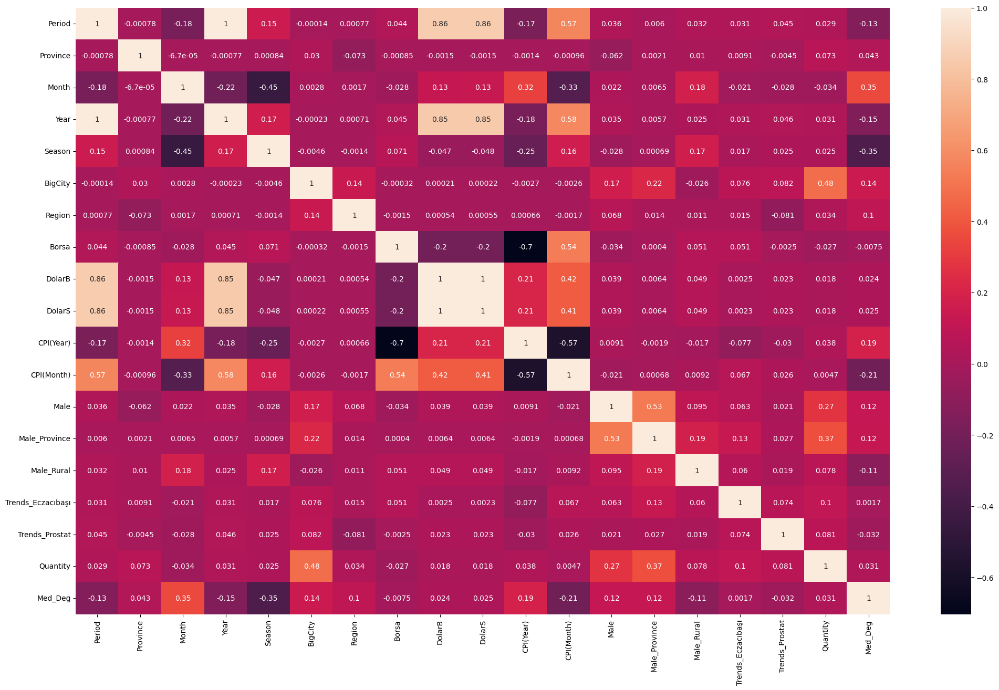

In [ ]:
# Heatmap Correlation:

ProductX_corr = ProductX.copy()

# Dealing with categorical imputs:
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
ProductX_corr['Province'] = labelencoder.fit_transform(ProductX_corr['Province'].values)
ProductX_corr['Season'] = labelencoder.fit_transform(ProductX_corr['Season'].values)
ProductX_corr['Region'] = labelencoder.fit_transform(ProductX_corr['Region'].values)

def show_correlations(df, show_chart = True):
    fig = plt.figure(figsize = (25,15))
    corr = df.corr()
    if show_chart == True:
        sns.heatmap(corr, 
                    xticklabels=corr.columns.values,
                    yticklabels=corr.columns.values,
                    annot=True)
    return corr

show_correlations(ProductX_corr)

# It is aimed to see the correlation between different parameters with each other and the Quantity value. 

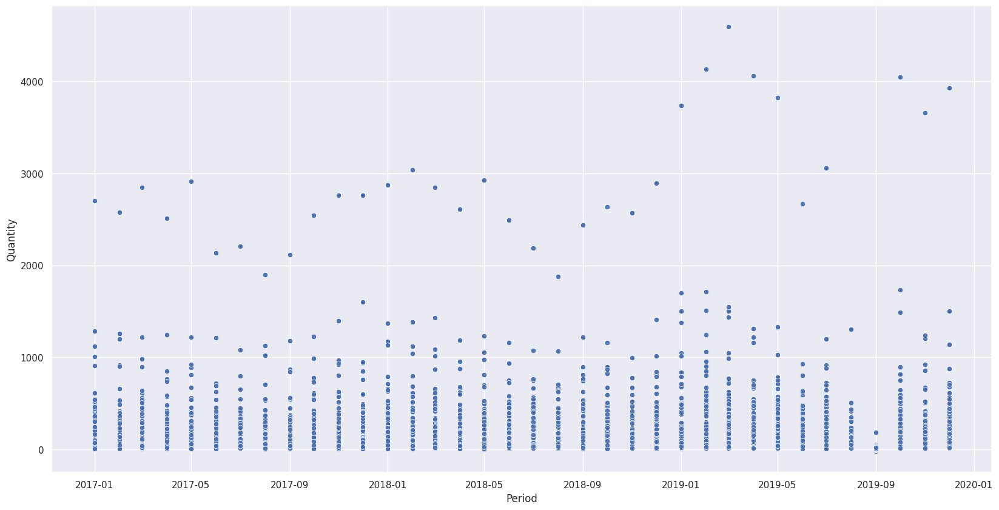

In [ ]:
ProductX['Period'].apply(str)
ProductX['Period'] = pd.to_datetime(ProductX['Period'], format = "%Y%m")

sns.set(rc={'figure.figsize':(20,10)})
sns.scatterplot(data=ProductX, x='Period', y='Quantity', legend=False, sizes=(10,200))

# Theoutliers can affect the results significantly. In this section it is aimed to whether eliminate or not the outliers. In later stages of analyzes it can be seen that holding outliers gives more reasonable results.

Dealing with Variables:

*   CPI(Year) and Borsa features show high correlation with each other. Beacuse of that the feature (Borsa) which correlates weaker with "Quantity" got eliminated.
*   DolarB and DolarS features show high correlation with each other. Beacuse of that one of them (DolarB) got eliminated.
*   Since the predictions are desired to be made without Province variable it's also got eliminated.
* Since te Season variable also shows weak correlation with Quantity, it's also got eliminated.
*   Since Male, Male_Province and Male_Rural almost indicates the same thing, Male and Male_Rural variables eliminated due to lower correlation with Quantity.

In [ ]:
# Giving Back products:

df_givingback= ProductX.loc[ProductX['Quantity']<0]
df_givingback

,Period,Province,Month,Year,Season,BigCity,Region,Borsa,DolarB,DolarS,CPI(Year),CPI(Month),Male,Male_Province,Male_Rural,Trends_Eczacıbaşı,Trends_Prostat,Quantity,Med_Deg
1315,2018-05-01,Gümüşhane,5,2018,spring,0,BS,2.999,4.4342,4.4422,12.15,1.62,84585.0,52299.0,32286.0,0,0,-2.0,15.2
2584,2019-09-01,Bilecik,9,2019,fall,0,MA,3.070,5.7047,5.7150,9.26,0.99,61485.0,92273.0,20978.0,0,0,-6.0,19.2
2588,2019-09-01,Çanakkale,9,2019,fall,0,MA,3.070,5.7047,5.7150,9.26,0.99,1216490.0,163780.0,108566.0,0,0,-1.0,23.4
2595,2019-09-01,Erzurum,9,2019,fall,1,EA,3.070,5.7047,5.7150,9.26,0.99,185788.0,380779.0,0.0,0,0,-22.0,14.5
2612,2019-09-01,Kırıkkale,9,2019,fall,0,CE,3.070,5.7047,5.7150,9.26,0.99,152694.0,132337.0,52761.0,0,38,-7.0,20.7
2620,2019-09-01,Mardin,9,2019,fall,1,SE,3.070,5.7047,5.7150,9.26,0.99,542072.0,916076.0,0.0,0,0,-4.0,25.8


In [ ]:
df_givingback = df_givingback.groupby(['Year','Month','Province']).sum()
df_givingback

# In this section it is aimed to see the count of giving back products. Since they are not too many, it is decided to keep them.

BigCity  Borsa  DolarB  ...  Trends_Prostat  Quantity  Med_Deg
Year Month Province                           ...                                   
2018 5     Gümüşhane        0  2.999  4.4342  ...               0      -2.0     15.2
2019 9     Bilecik          0  3.070  5.7047  ...               0      -6.0     19.2
           Erzurum          1  3.070  5.7047  ...               0     -22.0     14.5
           Kırıkkale        0  3.070  5.7047  ...              38      -7.0     20.7
           Mardin           1  3.070  5.7047  ...               0      -4.0     25.8
           Çanakkale        0  3.070  5.7047  ...               0      -1.0     23.4

[6 rows x 13 columns]

***VISUALIZATION*** 

In [ ]:
a = ProductX.groupby('Region')["Quantity"].sum()
regionDf = a.to_frame().reset_index()

Text(0, 0.5, 'Quantity')

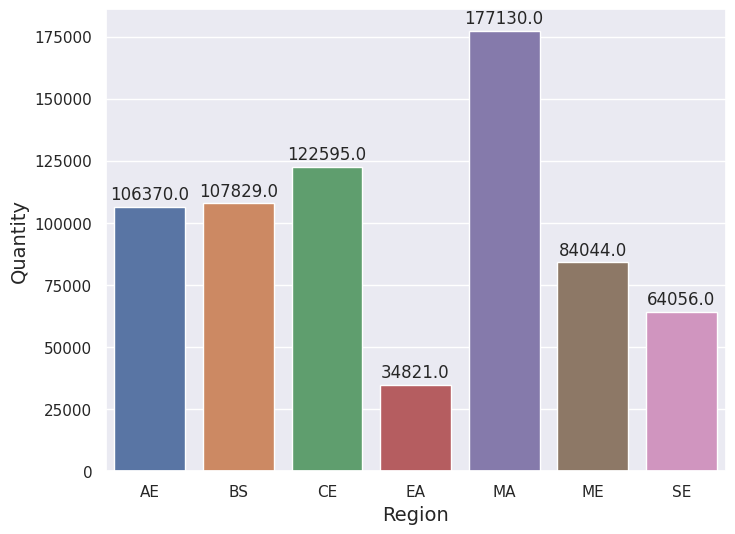

In [ ]:
# Bar plot of Quantity-Region for three years period.

plt.figure(figsize=(8, 6))
splot=sns.barplot(x="Region",y="Quantity",data=regionDf)
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
plt.xlabel("Region", size=14)
plt.ylabel("Quantity", size=14)

In [ ]:
yearBased = ProductX.groupby(["Year","Month"])["Quantity"].sum()
yearBased = yearBased.to_frame().reset_index()

In [ ]:
year2017 = yearBased.loc[yearBased['Year'] == 2017]
year2018 = yearBased.loc[yearBased['Year'] == 2018]
year2019 = yearBased.loc[yearBased['Year'] == 2019]

Text(0, 0.5, 'Quantity')

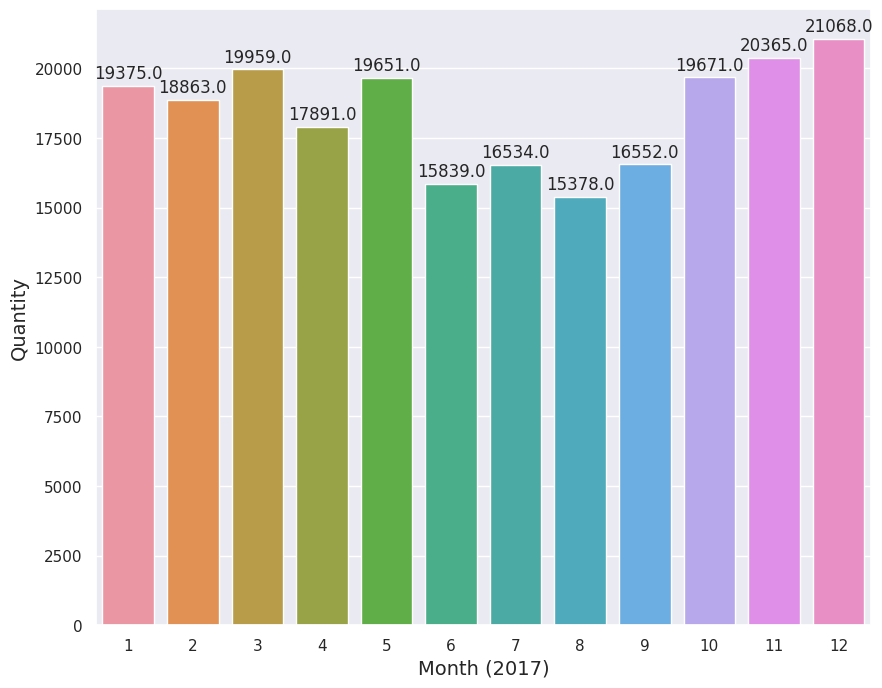

In [ ]:
# Bar plot of Quantity-Region for the year 2017.

plt.figure(figsize=(10, 8))
splot=sns.barplot(x="Month",y="Quantity",data=year2017)
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
plt.xlabel("Month (2017)", size=14)
plt.ylabel("Quantity", size=14)

Text(0, 0.5, 'Quantity')

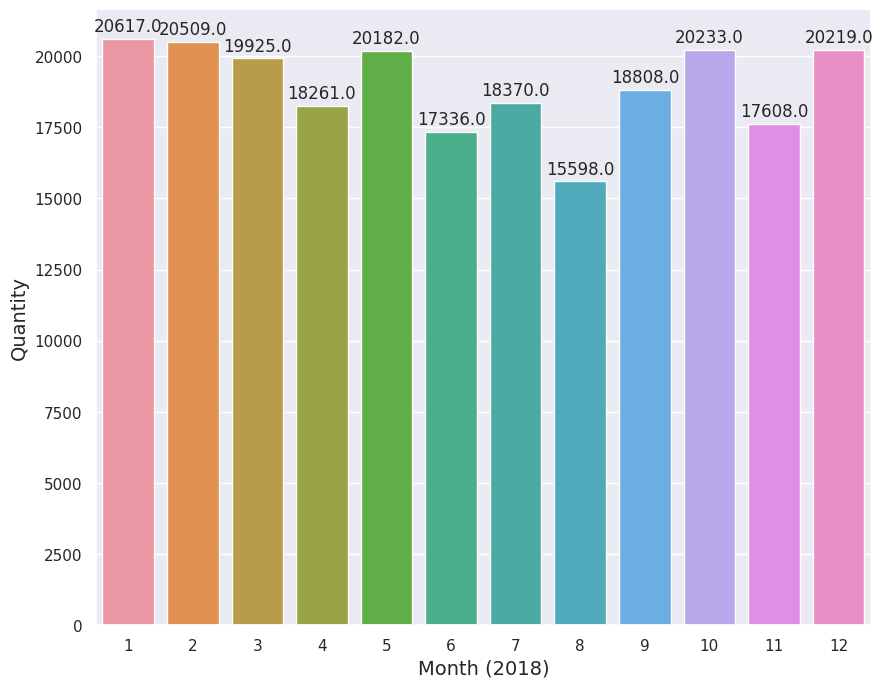

In [ ]:
# Bar plot of Quantity-Region for the year 2018.

plt.figure(figsize=(10, 8))
splot=sns.barplot(x="Month",y="Quantity",data=year2018)
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
plt.xlabel("Month (2018)", size=14)
plt.ylabel("Quantity", size=14)

Text(0, 0.5, 'Quantity')

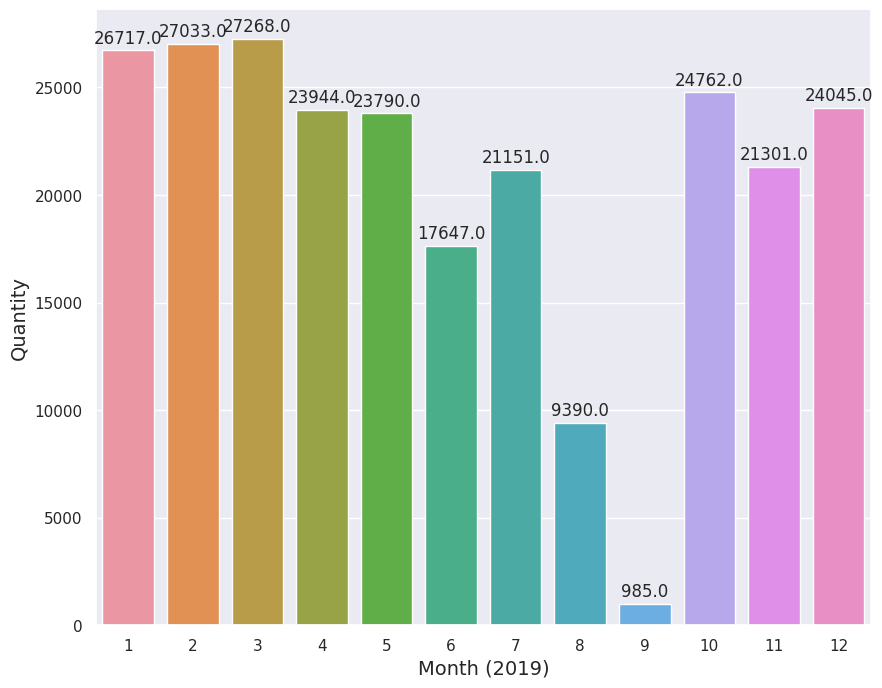

In [ ]:
# Bar plot of Quantity-Region for the year 2019.

plt.figure(figsize=(10, 8))
splot=sns.barplot(x="Month",y="Quantity",data=year2019)
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
plt.xlabel("Month (2019)", size=14)
plt.ylabel("Quantity", size=14)

It can be seen that from the year 2017 to 2019 Product X sold more every year except the excessive decrease on 08-2019 and 09-2019. As a result of the researches, it was thought that a product group similar to Product X was recalled from the market.

In [ ]:
def yearBasedSales(data):  
  plt.figure(figsize=(8, 6))
  splot=sns.barplot(x="Month",y="Quantity",data=data)
  for p in splot.patches:
      splot.annotate(format(p.get_height(), '.1f'), 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha = 'center', va = 'center', 
                    xytext = (0, 9), 
                    textcoords = 'offset points')
  plt.xlabel("Region", size=14)
  plt.ylabel("Quantity", size=14)

<Figure size 4000x2000 with 0 Axes>

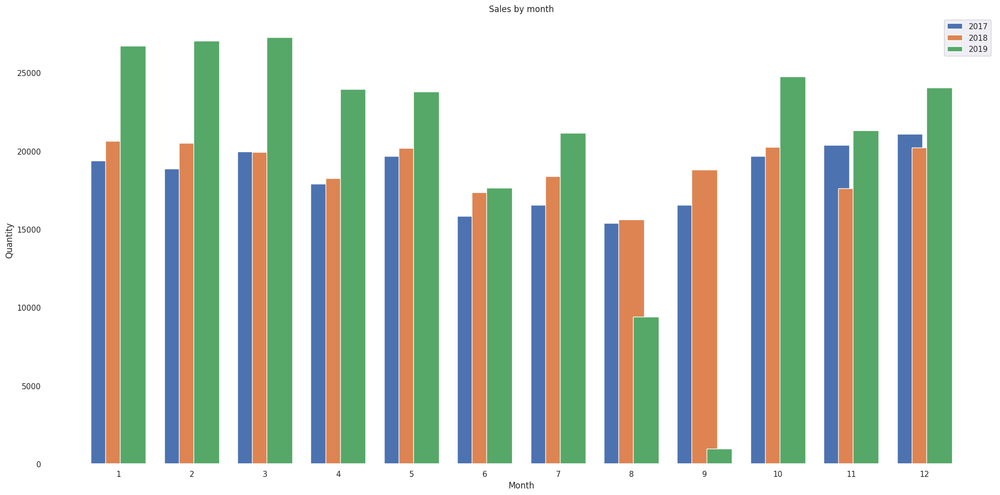

In [ ]:
labels = ['1', '2', '3', '4', '5','6','7','8','9','10','11','12']
sale2017 = year2017['Quantity'].to_list()
sale2018 = year2018['Quantity'].to_list()
sale2019 = year2019['Quantity'].to_list()

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

plt.figure(figsize=(40,20))
fig, ax = plt.subplots()


rects1 = ax.bar(x-0.2,sale2017, width, label='2017')
rects2 = ax.bar(x, sale2018, width, label='2018')
rects3 = ax.bar(x+0.2, sale2019, width, label='2019')
# Add some text for labels, title and custom x-axis tick labels, etc.
# tick labels, etc.
ax.set_ylabel('Quantity')
ax.set_xlabel('Month')
ax.grid(False)
ax.set_facecolor('white')
ax.set_title('Sales by month')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()


fig.tight_layout()

plt.show()


As can be seen from the graph above, an increasing trend is observed in the sales of product X.

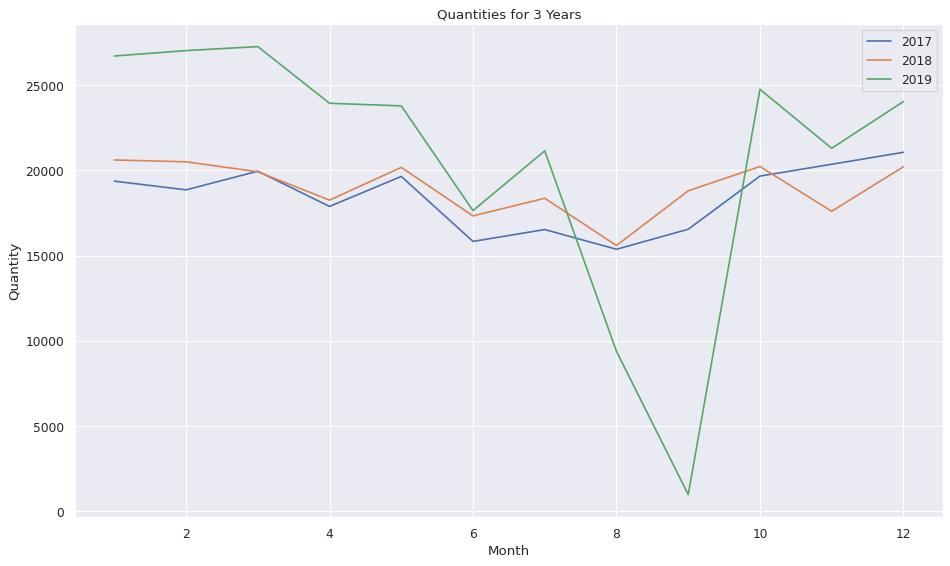

In [ ]:
from matplotlib.pyplot import figure

figure(figsize=(14, 8), dpi=80)
plt.plot(year2017['Month'],year2017['Quantity'], label = "2017")
plt.plot(year2018['Month'], year2018['Quantity'], label = "2018")
plt.plot(year2019['Month'], year2019['Quantity'], label = "2019")
plt.title('Quantities for 3 Years')
plt.xlabel('Month')
plt.ylabel('Quantity')
plt.legend()
plt.show()

The sudden decrease mentioned above can be seen quite clearly in this chart.

In [ ]:
provinceBased = ProductX.groupby(["Province"])["Quantity"].sum()
provinceBased = provinceBased.to_frame().reset_index()
provinceBased= provinceBased.sort_values(by=['Quantity'], ascending=False)
provinceBased = provinceBased[:10]

In [ ]:
provinceBased

,Province,Quantity
77,İstanbul,100631.0
5,Ankara,43474.0
29,Gaziantep,35620.0
78,İzmir,32752.0
44,Konya,25282.0
9,Aydın,24297.0
0,Adana,23507.0
61,Samsun,17604.0
41,Kayseri,17209.0
6,Antalya,16949.0


Text(0, 0.5, 'Quantity')

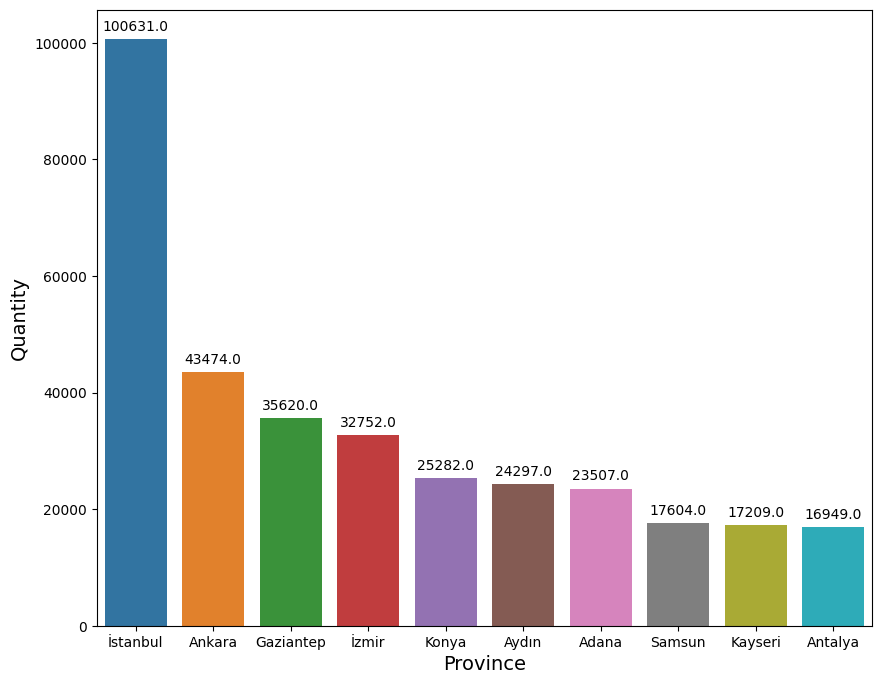

In [ ]:
# Bar plot of Quantity-Province for three-year period. It can be seen that densely populated metropolitan areas like Istanbul, Ankara, Gaziantep etc. are on the top of the most-sold list.

plt.figure(figsize=(10, 8))
plt.style.use('default')
splot=sns.barplot(x="Province",y="Quantity",data=provinceBased)
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')

plt.xlabel("Province", size=14)
plt.ylabel("Quantity", size=14)



In [ ]:
provinceBased = ProductX.groupby(["Province"])["Quantity"].sum()
provinceBased = provinceBased.to_frame().reset_index()
provinceBased= provinceBased.sort_values(by=['Quantity'], ascending=False)
provinceBased = provinceBased[:10]

In [ ]:
provinceBased = ProductX.groupby(["Province","Year"])["Quantity"].sum()
provinceBased = provinceBased.to_frame().reset_index()

In [ ]:
provinceBased2017 = provinceBased.loc[provinceBased['Year'] == 2017]
provinceBased2017= provinceBased2017.sort_values(by=['Quantity'], ascending=False)
provinceBased2017 = provinceBased2017[:10]
provinceBased2017

,Province,Year,Quantity
308,İstanbul,2017,29996.0
20,Ankara,2017,14902.0
116,Gaziantep,2017,11636.0
312,İzmir,2017,10466.0
0,Adana,2017,8618.0
36,Aydın,2017,7767.0
176,Konya,2017,7052.0
24,Antalya,2017,5831.0
80,Bursa,2017,5339.0
200,Manisa,2017,5298.0


In [ ]:
provinceBased2018 = provinceBased.loc[provinceBased['Year'] == 2018]
provinceBased2018= provinceBased2018.sort_values(by=['Quantity'], ascending=False)
provinceBased2018 = provinceBased2018[:10]
provinceBased2018

,Province,Year,Quantity
309,İstanbul,2018,31410.0
21,Ankara,2018,14295.0
117,Gaziantep,2018,11547.0
313,İzmir,2018,10303.0
177,Konya,2018,9221.0
37,Aydın,2018,7996.0
1,Adana,2018,7180.0
165,Kayseri,2018,6604.0
25,Antalya,2018,5999.0
81,Bursa,2018,5458.0


In [ ]:
provinceBased2019 = provinceBased.loc[provinceBased['Year'] == 2019]
provinceBased2019 = provinceBased2019.sort_values(by=['Quantity'], ascending=False)
provinceBased2019 = provinceBased2019[:10]
provinceBased2019

,Province,Year,Quantity
310,İstanbul,2019,39225.0
22,Ankara,2019,14277.0
118,Gaziantep,2019,12437.0
314,İzmir,2019,11983.0
178,Konya,2019,9009.0
38,Aydın,2019,8534.0
2,Adana,2019,7709.0
246,Samsun,2019,7145.0
202,Manisa,2019,6443.0
166,Kayseri,2019,6336.0


Text(0, 0.5, 'Quantity')

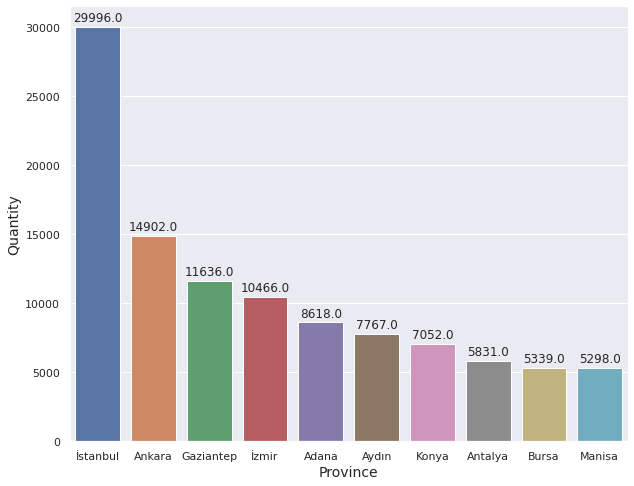

In [ ]:
# Bar plot of Quantity-Province for the year 2017.

plt.figure(figsize=(10, 8))
splot=sns.barplot(x="Province",y="Quantity",data=provinceBased2017)
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
plt.xlabel("Province", size=14)
plt.ylabel("Quantity", size=14)

Text(0, 0.5, 'Quantity')

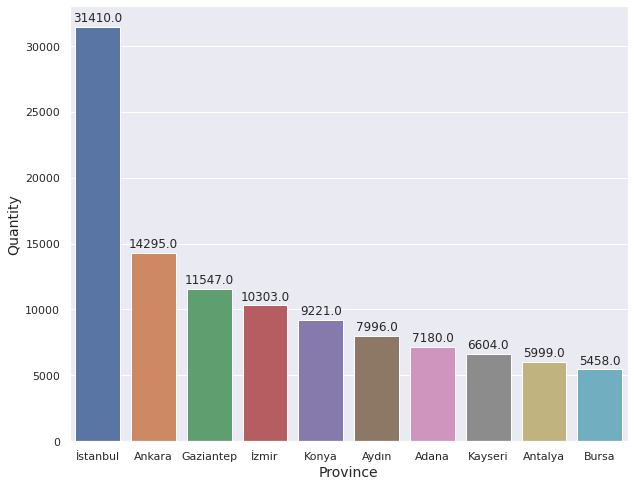

In [ ]:
# Bar plot of Quantity-Province for the year 2018.

plt.figure(figsize=(10, 8))
splot=sns.barplot(x="Province",y="Quantity",data=provinceBased2018)
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
plt.xlabel("Province", size=14)
plt.ylabel("Quantity", size=14)

Text(0, 0.5, 'Quantity')

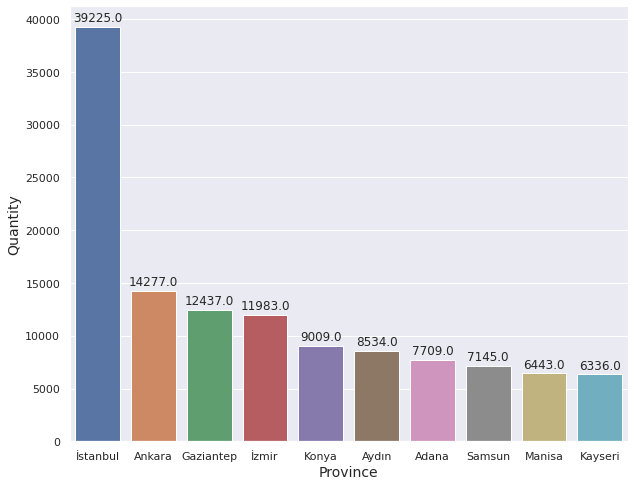

In [ ]:
# Bar plot of Quantity-Province for the year 2019.

plt.figure(figsize=(10, 8))
splot=sns.barplot(x="Province",y="Quantity",data=provinceBased2019)
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
plt.xlabel("Province", size=14)
plt.ylabel("Quantity", size=14)

In this section, it is aimed to show the sales of Product X on the map of Turkey.

In [ ]:
df_tr_map = pd.read_csv('gdrive/My Drive/VitrA/Product_X_ALL_LAST.csv', sep=";")

In [ ]:
df_tr_map.rename(columns={ df_tr_map.columns[1]: "Province" }, inplace = True)

In [ ]:
response = requests.get('https://gist.githubusercontent.com/mebaysan/9be56dd1ca5659c0ff7ea5e2b5cf6479/raw/6d7a77d8a2892bd59f401eb87bd82d7f48642a58/turkey-geojson.json')

In [ ]:
geojson = response.json()

In [ ]:
geoDict = {}
for i in geojson['features']:
    geoDict[i['properties']['name']] = i['id']

In [ ]:
ProductVmap = df_tr_map.groupby(['Province','Year'])['Quantity'].sum()
ProductVmap = ProductVmap.reset_index()
ProductVmap17 = ProductVmap[ProductVmap['Year']==2017].groupby(['Province'])['Quantity'].sum()
ProductVmap17 = ProductVmap17.reset_index()
ProductVmap18 = ProductVmap[ProductVmap['Year']==2018].groupby(['Province'])['Quantity'].sum()
ProductVmap18 = ProductVmap18.reset_index()
ProductVmap19 = ProductVmap[ProductVmap['Year']==2019].groupby(['Province'])['Quantity'].sum()
ProductVmap19 = ProductVmap19.reset_index()

In [ ]:
ProductVmap['GeoID'] = ProductVmap['Province'].str.capitalize().apply(lambda x: geoDict[x])

ProductVmap17['GeoID'] = ProductVmap17['Province'].str.capitalize().apply(lambda x: geoDict[x])
ProductVmap18['GeoID'] = ProductVmap18['Province'].str.capitalize().apply(lambda x: geoDict[x])
ProductVmap19['GeoID'] = ProductVmap19['Province'].str.capitalize().apply(lambda x: geoDict[x])

In [ ]:
fig = px.choropleth_mapbox(
ProductVmap17,  
geojson=geojson,
locations='GeoID',
color='Quantity',                           
color_continuous_scale="Viridis", 
center={'lat': 38.7200, 'lon': 34.0000},
labels={'Quantity': 'Quantity'},
mapbox_style="carto-positron",
zoom=4.8,
opacity=0.5,
custom_data=[ProductVmap17['Province'],
ProductVmap17['Quantity']]
)
# Some make-up for plot
fig.update_layout(
title='Quantity Ordered From Each Province for Product X - 2017',
title_x=0.5
)
# I created my own hover template for on hover event
hovertemp = '<i style="color:red;">Province:</i> %{customdata[0]}<br>'
hovertemp += '<i>Quantity:</i> %{customdata[1]:,f}<br>'
# I set my own hover template
fig.update_traces(hovertemplate=hovertemp) 
fig.show()

In [ ]:
fig = px.choropleth_mapbox(
ProductVmap18,  
geojson=geojson,
locations='GeoID',
color='Quantity',                           
color_continuous_scale="Viridis", 
center={'lat': 38.7200, 'lon': 34.0000},
labels={'Quantity': 'Quantity'},
mapbox_style="carto-positron",
zoom=4.8,
opacity=0.5,
custom_data=[ProductVmap18['Province'],
ProductVmap18['Quantity']]
)
# Some make-up for plot
fig.update_layout(
title='Quantity Ordered From Each Province for Product X - 2018',
title_x=0.5
)
# I created my own hover template for on hover event
hovertemp = '<i style="color:red;">Province:</i> %{customdata[0]}<br>'
hovertemp += '<i>Quantity:</i> %{customdata[1]:,f}<br>'
# I set my own hover template
fig.update_traces(hovertemplate=hovertemp) 
fig.show()

In [ ]:
fig = px.choropleth_mapbox(
ProductVmap19,  
geojson=geojson,
locations='GeoID',
color='Quantity',                           
color_continuous_scale="Viridis", 
center={'lat': 38.7200, 'lon': 34.0000},
labels={'Quantity': 'Quantity'},
mapbox_style="carto-positron",
zoom=4.8,
opacity=0.5,
custom_data=[ProductVmap19['Province'],
ProductVmap19['Quantity']]
)
# Some make-up for plot
fig.update_layout(
title='Quantity Ordered From Each Province for Product X - 2019',
title_x=0.5
)
# I created my own hover template for on hover event
hovertemp = '<i style="color:red;">Province:</i> %{customdata[0]}<br>'
hovertemp += '<i>Quantity:</i> %{customdata[1]:,f}<br>'
# I set my own hover template
fig.update_traces(hovertemplate=hovertemp) 
fig.show()

In [ ]:
# Dealing with categorical imputs:

# Since machine learning algorithms cannot work with categorical variables, they have been transformed into numerical type with the "label encoding" method.
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()

ProductX['Province'] = labelencoder.fit_transform(ProductX['Province'].values)
ProductX['Season'] = labelencoder.fit_transform(ProductX['Season'].values)
ProductX['Region'] = labelencoder.fit_transform(ProductX['Region'].values)

In [ ]:
ProductX.dtypes

Period               datetime64[ns]
Province                      int64
Month                         int64
Year                          int64
Season                        int64
BigCity                       int64
Region                        int64
Borsa                       float64
DolarB                      float64
DolarS                      float64
CPI(Year)                   float64
CPI(Month)                  float64
Male                        float64
Male_Province               float64
Male_Rural                  float64
Trends_Eczacıbaşı             int64
Trends_Prostat                int64
Quantity                    float64
Med_Deg                     float64
dtype: object

*Creating Subdatasets:*

In this section it is aimed to create different datasets with different input variables. Since the different variables with different correlations can affect the results significantly, the least correlated variables wtih Quantity value elimiated from datasets.

In [ ]:
##################--- DataFrames for Train ---##################


# Dataset which excluded the Period, DolarB, Male_Rural variables:
X_1 = ProductX.iloc[:2881, [1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12 ,13, 15, 16, 18]].values
y_1 = ProductX.iloc[:2881, 17].values

# Dataset which excluded the Period, Province, DolarB, Male_Rural variables:
X_2 = ProductX.iloc[:2881, [2, 3, 4, 5, 6, 7, 9, 10, 11 ,13, 15, 16, 18]].values
y_2 = ProductX.iloc[:2881, 17].values

# Dataset which excluded the Period, Province, DolarB, Borsa, Male, Male_Rural variables:
X_3 = ProductX.iloc[:2881, [2, 3, 4, 5, 6, 9, 10, 11 ,13, 15, 16, 18]].values
y_3 = ProductX.iloc[:2881, 17].values

##################--- DataFrames for Test ---##################

# Dataset which excluded the Period, DolarB, Male_Rural variables:
X_1_2020 = ProductX.iloc[2881:, [1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12 ,13, 15, 16, 18]].values
y_1_2020 = ProductX.iloc[2881:, 17].values

# Dataset which excluded the Period, Province, DolarB, Male_Rural variables:
X_2_2020 = ProductX.iloc[:2916, [2, 3, 4, 5, 6, 7, 9, 10, 11 ,13, 15, 16, 18]].values
y_2_2020 = ProductX.iloc[2881:, 17].values

# Dataset which excluded the Period, Province, DolarB, Borsa, Male, Male_Rural variables:
X_3_2020 = ProductX.iloc[2881:, [2, 3, 4, 5, 6, 9, 10, 11 ,13, 15, 16, 18]].values
y_3_2020 = ProductX.iloc[2881:, 17].values

Since the distributions of the datas are quite different, the input parameters must be brought to the same scale in order for the results to be more reliable. Therefore, in this section, the training and test data  are scaled to scatter around 0, but 2020 datas:

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_1 = scaler.fit_transform(X_1)
X_2 = scaler.fit_transform(X_2)
X_3 = scaler.fit_transform(X_3)

X_1_2020 = scaler.fit_transform(X_1_2020)
X_2_2020 = scaler.fit_transform(X_2_2020)
X_3_2020 = scaler.fit_transform(X_3_2020)

In [ ]:
# Splitting dataset:
from sklearn.model_selection import train_test_split

X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(X_1, y_1, test_size=0.3, shuffle=False, random_state = 42)
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X_2, y_2, test_size=0.3, shuffle=False, random_state = 42)
X_train_3, X_test_3, y_train_3, y_test_3 = train_test_split(X_3, y_3, test_size=0.3, shuffle=False, random_state = 42)

*Machine Learning Algorithms*

In [ ]:
from sklearn.linear_model import Ridge # Ridge algorithm
from sklearn.linear_model import Lasso # Lasso algorithm
from sklearn.linear_model import BayesianRidge # Bayesian algorithm
from sklearn.linear_model import ElasticNet #
lasso = Lasso(alpha = 0.01)

def lasso_model(X_train, y_train, X_test, y_test):
  lasso.fit(X_train, y_train)
  en_yhat = lasso.predict(X_test)
  elasricR2 = r2_score(y_test, en_yhat)
  print(elasricR2)

In [ ]:
lasso_model(X_train_1, y_train_1, X_test_1, y_test_1)
lasso_model(X_train_2, y_train_2, X_test_2, y_test_2)
lasso_model(X_train_3, y_train_3, X_test_3, y_test_3)

-0.059019854038015795
0.2457174034550853
0.24576318371448802


In [ ]:
# Since Mean Absolute Percentage Error (MAPE) is available with the new version (0.24) of sklearn and there is an error in importing the new version to Colab, the related error metric is defined as a function:

def mape(y_true, y_pred): 
    #y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [ ]:
# The distribution of the actual values and the predictions made by the algorithms is intended to be shown not only with numerical error metrics, but also with visual graphics:

def predVisualization(test_pred,y_test):
  x_ax = range(len(test_pred))
  figure(figsize=(50, 10), dpi=80)
  plt.scatter(x_ax, y_test, lw=6, color="blue", label="original")
  plt.scatter(x_ax, test_pred, lw=4, color="red", label="predicted_rtc")
  plt.legend()
  plt.style.use('default')
  plt.show()

In [ ]:
# Differnce between :

def errorVisualization(test_pred,y_test):
  diffs = abs(test_pred-y_test)
  x_ax = range(len(test_pred))
  figure(figsize=(50, 10), dpi=80)
  plt.style.use('default')
  plt.plot(x_ax, test_pred-y_test, lw=6, color="blue", label="difference")
  plt.legend()
  plt.show()

In [ ]:
def LinearRes(X_train,Y_train,X_test,Y_test,X_pred, Predict="False"):
  lr = LinearRegression()
  model = lr.fit(X_train, Y_train)
  train_preds_linReg = lr.predict(X_train)
  test_preds_linReg = lr.predict(X_test)

  #linReg Metrics
  mae_linReg_train = mean_absolute_error(Y_train, train_preds_linReg)
  mae_linReg_test = mean_absolute_error(Y_test, test_preds_linReg)
  print('MAE Train: ', mae_linReg_train)
  print('MAE Test: ',mae_linReg_test)

  mse_linReg_train = mean_squared_error(Y_train, train_preds_linReg)
  mse_linReg_test = mean_squared_error(Y_test, test_preds_linReg)
  print('MSE Train: ', mse_linReg_train)
  print('MSE Test: ',mse_linReg_test)

  rmse_linReg_train = mean_squared_error(Y_train, train_preds_linReg, squared=False)
  rmse_linReg_test = mean_squared_error(Y_test, test_preds_linReg, squared=False)
  print('RMSE Train: ', rmse_linReg_train)
  print('RMSE Test: ',rmse_linReg_test)

  r2_linReg_train = r2_score(Y_train, train_preds_linReg)
  r2_linReg_test = r2_score(Y_test, test_preds_linReg)
  print('R2 Train: ', r2_linReg_train)
  print('R2 Test: ',r2_linReg_test)

  mape_train = mape(Y_train, train_preds_linReg)
  mape_test = mape(Y_test, test_preds_linReg)
  print('Mape Train: ', mape_train)
  print('Mape Test: ',mape_test)

  explained_variance__train = explained_variance_score(Y_train, train_preds_linReg)
  explained_variance__test = explained_variance_score(Y_test, test_preds_linReg)
  print('Explanied Variance Score Train: ', explained_variance__train)
  print('Explanied Variance Score Test: ',explained_variance__test)

  CoV = rmse_linReg_test/np.mean(Y_test)
  print('CoV Test: ', CoV)

  if Predict:
    predictions = lr.predict(X_pred)
    df = pd.DataFrame(predictions, columns=['2020_Predictions'])  
    df_2020_01 = df.iloc[0:81,:].values
    df_2020_02 = df.iloc[81:163,:].values
    df_2020_03 = df.iloc[162:244,:].values
    df_2020_04 = df.iloc[244:325,:].values
    df_2020_01 = (pd.DataFrame(df_2020_01)).sum() 
    df_2020_02 = (pd.DataFrame(df_2020_02)).sum() 
    df_2020_03 = (pd.DataFrame(df_2020_03)).sum() 
    df_2020_04 = (pd.DataFrame(df_2020_04)).sum()
    print("2020_01: ", round(df_2020_01, 0))
    print("2020_02: ", round(df_2020_02, 0))
    print("2020_03: ", round(df_2020_03, 0))
    print("2020_04: ", round(df_2020_04, 0))

  errorVisualization(test_preds_linReg, Y_test)

  predVisualization(test_preds_linReg,Y_test)

Results for X_1:
MAE Train:  152.25036517862006
MAE Test:  192.17390797408214
MSE Train:  86302.43253367256
MSE Test:  219131.54321801357
RMSE Train:  293.7727566226531
RMSE Test:  468.11488250002645
R2 Train:  0.34152034070941906
R2 Test:  -0.06498207679509482
Mape Train:  180.23593244354325
Mape Test:  380.9028216508279
Explanied Variance Score Train:  0.34152034070941895
Explanied Variance Score Test:  -0.064981514592656
CoV Test:  1.8621349068633237
2020_01:  0    26661.0
dtype: float64
2020_02:  0    27388.0
dtype: float64
2020_03:  0    26768.0
dtype: float64
2020_04:  0    23915.0
dtype: float64


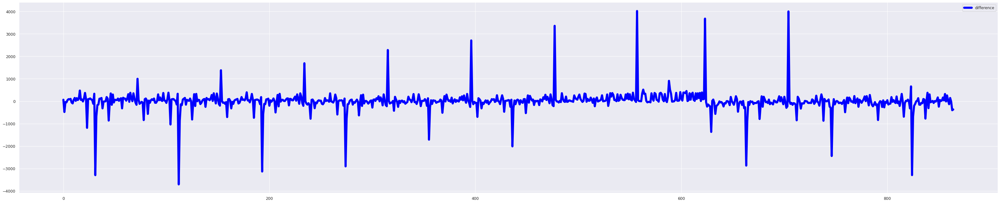

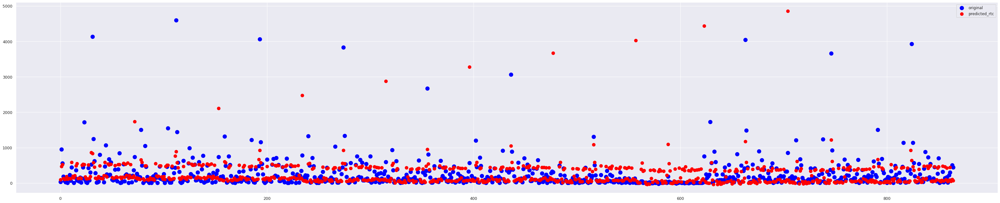

Results for X_2:
MAE Train:  151.126610227723
MAE Test:  174.74413226125978
MSE Train:  86938.53532704353
MSE Test:  155233.6894840129
RMSE Train:  294.85341328708324
RMSE Test:  393.99706786220236
R2 Train:  0.3366669346308675
R2 Test:  0.24556230204260787
Mape Train:  184.90032371547508
Mape Test:  303.94888356435007
Explanied Variance Score Train:  0.3366669346308674
Explanied Variance Score Test:  0.25021043414983823
CoV Test:  1.567298372035765
2020_01:  0    19990.0
dtype: float64
2020_02:  0    19307.0
dtype: float64
2020_03:  0    19279.0
dtype: float64
2020_04:  0    19472.0
dtype: float64


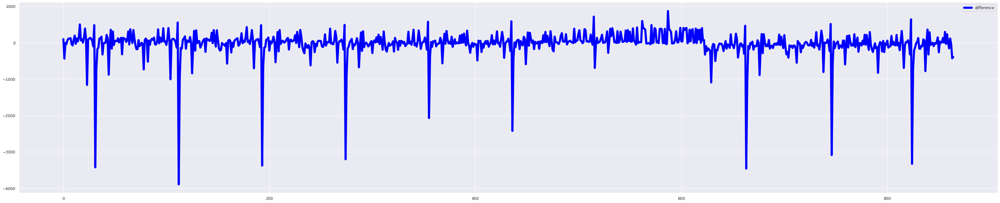

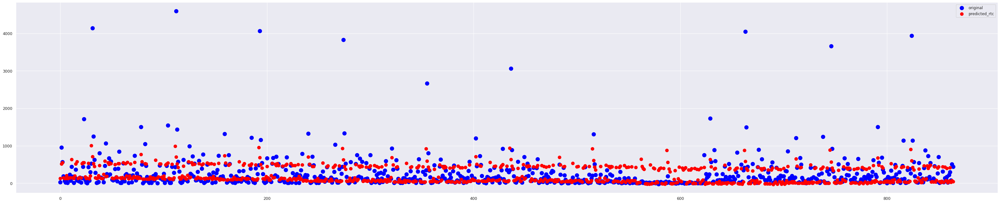

Results for X_3:
MAE Train:  151.12453756899407
MAE Test:  174.64264648174537
MSE Train:  86939.00332756931
MSE Test:  155223.9385649328
RMSE Train:  294.8542069015962
RMSE Test:  393.98469331299253
R2 Train:  0.33666336382970097
R2 Test:  0.24560969163289725
Mape Train:  184.89630685224694
Mape Test:  302.835680697269
Explanied Variance Score Train:  0.33666336382970097
Explanied Variance Score Test:  0.25043879256043633
CoV Test:  1.5672491467688447
2020_01:  0    26727.0
dtype: float64
2020_02:  0    27261.0
dtype: float64
2020_03:  0    26626.0
dtype: float64
2020_04:  0    23726.0
dtype: float64


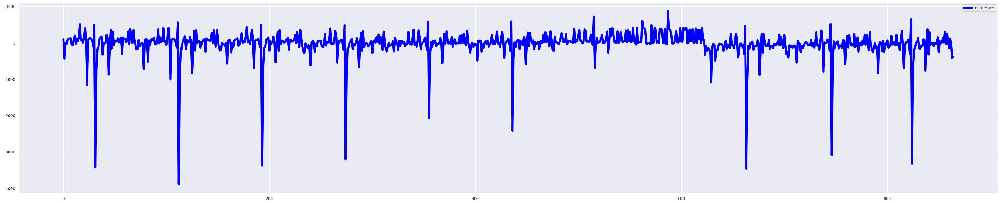

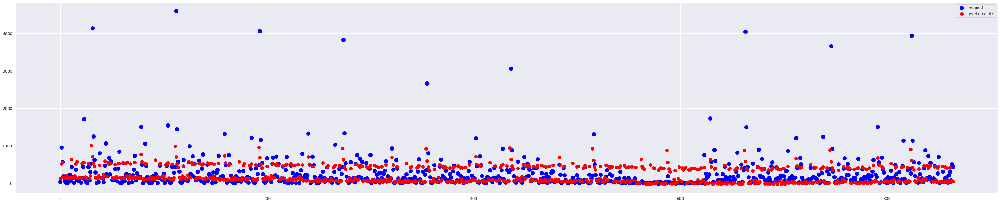

In [ ]:
print("Results for X_1:")
LinearRes(X_train_1, y_train_1, X_test_1, y_test_1, X_1_2020)
print("Results for X_2:")
LinearRes(X_train_2, y_train_2, X_test_2, y_test_2, X_2_2020)
print("Results for X_3:")
LinearRes(X_train_3, y_train_3, X_test_3, y_test_3, X_3_2020)

In [ ]:
def KNN(X_train,Y_train,X_test,Y_test,X_pred, Predict="False"):
  knn_reg = KNeighborsRegressor(n_neighbors=2)
  knn_reg.fit(X_train, Y_train)
  train_preds_knn_reg = knn_reg.predict(X_train)
  test_preds_knn_reg = knn_reg.predict(X_test)

  #KNN Metrics:
  mae_knn_train = mean_absolute_error(Y_train, train_preds_knn_reg)
  mae_knn_test = mean_absolute_error(Y_test, test_preds_knn_reg)
  print('mae_knn_train: ', mae_knn_train)
  print('mae_knn_test: ',mae_knn_test)

  mse_knn_train = mean_squared_error(Y_train, train_preds_knn_reg)
  mse_knn_test = mean_squared_error(Y_test, test_preds_knn_reg)
  print('mse_knn_train: ',mse_knn_train)
  print('mse_knn_test: ', mse_knn_test)

  rmse_knn_train = mean_squared_error(Y_train, train_preds_knn_reg, squared=False)
  rmse_knn_test = mean_squared_error(Y_test, test_preds_knn_reg, squared=False)
  print('rmse_knn_train: ',rmse_knn_train)
  print('rmse_knn_test: ',rmse_knn_test)

  r2_knn_train = r2_score(Y_train, train_preds_knn_reg)
  r2_knn_test = r2_score(Y_test, test_preds_knn_reg)
  print('r2_knn_train: ', r2_knn_train)
  print('r2_knn_test: ', r2_knn_test)

  mape_train = mape(Y_train, train_preds_knn_reg)
  mape_test = mape(Y_test, test_preds_knn_reg)
  print('Mape Train: ', mape_train)
  print('Mape Test: ',mape_test)

  explained_variance__train = explained_variance_score(Y_train, train_preds_knn_reg)
  explained_variance__test = explained_variance_score(Y_test, test_preds_knn_reg)
  print('Explanied Variance Score Train: ', explained_variance__train)
  print('Explanied Variance Score Test: ',explained_variance__test)

  CoV = rmse_knn_test/np.mean(Y_test)
  print('CoV Test: ', CoV)

  if Predict:
    predictions = knn_reg.predict(X_pred)
    df = pd.DataFrame(predictions, columns=['2020_Predictions'])  
    df_2020_01 = df.iloc[0:81,:].values
    df_2020_02 = df.iloc[81:163,:].values
    df_2020_03 = df.iloc[162:244,:].values
    df_2020_04 = df.iloc[244:325,:].values
    df_2020_01 = (pd.DataFrame(df_2020_01)).sum() 
    df_2020_02 = (pd.DataFrame(df_2020_02)).sum() 
    df_2020_03 = (pd.DataFrame(df_2020_03)).sum() 
    df_2020_04 = (pd.DataFrame(df_2020_04)).sum()
    print("2020_01: ", round(df_2020_01, 0))
    print("2020_02: ", round(df_2020_02, 0))
    print("2020_03: ", round(df_2020_03, 0))
    print("2020_04: ", round(df_2020_04, 0))

  errorVisualization(test_preds_knn_reg, Y_test)

  predVisualization(test_preds_knn_reg,Y_test)

mae_knn_train:  83.12872023809524
mae_knn_test:  144.48612716763006
mse_knn_train:  23221.408854166668
mse_knn_test:  66076.92803468207
rmse_knn_train:  152.38572391850448
rmse_knn_test:  257.05432895534375
r2_knn_train:  0.8228227763502154
r2_knn_test:  0.6788652924485452
Mape Train:  113.65970767804737
Mape Test:  365.4425500604433
Explanied Variance Score Train:  0.8229186020396572
Explanied Variance Score Test:  0.6792158555097056
CoV Test:  1.0225477907296532
2020_01:  0    20678.0
dtype: float64
2020_02:  0    18229.0
dtype: float64
2020_03:  0    15582.0
dtype: float64
2020_04:  0    15698.0
dtype: float64


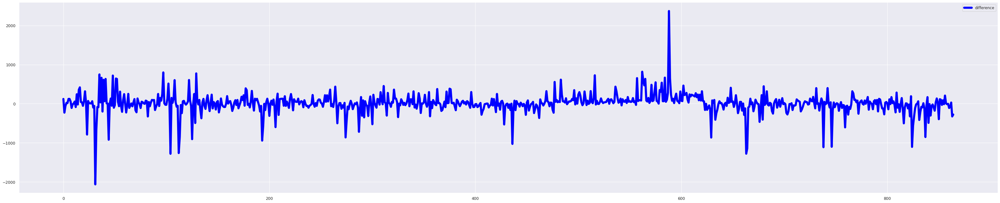

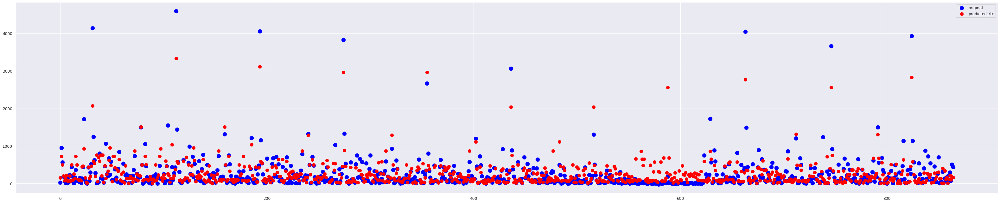

mae_knn_train:  89.88219246031746
mae_knn_test:  161.7057803468208
mse_knn_train:  32302.42224702381
mse_knn_test:  93656.2528901734
rmse_knn_train:  179.72874630126313
rmse_knn_test:  306.03309116854246
r2_knn_train:  0.7535354755246136
r2_knn_test:  0.5448294241756417
Mape Train:  93.66911932475998
Mape Test:  426.0557387197862
Explanied Variance Score Train:  0.7536088435350932
Explanied Variance Score Test:  0.5449866222119107
CoV Test:  1.2173825764238475
2020_01:  0    19332.0
dtype: float64
2020_02:  0    18770.0
dtype: float64
2020_03:  0    19862.0
dtype: float64
2020_04:  0    18404.0
dtype: float64


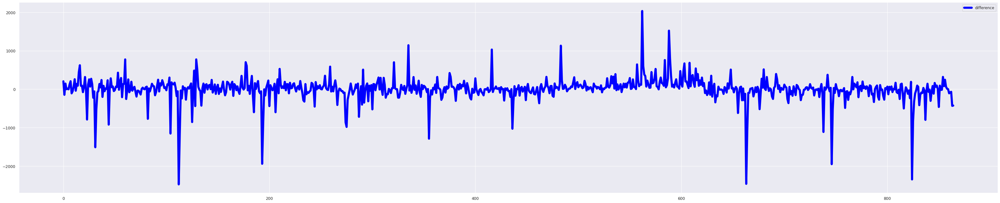

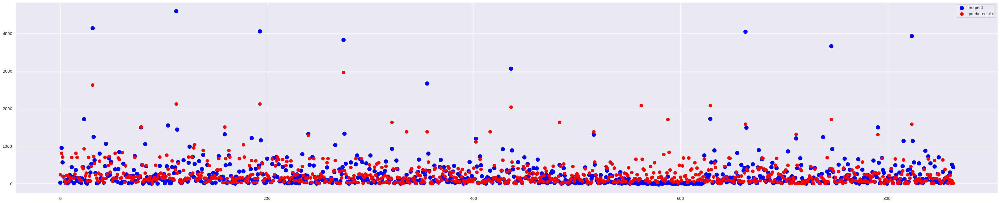

mae_knn_train:  87.27951388888889
mae_knn_test:  159.4242774566474
mse_knn_train:  29788.374379960318
mse_knn_test:  88561.67225433527
rmse_knn_train:  172.59308902722705
rmse_knn_test:  297.5931320684926
r2_knn_train:  0.7727174305905763
r2_knn_test:  0.5695891506224957
Mape Train:  92.15074004910942
Mape Test:  421.2571817409933
Explanied Variance Score Train:  0.7727300384308384
Explanied Variance Score Test:  0.569596176035581
CoV Test:  1.1838088896212264
2020_01:  0    19907.0
dtype: float64
2020_02:  0    14061.0
dtype: float64
2020_03:  0    14430.0
dtype: float64
2020_04:  0    14004.0
dtype: float64


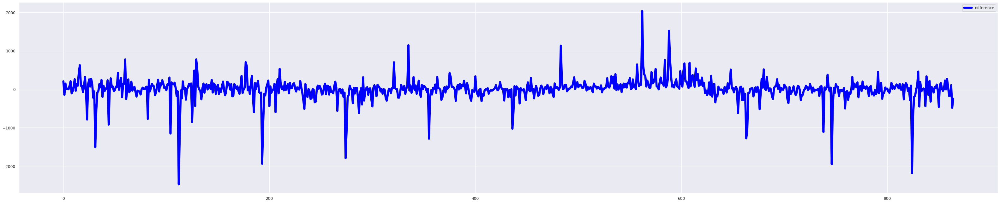

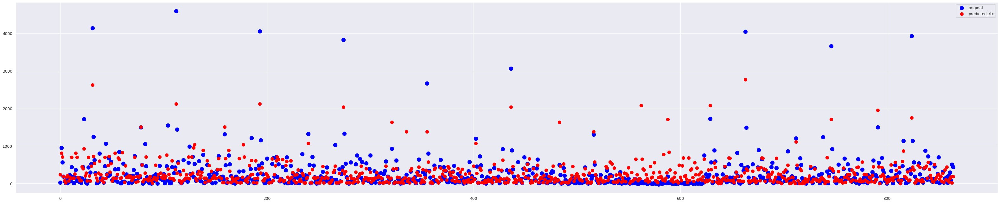

In [ ]:
KNN(X_train_1, y_train_1, X_test_1, y_test_1, X_1_2020)
KNN(X_train_2, y_train_2, X_test_2, y_test_2, X_2_2020)
KNN(X_train_3, y_train_3, X_test_3, y_test_3, X_3_2020)

Since XGBOOST algorithm usualy gives better results than other algorithms in some cases, grid search was performed to find the best possible result:

In [ ]:
from sklearn.model_selection import GridSearchCV

parameters_xgb = {
        'n_estimators': [50,100,200,300,500],
        'subsample': [0, 0.5, 1], 
        'gamma' : [0, 1, 3, 6],
        'max_depth': [3, 4, 5], 
        'learning_rate': [0.001, 0.005, 0.1, 0.05],
        }

In [ ]:
def XGB_2(X_train,Y_train,X_test,Y_test,X_pred, Predict="False"):
  
  xgboost = XGBRegressor(objective='reg:squarederror')
  xgboost_cv = GridSearchCV(xgboost, parameters_xgb, cv = 4, verbose = 3)
  xgboost_cv.fit(X_train, Y_train)
  best = xgboost_cv.best_params_
  best_values = best.values()
  best_values_list = list(best_values)
  xgboost = XGBRegressor(gamma = best_values_list[0],
                         learning_rate = best_values_list[1],
                         max_depth = best_values_list[2],
                         n_estimators = best_values_list[3],
                         subsample = best_values_list[4])
  xgb_tuned =  xgboost.fit(X_train, Y_train)  

  train_preds_xgb_reg = xgb_tuned.predict(X_train)
  test_preds_xgb_reg = xgb_tuned.predict(X_test)

  #XGB Metrics:
  mae_xgb_train = mean_absolute_error(Y_train, train_preds_xgb_reg)
  mae_xgb_test = mean_absolute_error(Y_test, test_preds_xgb_reg)
  print('MAE Train: ', mae_xgb_train)
  print('MAE Test: ',mae_xgb_test)

  mse_xgb_train = mean_squared_error(Y_train, train_preds_xgb_reg)
  mse_xgb_test = mean_squared_error(Y_test, test_preds_xgb_reg)
  print('MSE Train: ', mse_xgb_train)
  print('MSE Test: ',mse_xgb_test)

  rmse_xgb_train = mean_squared_error(Y_train, train_preds_xgb_reg, squared=False)
  rmse_xgb_test = mean_squared_error(Y_test, test_preds_xgb_reg, squared=False)
  print('RMSE Train: ', rmse_xgb_train)
  print('RMSE Test: ',rmse_xgb_test)

  r2_xgb_train = r2_score(Y_train, train_preds_xgb_reg)
  r2_xgb_test = r2_score(Y_test, test_preds_xgb_reg)
  print('R2 Train: ', r2_xgb_train)
  print('R2 Test: ',r2_xgb_test)

  mape_train = mape(Y_train, train_preds_xgb_reg)
  mape_test = mape(Y_test, test_preds_xgb_reg)
  print('Mape Train: ', mape_train)
  print('Mape Test: ',mape_test)

  explained_variance__train = explained_variance_score(Y_train, train_preds_xgb_reg)
  explained_variance__test = explained_variance_score(Y_test, test_preds_xgb_reg)
  print('Explanied Variance Score Train: ', explained_variance__train)
  print('Explanied Variance Score Test: ',explained_variance__test)

  CoV = rmse_xgb_test/np.mean(Y_test)
  print('CoV Test: ', CoV)

  if Predict:
    predictions = xgb_tuned.predict(X_pred)
    df = pd.DataFrame(predictions, columns=['2020_Predictions'])  
    df_2020_01 = df.iloc[0:81,:].values
    df_2020_02 = df.iloc[81:163,:].values
    df_2020_03 = df.iloc[162:244,:].values
    df_2020_04 = df.iloc[244:325,:].values
    df_2020_01 = (pd.DataFrame(df_2020_01)).sum() 
    df_2020_02 = (pd.DataFrame(df_2020_02)).sum() 
    df_2020_03 = (pd.DataFrame(df_2020_03)).sum() 
    df_2020_04 = (pd.DataFrame(df_2020_04)).sum()
    print("2020_01: ", round(df_2020_01, 0))
    print("2020_02: ", round(df_2020_02, 0))
    print("2020_03: ", round(df_2020_03, 0))
    print("2020_04: ", round(df_2020_04, 0))

  errorVisualization(test_preds_xgb_reg, Y_test)

  predVisualization(test_preds_xgb_reg,Y_test)

Fitting 4 folds for each of 720 candidates, totalling 2880 fits
[CV] gamma=0, learning_rate=0.001, max_depth=3, n_estimators=50, subsample=0 
[CV]  gamma=0, learning_rate=0.001, max_depth=3, n_estimators=50, subsample=0, score=-0.430, total=   0.0s
[CV] gamma=0, learning_rate=0.001, max_depth=3, n_estimators=50, subsample=0 
[CV]  gamma=0, learning_rate=0.001, max_depth=3, n_estimators=50, subsample=0, score=-0.418, total=   0.0s
[CV] gamma=0, learning_rate=0.001, max_depth=3, n_estimators=50, subsample=0 
[CV]  gamma=0, learning_rate=0.001, max_depth=3, n_estimators=50, subsample=0, score=-0.433, total=   0.0s
[CV] gamma=0, learning_rate=0.001, max_depth=3, n_estimators=50, subsample=0 
[CV]  gamma=0, learning_rate=0.001, max_depth=3, n_estimators=50, subsample=0, score=-0.438, total=   0.0s
[CV] gamma=0, learning_rate=0.001, max_depth=3, n_estimators=50, subsample=0.5 
[CV]  gamma=0, learning_rate=0.001, max_depth=3, n_estimators=50, subsample=0.5, score=-0.319, total=   0.1s
[CV] ga

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s


Görüntülenen çıkış son 5000 satıra kısaltıldı.
[CV] gamma=0, learning_rate=0.1, max_depth=3, n_estimators=100, subsample=1 
[CV]  gamma=0, learning_rate=0.1, max_depth=3, n_estimators=100, subsample=1, score=0.915, total=   0.1s
[CV] gamma=0, learning_rate=0.1, max_depth=3, n_estimators=100, subsample=1 
[CV]  gamma=0, learning_rate=0.1, max_depth=3, n_estimators=100, subsample=1, score=0.919, total=   0.1s
[CV] gamma=0, learning_rate=0.1, max_depth=3, n_estimators=100, subsample=1 
[CV]  gamma=0, learning_rate=0.1, max_depth=3, n_estimators=100, subsample=1, score=0.901, total=   0.1s
[CV] gamma=0, learning_rate=0.1, max_depth=3, n_estimators=100, subsample=1 
[CV]  gamma=0, learning_rate=0.1, max_depth=3, n_estimators=100, subsample=1, score=0.850, total=   0.1s
[CV] gamma=0, learning_rate=0.1, max_depth=3, n_estimators=200, subsample=0 
[CV]  gamma=0, learning_rate=0.1, max_depth=3, n_estimators=200, subsample=0, score=-0.430, total=   0.1s
[CV] gamma=0, learning_rate=0.1, max_depth

[Parallel(n_jobs=1)]: Done 2880 out of 2880 | elapsed: 11.3min finished


[19:02:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
MAE Train:  21.33984898429896
MAE Test:  111.8250950712689
MSE Train:  824.5147383160619
MSE Test:  44595.50232715857
RMSE Train:  28.714364668508022
RMSE Test:  211.17647200187469
R2 Train:  0.9937090280305299
R2 Test:  0.7832652935919558
Mape Train:  41.88386307160887
Mape Test:  328.21755211545013
Explanied Variance Score Train:  0.9937090306406936
Explanied Variance Score Test:  0.7874278604538334
CoV Test:  0.8400482332943431
2020_01:  0    19140.0
dtype: float32
2020_02:  0    18402.0
dtype: float32
2020_03:  0    17520.0
dtype: float32
2020_04:  0    16124.0
dtype: float32


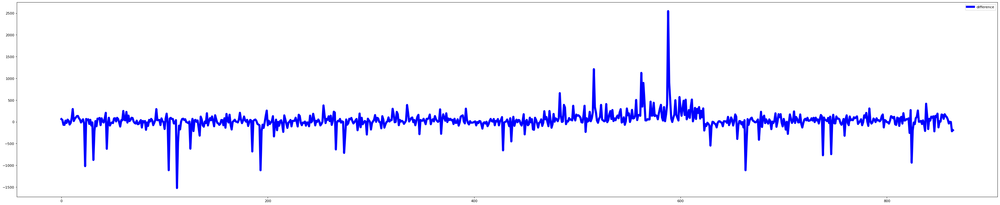

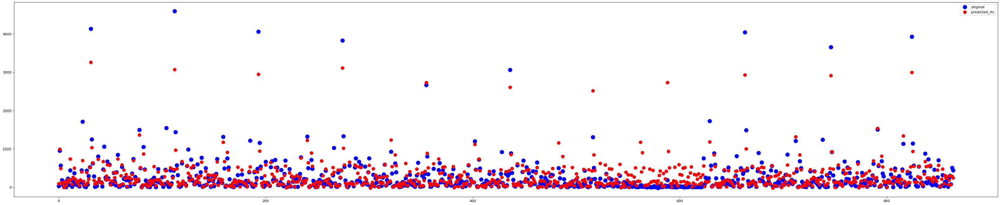

In [ ]:
#XGB_2(X_train_1, y_train_1, X_test_1, y_test_1, X_1_2020)
#XGB_2(X_train_2, y_train_2, X_test_2, y_test_2, X_2_2020)
XGB_2(X_train_3, y_train_3, X_test_3, y_test_3, X_3_2020)

In [ ]:
# XGBOOST without GridSearch:

def XGB(X_train,Y_train,X_test,Y_test,X_pred, Predict="False"):
  xgb_reg = XGBRegressor(n_estimators=300, objective='reg:squarederror', max_depth=6, learning_rate=0.025)
  xgb_reg.fit(X_train, Y_train)
  train_preds_xgb_reg = xgb_reg.predict(X_train)
  test_preds_xgb_reg = xgb_reg.predict(X_test)

  #XGB Metrics:
  mae_xgb_train = mean_absolute_error(Y_train, train_preds_xgb_reg)
  mae_xgb_test = mean_absolute_error(Y_test, test_preds_xgb_reg)
  print('MAE Train: ', mae_xgb_train)
  print('MAE Test: ',mae_xgb_test)

  mse_xgb_train = mean_squared_error(Y_train, train_preds_xgb_reg)
  mse_xgb_test = mean_squared_error(Y_test, test_preds_xgb_reg)
  print('MSE Train: ', mse_xgb_train)
  print('MSE Test: ',mse_xgb_test)

  rmse_xgb_train = mean_squared_error(Y_train, train_preds_xgb_reg, squared=False)
  rmse_xgb_test = mean_squared_error(Y_test, test_preds_xgb_reg, squared=False)
  print('RMSE Train: ', rmse_xgb_train)
  print('RMSE Test: ',rmse_xgb_test)

  r2_xgb_train = r2_score(Y_train, train_preds_xgb_reg)
  r2_xgb_test = r2_score(Y_test, test_preds_xgb_reg)
  print('R2 Train: ', r2_xgb_train)
  print('R2 Test: ',r2_xgb_test)

  mape_train = mape(Y_train, train_preds_xgb_reg)
  mape_test = mape(Y_test, test_preds_xgb_reg)
  print('Mape Train: ', mape_train)
  print('Mape Test: ',mape_test)

  explained_variance__train = explained_variance_score(Y_train, train_preds_xgb_reg)
  explained_variance__test = explained_variance_score(Y_test, test_preds_xgb_reg)
  print('Explanied Variance Score Train: ', explained_variance__train)
  print('Explanied Variance Score Test: ',explained_variance__test)

  CoV = rmse_xgb_test/np.mean(Y_test)
  print('CoV Test: ', CoV)

  if Predict:
    predictions = xgb_reg.predict(X_pred)
    df = pd.DataFrame(predictions, columns=['2020_Predictions'])  
    df_2020_01 = df.iloc[0:81,:].values
    df_2020_02 = df.iloc[81:163,:].values
    df_2020_03 = df.iloc[162:244,:].values
    df_2020_04 = df.iloc[244:325,:].values
    df_2020_01 = (pd.DataFrame(df_2020_01)).sum() 
    df_2020_02 = (pd.DataFrame(df_2020_02)).sum() 
    df_2020_03 = (pd.DataFrame(df_2020_03)).sum() 
    df_2020_04 = (pd.DataFrame(df_2020_04)).sum()
    print("2020_01: ", round(df_2020_01, 0))
    print("2020_02: ", round(df_2020_02, 0))
    print("2020_03: ", round(df_2020_03, 0))
    print("2020_04: ", round(df_2020_04, 0))

  errorVisualization(test_preds_xgb_reg, Y_test)

  predVisualization(test_preds_xgb_reg,Y_test)

MAE Train:  15.617844530313311
MAE Test:  74.5184813766217
MSE Train:  487.98923064868967
MSE Test:  11471.993476406748
RMSE Train:  22.090478280215883
RMSE Test:  107.10739225845595
R2 Train:  0.9782291066573011
R2 Test:  0.5445799124312825
Mape Train:  27.145724511343982
Mape Test:  263.823373115349
Explanied Variance Score Train:  0.9782303937523349
Explanied Variance Score Test:  0.5452171491045643
CoV Test:  0.6727258938976378
2020_01:  0    12546.0
dtype: float32
2020_02:  0    12724.0
dtype: float32
2020_03:  0    12082.0
dtype: float32
2020_04:  0    11303.0
dtype: float32


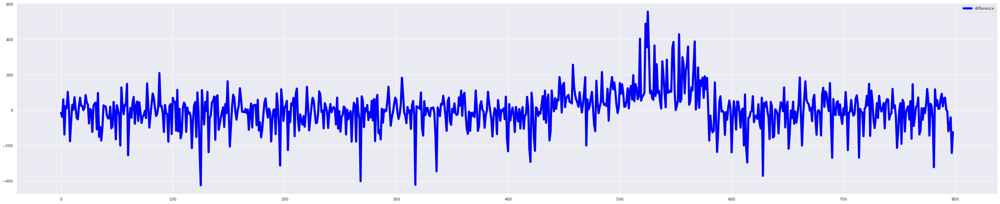

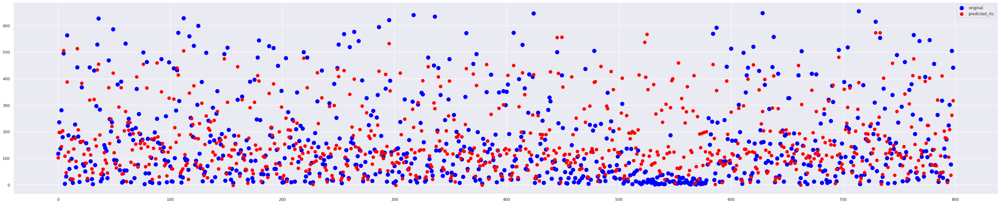

MAE Train:  21.230650351410773
MAE Test:  71.22065706351522
MSE Train:  935.9904643030486
MSE Test:  11650.784697206018
RMSE Train:  30.593961239157125
RMSE Test:  107.93880070301883
R2 Train:  0.9582422166549925
R2 Test:  0.5374821823288045
Mape Train:  44.54103422328431
Mape Test:  245.25259019465602
Explanied Variance Score Train:  0.9582435341207509
Explanied Variance Score Test:  0.540183986994222
CoV Test:  0.6779478489585262
2020_01:  0    13360.0
dtype: float32
2020_02:  0    13506.0
dtype: float32
2020_03:  0    13915.0
dtype: float32
2020_04:  0    12456.0
dtype: float32


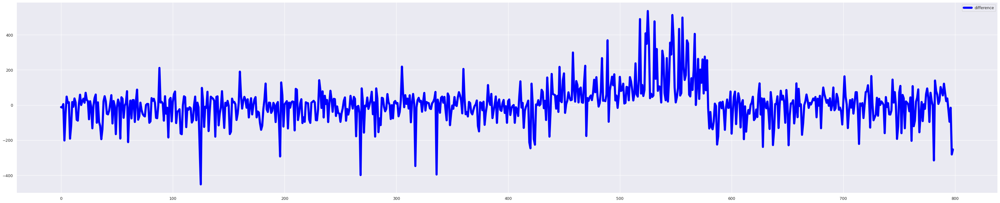

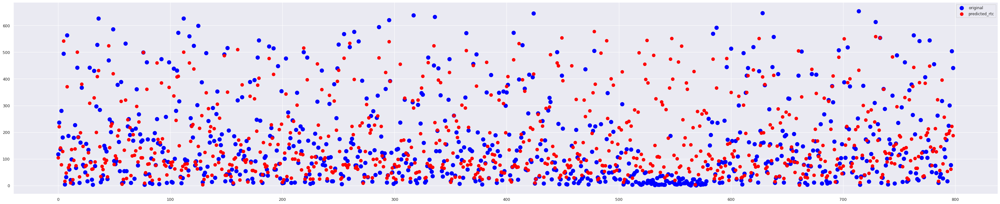

MAE Train:  21.85656090368529
MAE Test:  71.31710844463639
MSE Train:  992.5962264310438
MSE Test:  11483.66577800937
RMSE Train:  31.505495178318398
RMSE Test:  107.16186718235815
R2 Train:  0.9557168371333327
R2 Test:  0.5441165404263273
Mape Train:  44.704949733922334
Mape Test:  249.95153451876746
Explanied Variance Score Train:  0.9557183881151654
Explanied Variance Score Test:  0.5472385223792995
CoV Test:  0.6730680429417364
2020_01:  0    12842.0
dtype: float32
2020_02:  0    12771.0
dtype: float32
2020_03:  0    12568.0
dtype: float32
2020_04:  0    12092.0
dtype: float32


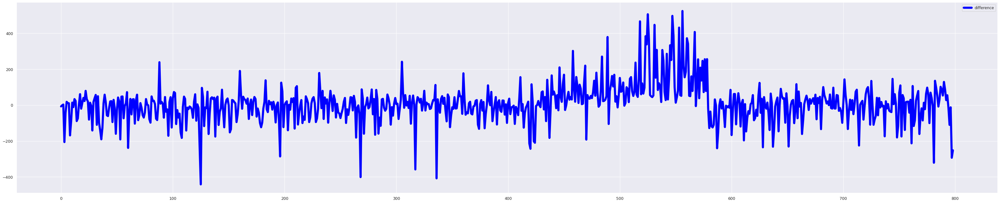

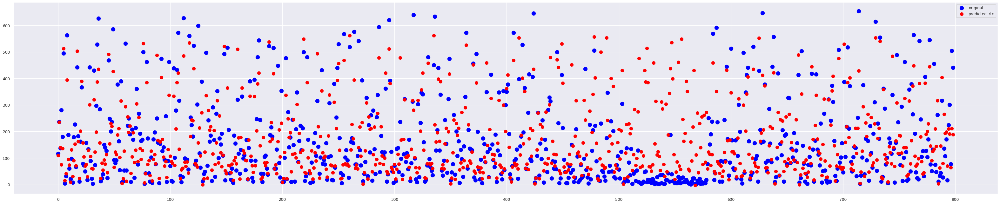

In [ ]:
# Resultsfor XGBOOST without GridSearch:

XGB(X_train_1, y_train_1, X_test_1, y_test_1, X_1_2020)
XGB(X_train_2, y_train_2, X_test_2, y_test_2, X_2_2020)
XGB(X_train_3, y_train_3, X_test_3, y_test_3, X_3_2020)

In [ ]:
import lightgbm as ltb
def lgbmReg(X_train,Y_train,X_test,Y_test,X_pred, Predict="False"):
  lgbm_reg = ltb.LGBMRegressor(max_depth=4, learning_rate=0.05, num_leaves=100)
  lgbm_reg.fit(X_train, Y_train)
  train_preds_lgbm_reg = lgbm_reg.predict(X_train)
  test_preds_lgbm_reg = lgbm_reg.predict(X_test)

  # Light GBM Metrics:
  mae_lgbm_train = mean_absolute_error(Y_train, train_preds_lgbm_reg)
  mae_lgbm_test = mean_absolute_error(Y_test, test_preds_lgbm_reg)
  print('MAE Train: ', mae_lgbm_train)
  print('MAE Test: ',mae_lgbm_test)

  mse_lgbm_train = mean_squared_error(Y_train, train_preds_lgbm_reg)
  mse_lgbm_test = mean_squared_error(Y_test, test_preds_lgbm_reg)
  print('MSE Train: ', mse_lgbm_train)
  print('MSE Test: ',mse_lgbm_test)

  rmse_lgbm_train = mean_squared_error(Y_train, train_preds_lgbm_reg, squared=False)
  rmse_lgbm_test = mean_squared_error(Y_test, test_preds_lgbm_reg, squared=False)
  print('RMSE Train: ', rmse_lgbm_train)
  print('RMSE Test: ',rmse_lgbm_test)

  r2_lgbm_train = r2_score(Y_train, train_preds_lgbm_reg)
  r2_lgbm_test = r2_score(Y_test, test_preds_lgbm_reg)
  print('R2 Train: ', r2_lgbm_train)
  print('R2 Test: ',r2_lgbm_test)

  mape_train = mape(Y_train, train_preds_lgbm_reg)
  mape_test = mape(Y_test, test_preds_lgbm_reg)
  print('Mape Train: ', mape_train)
  print('Mape Test: ',mape_test)

  explained_variance__train = explained_variance_score(Y_train, train_preds_lgbm_reg)
  explained_variance__test = explained_variance_score(Y_test, test_preds_lgbm_reg)
  print('Explanied Variance Score Train: ', explained_variance__train)
  print('Explanied Variance Score Test: ',explained_variance__test)

  CoV = rmse_lgbm_test/np.mean(Y_test)
  print('CoV Test: ', CoV)  

  if Predict:
    predictions = lgbm_reg.predict(X_pred)
    df = pd.DataFrame(predictions, columns=['2020_Predictions'])  
    df_2020_01 = df.iloc[0:81,:].values
    df_2020_02 = df.iloc[81:163,:].values
    df_2020_03 = df.iloc[162:244,:].values
    df_2020_04 = df.iloc[244:325,:].values
    df_2020_01 = (pd.DataFrame(df_2020_01)).sum() 
    df_2020_02 = (pd.DataFrame(df_2020_02)).sum() 
    df_2020_03 = (pd.DataFrame(df_2020_03)).sum() 
    df_2020_04 = (pd.DataFrame(df_2020_04)).sum()
    print("2020_01: ", round(df_2020_01, 0))
    print("2020_02: ", round(df_2020_02, 0))
    print("2020_03: ", round(df_2020_03, 0))
    print("2020_04: ", round(df_2020_04, 0))

  predVisualization(test_preds_lgbm_reg,Y_test)


MAE Train:  55.94480165666515
MAE Test:  136.44042131150155
MSE Train:  7648.456343734333
MSE Test:  55056.28671967794
RMSE Train:  87.45545348195465
RMSE Test:  234.64076099364735
R2 Train:  0.9416429783093769
R2 Test:  0.7324257488890407
Mape Train:  92.01736618475667
Mape Test:  473.42403268487374
Explanied Variance Score Train:  0.9416429783093769
Explanied Variance Score Test:  0.7443519748523633
CoV Test:  0.9333878668538598
2020_01:  0    187247.0
dtype: float64
2020_02:  0    185712.0
dtype: float64
2020_03:  0    182311.0
dtype: float64
2020_04:  0    181481.0
dtype: float64


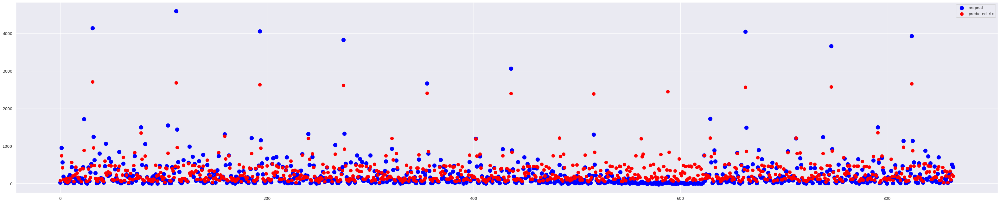

MAE Train:  62.10811510317236
MAE Test:  145.69503626781878
MSE Train:  10943.628420987801
MSE Test:  93482.98870302194
RMSE Train:  104.61179867007259
RMSE Test:  305.7498793180824
R2 Train:  0.9165011170311665
R2 Test:  0.5456714903207389
Mape Train:  94.3082374706745
Mape Test:  445.5255442652354
Explanied Variance Score Train:  0.9165011170311665
Explanied Variance Score Test:  0.5552222699254694
CoV Test:  1.2162559754707598
2020_01:  0    161047.0
dtype: float64
2020_02:  0    163136.0
dtype: float64
2020_03:  0    158970.0
dtype: float64
2020_04:  0    156242.0
dtype: float64


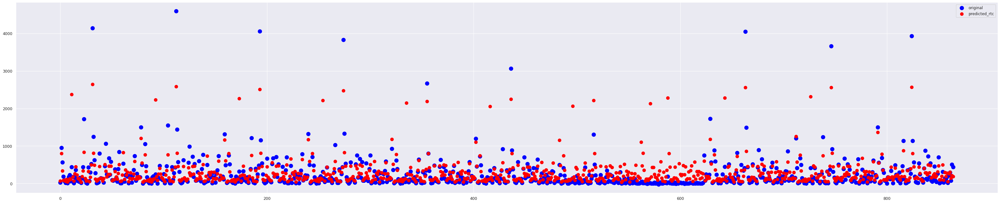

MAE Train:  62.0356217230371
MAE Test:  145.67986600557785
MSE Train:  10895.233554768887
MSE Test:  93715.23379321356
RMSE Train:  104.38023546040164
RMSE Test:  306.12943960555896
R2 Train:  0.9168703654298929
R2 Test:  0.544542776239482
Mape Train:  94.2277680270352
Mape Test:  443.23792873753547
Explanied Variance Score Train:  0.9168703654298929
Explanied Variance Score Test:  0.554446157194107
CoV Test:  1.2177658451352202
2020_01:  0    158038.0
dtype: float64
2020_02:  0    159266.0
dtype: float64
2020_03:  0    156624.0
dtype: float64
2020_04:  0    152611.0
dtype: float64


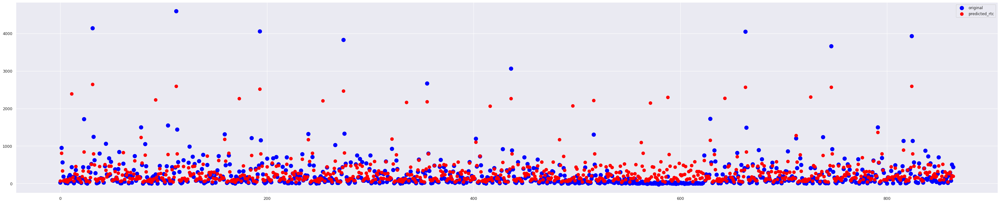

In [ ]:
lgbmReg(X_train_1, y_train_1, X_test_1, y_test_1, X_1_2020)
lgbmReg(X_train_2, y_train_2, X_test_2, y_test_2, X_2_2020)
lgbmReg(X_train_3, y_train_3, X_test_3, y_test_3, X_3_2020)

In [ ]:
def RFR(X_train,Y_train,X_test,Y_test,X_pred, Predict="False"):
  rfc_reg = RandomForestRegressor(n_estimators=40)
  rfc_reg.fit(X_train, Y_train)
  train_preds_rfc_reg = rfc_reg.predict(X_train)
  test_preds_rfc_reg = rfc_reg.predict(X_test)

  #RFC Metrics:
  mae_rfc_train = mean_absolute_error(Y_train, train_preds_rfc_reg)
  mae_rfc_test = mean_absolute_error(Y_test, test_preds_rfc_reg)
  print('MAE Train: ', mae_rfc_train)
  print('MAE Test: ',mae_rfc_test)

  mse_rfc_train = mean_squared_error(Y_train, train_preds_rfc_reg)
  mse_rfc_test = mean_squared_error(Y_test, test_preds_rfc_reg)
  print('MSE Train: ', mse_rfc_train)
  print('MSE Test: ',mse_rfc_test)

  rmse_rfc_train = mean_squared_error(Y_train, train_preds_rfc_reg, squared=False)
  rmse_rfc_test = mean_squared_error(Y_test, test_preds_rfc_reg, squared=False)
  print('RMSE Train: ', rmse_rfc_train)
  print('RMSE Test: ',rmse_rfc_test)

  r2_rfc_train = r2_score(Y_train, train_preds_rfc_reg)
  r2_rfc_test = r2_score(Y_test, test_preds_rfc_reg)
  print('R2 Train: ', r2_rfc_train)
  print('R2 Test: ',r2_rfc_test)

  mape_train = mape(Y_train, train_preds_rfc_reg)
  mape_test = mape(Y_test, test_preds_rfc_reg)
  print('Mape Train: ', mape_train)
  print('Mape Test: ',mape_test)

  explained_variance__train = explained_variance_score(Y_train, train_preds_rfc_reg)
  explained_variance__test = explained_variance_score(Y_test, test_preds_rfc_reg)
  print('Explanied Variance Score Train: ', explained_variance__train)
  print('Explanied Variance Score Test: ',explained_variance__test)

  CoV = rmse_rfc_test/np.mean(Y_test)
  print('CoV Test: ', CoV)  

  if Predict:
    predictions = rfc_reg.predict(X_pred)
    df = pd.DataFrame(predictions, columns=['2020_Predictions'])  
    df_2020_01 = df.iloc[0:81,:].values
    df_2020_02 = df.iloc[81:163,:].values
    df_2020_03 = df.iloc[162:244,:].values
    df_2020_04 = df.iloc[244:325,:].values
    df_2020_01 = (pd.DataFrame(df_2020_01)).sum() 
    df_2020_02 = (pd.DataFrame(df_2020_02)).sum() 
    df_2020_03 = (pd.DataFrame(df_2020_03)).sum() 
    df_2020_04 = (pd.DataFrame(df_2020_04)).sum()
    print("2020_01: ", round(df_2020_01, 0))
    print("2020_02: ", round(df_2020_02, 0))
    print("2020_03: ", round(df_2020_03, 0))
    print("2020_04: ", round(df_2020_04, 0))

  predVisualization(test_preds_rfc_reg,Y_test)

MAE Train:  14.554637896825398
MAE Test:  122.89187861271677
MSE Train:  931.7319543650792
MSE Test:  49675.39993713874
RMSE Train:  30.52428466590297
RMSE Test:  222.87978808572737
R2 Train:  0.9928909704877544
R2 Test:  0.7585769268368295
Mape Train:  16.664451370009807
Mape Test:  396.8778990256765
Explanied Variance Score Train:  0.9928920651247221
Explanied Variance Score Test:  0.7640125991035337
CoV Test:  0.8866033722581119
2020_01:  0    176724.0
dtype: float64
2020_02:  0    171933.0
dtype: float64
2020_03:  0    163057.0
dtype: float64
2020_04:  0    161315.0
dtype: float64


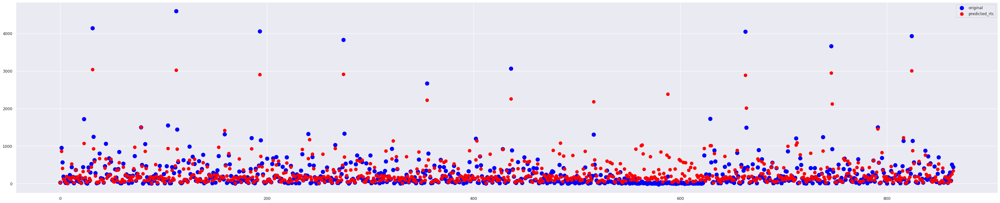

MAE Train:  17.08452380952381
MAE Test:  96.98815028901734
MSE Train:  1178.8368322172619
MSE Test:  36993.77969364162
RMSE Train:  34.33419333867132
RMSE Test:  192.33767102063396
R2 Train:  0.9910055828920611
R2 Test:  0.8202097619171241
Mape Train:  21.320463481518797
Mape Test:  279.6833850398647
Explanied Variance Score Train:  0.991006237273495
Explanied Variance Score Test:  0.820332750048046
CoV Test:  0.7651085331863948
2020_01:  0    148702.0
dtype: float64
2020_02:  0    144561.0
dtype: float64
2020_03:  0    136815.0
dtype: float64
2020_04:  0    133506.0
dtype: float64


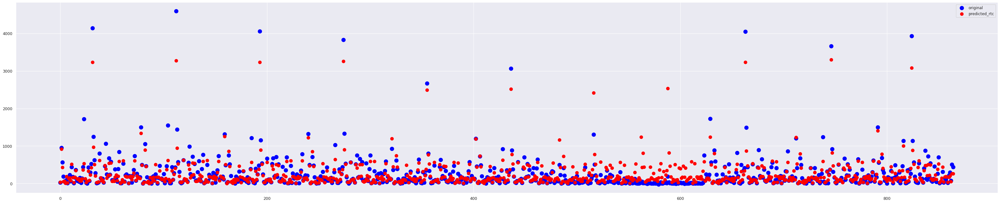

MAE Train:  17.453893849206352
MAE Test:  96.25812138728323
MSE Train:  1183.7262524801588
MSE Test:  36286.641684248556
RMSE Train:  34.40532302537151
RMSE Test:  190.49052911955638
R2 Train:  0.990968277063079
R2 Test:  0.8236464616033712
Mape Train:  21.209765342740607
Mape Test:  270.6030883289637
Explanied Variance Score Train:  0.9909683157482628
Explanied Variance Score Test:  0.8236491556843104
CoV Test:  0.7577607056754285
2020_01:  0    110906.0
dtype: float64
2020_02:  0    109972.0
dtype: float64
2020_03:  0    103655.0
dtype: float64
2020_04:  0    100957.0
dtype: float64


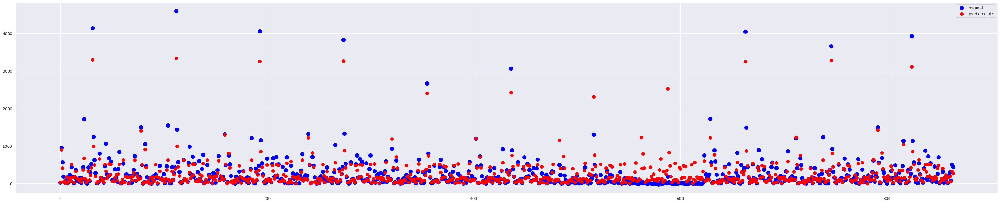

In [ ]:
RFR(X_train_1, y_train_1, X_test_1, y_test_1, X_1_2020)
RFR(X_train_2, y_train_2, X_test_2, y_test_2, X_2_2020)
RFR(X_train_3, y_train_3, X_test_3, y_test_3, X_3_2020)

In [ ]:
def SVReg(X_train,Y_train,X_test,Y_test,X_pred, Predict="False"):
  svr = SVR()
  svr.fit(X_train, Y_train)
  train_preds_SVR = svr.predict(X_train)
  test_preds_SVR = svr.predict(X_test)

  mae_SVC_train = mean_absolute_error(Y_train, train_preds_SVR)
  mae_SVC_test = mean_absolute_error(Y_test, test_preds_SVR)
  print('MAE Train: ', mae_SVC_train)
  print('MAE Test: ',mae_SVC_test)

  mse_SVC_train = mean_squared_error(Y_train, train_preds_SVR)
  mse_SVC_test = mean_squared_error(Y_test, test_preds_SVR)
  print('MSE Train: ', mse_SVC_train)
  print('MSE Test: ',mse_SVC_test)

  rmse_SVC_train = mean_squared_error(Y_train, train_preds_SVR, squared=False)
  rmse_SVC_test = mean_squared_error(Y_test, test_preds_SVR, squared=False)
  print('RMSE Train: ', rmse_SVC_train)
  print('RMSE Test: ',rmse_SVC_test)

  r2_SVC_train = r2_score(Y_train, train_preds_SVR)
  r2_SVC_test = r2_score(Y_test, test_preds_SVR)
  print('R2 Train: ', r2_SVC_train)
  print('R2 Test: ',r2_SVC_test)

  mape_train = mape(Y_train, train_preds_SVR)
  mape_test = mape(Y_test, test_preds_SVR)
  print('Mape Train: ', mape_train)
  print('Mape Test: ',mape_test)

  explained_variance__train = explained_variance_score(Y_train, train_preds_SVR)
  explained_variance__test = explained_variance_score(Y_test, test_preds_SVR)
  print('Explanied Variance Score Train: ', explained_variance__train)
  print('Explanied Variance Score Test: ',explained_variance__test)

  CoV = rmse_SVC_test/np.mean(Y_test)
  print('CoV Test: ', CoV) 

  if Predict:
    predictions = svr.predict(X_pred)
    df = pd.DataFrame(predictions, columns=['2020_Predictions'])  
    df_2020_01 = df.iloc[0:81,:].values
    df_2020_02 = df.iloc[81:163,:].values
    df_2020_03 = df.iloc[162:244,:].values
    df_2020_04 = df.iloc[244:325,:].values
    df_2020_01 = (pd.DataFrame(df_2020_01)).sum() 
    df_2020_02 = (pd.DataFrame(df_2020_02)).sum() 
    df_2020_03 = (pd.DataFrame(df_2020_03)).sum() 
    df_2020_04 = (pd.DataFrame(df_2020_04)).sum()
    print("2020_01: ", round(df_2020_01, 0))
    print("2020_02: ", round(df_2020_02, 0))
    print("2020_03: ", round(df_2020_03, 0))
    print("2020_04: ", round(df_2020_04, 0)) 

  predVisualization(test_preds_SVR,Y_test)

MAE Train:  164.74201920630742
MAE Test:  194.6067388772468
MSE Train:  128576.70216056259
MSE Test:  207988.71070198773
RMSE Train:  358.57593639362165
RMSE Test:  456.05779316002014
R2 Train:  0.018971533642924476
R2 Test:  -0.010827769569271561
Mape Train:  220.68662212562083
Mape Test:  383.6069544858999
Explanied Variance Score Train:  0.09797752966194695
Explanied Variance Score Test:  0.04532885663884878
CoV Test:  1.814172477608163
2020_01:  0    12243.0
dtype: float64
2020_02:  0    12394.0
dtype: float64
2020_03:  0    12394.0
dtype: float64
2020_04:  0    12092.0
dtype: float64


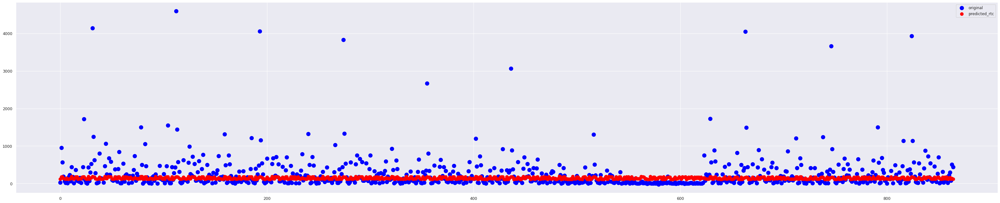

MAE Train:  163.4188483350097
MAE Test:  193.68573253483945
MSE Train:  127227.59585194406
MSE Test:  206551.0287088694
RMSE Train:  356.68977536781745
RMSE Test:  454.4788539732838
R2 Train:  0.02926509126772603
R2 Test:  -0.003840616864930979
Mape Train:  215.69389144568407
Mape Test:  380.65538761585
Explanied Variance Score Train:  0.10740398572890442
Explanied Variance Score Test:  0.051901624304910854
CoV Test:  1.807891545543509
2020_01:  0    12032.0
dtype: float64
2020_02:  0    12180.0
dtype: float64
2020_03:  0    12180.0
dtype: float64
2020_04:  0    12032.0
dtype: float64


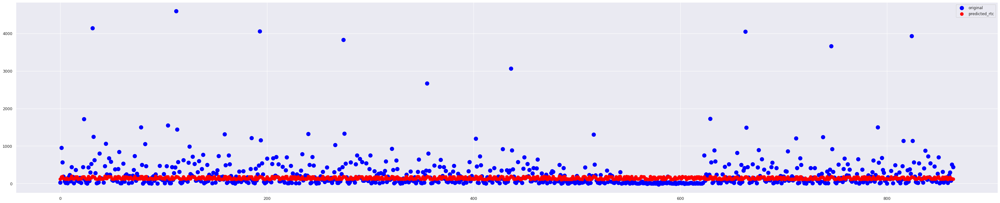

MAE Train:  162.14640085251386
MAE Test:  192.5360445993176
MSE Train:  126162.40469894715
MSE Test:  205677.51661635342
RMSE Train:  355.19347502304595
RMSE Test:  453.516831679215
R2 Train:  0.03739240224741458
R2 Test:  0.00040466297352559355
Mape Train:  212.32947350434137
Mape Test:  377.87899201427206
Explanied Variance Score Train:  0.114036534507856
Explanied Variance Score Test:  0.05634344719591333
CoV Test:  1.8040646744869875
2020_01:  0    12150.0
dtype: float64
2020_02:  0    12300.0
dtype: float64
2020_03:  0    12300.0
dtype: float64
2020_04:  0    12000.0
dtype: float64


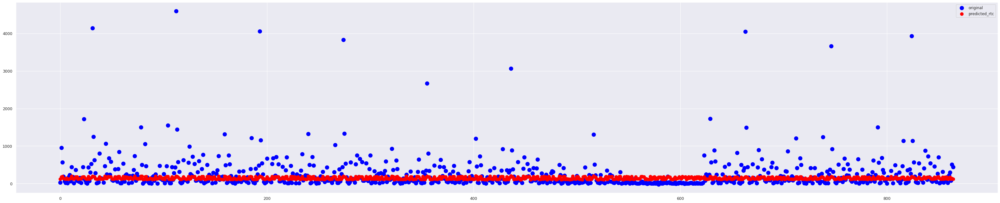

In [ ]:
SVReg(X_train_1, y_train_1, X_test_1, y_test_1, X_1_2020)
SVReg(X_train_2, y_train_2, X_test_2, y_test_2, X_2_2020)
SVReg(X_train_3, y_train_3, X_test_3, y_test_3, X_3_2020)

In [ ]:
def gaussNB(X_train,Y_train,X_test,Y_test,X_pred, Predict="False"):
  gauss = GaussianNB()
  gauss.fit(X_train, Y_train)
  train_preds_gauss = gauss.predict(X_train)
  test_preds_gauss = gauss.predict(X_test)

  mae_gauss_train = mean_absolute_error(Y_train, train_preds_gauss)
  mae_gauss_test = mean_absolute_error(Y_test, test_preds_gauss)
  print('MAE Train: ', mae_gauss_train)
  print('MAE Test: ',mae_gauss_test)

  mse_gauss_train = mean_squared_error(Y_train, train_preds_gauss)
  mse_gauss_test = mean_squared_error(Y_test, test_preds_gauss)
  print('MSE Train: ', mse_gauss_train)
  print('MSE Test: ',mse_gauss_test)

  rmse_gauss_train = mean_squared_error(Y_train, train_preds_gauss, squared=False)
  rmse_gauss_test = mean_squared_error(Y_test, test_preds_gauss, squared=False)
  print('RMSE Train: ', rmse_gauss_train)
  print('RMSE Test: ',rmse_gauss_test)

  r2_gauss_train = r2_score(Y_train, train_preds_gauss)
  r2_gauss_test = r2_score(Y_test, test_preds_gauss)
  print('R2 Train: ', r2_gauss_train)
  print('R2 Test: ',r2_gauss_test)

  mape_train = mape(Y_train, train_preds_gauss)
  mape_test = mape(Y_test, test_preds_gauss)
  print('Mape Train: ', mape_train)
  print('Mape Test: ',mape_test)

  explained_variance__train = explained_variance_score(Y_train, train_preds_gauss)
  explained_variance__test = explained_variance_score(Y_test, test_preds_gauss)
  print('Explanied Variance Score Train: ', explained_variance__train)
  print('Explanied Variance Score Test: ',explained_variance__test)

  CoV = rmse_gauss_test/np.mean(Y_test)
  print('CoV Test: ', CoV) 

  if Predict:
    predictions = gauss.predict(X_pred)
    df = pd.DataFrame(predictions, columns=['2020_Predictions'])  
    df_2020_01 = df.iloc[0:81,:].values
    df_2020_02 = df.iloc[81:163,:].values
    df_2020_03 = df.iloc[162:244,:].values
    df_2020_04 = df.iloc[244:325,:].values
    df_2020_01 = (pd.DataFrame(df_2020_01)).sum() 
    df_2020_02 = (pd.DataFrame(df_2020_02)).sum() 
    df_2020_03 = (pd.DataFrame(df_2020_03)).sum() 
    df_2020_04 = (pd.DataFrame(df_2020_04)).sum()
    print("2020_01: ", round(df_2020_01, 0))
    print("2020_02: ", round(df_2020_02, 0))
    print("2020_03: ", round(df_2020_03, 0))
    print("2020_04: ", round(df_2020_04, 0)) 

  predVisualization(test_preds_gauss,Y_test)

MAE Train:  73.39037698412699
MAE Test:  169.01387283236994
MSE Train:  13732.463789682539
MSE Test:  174128.57919075145
RMSE Train:  117.18559548716958
RMSE Test:  417.2871663384239
R2 Train:  0.8952225584844057
R2 Test:  0.15373289863865958
Mape Train:  151.34361950313428
Mape Test:  233.76620907466736
Explanied Variance Score Train:  0.9012220108202997
Explanied Variance Score Test:  0.2005616565688515
CoV Test:  1.6599450854349143
2020_01:  0    30456.0
dtype: float64
2020_02:  0    30832.0
dtype: float64
2020_03:  0    30832.0
dtype: float64
2020_04:  0    30080.0
dtype: float64


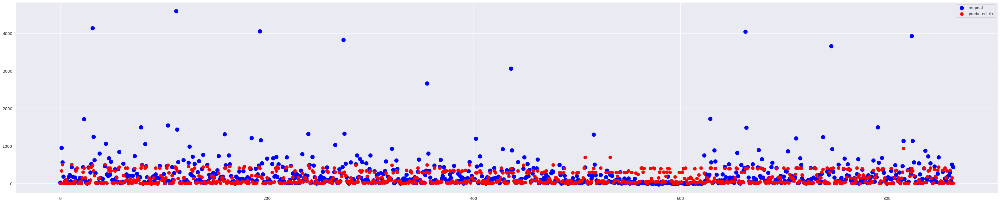

MAE Train:  82.0828373015873
MAE Test:  172.47167630057803
MSE Train:  16357.360615079366
MSE Test:  174530.67514450868
RMSE Train:  127.89589756938791
RMSE Test:  417.76868617035996
R2 Train:  0.8751948360145223
R2 Test:  0.1517787072081852
Mape Train:  182.727563469228
Mape Test:  237.05827872351307
Explanied Variance Score Train:  0.8842254831063723
Explanied Variance Score Test:  0.19487613454125996
CoV Test:  1.6618605444833563
2020_01:  0    30456.0
dtype: float64
2020_02:  0    30832.0
dtype: float64
2020_03:  0    30832.0
dtype: float64
2020_04:  0    30456.0
dtype: float64


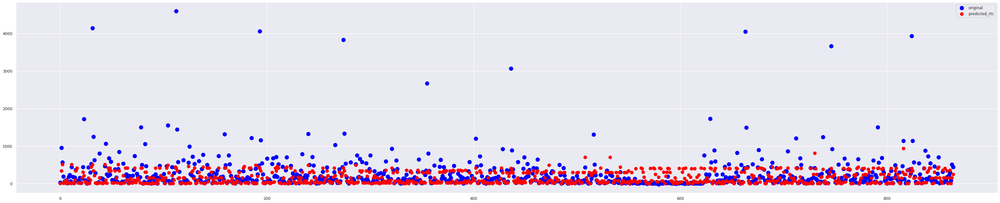

MAE Train:  82.65426587301587
MAE Test:  171.14797687861272
MSE Train:  16402.83878968254
MSE Test:  173509.587283237
RMSE Train:  128.073567880662
RMSE Test:  416.54482025736075
R2 Train:  0.8748478417058025
R2 Test:  0.15674120715282114
Mape Train:  177.528354698629
Mape Test:  228.78669762119034
Explanied Variance Score Train:  0.8833298076048859
Explanied Variance Score Test:  0.19674192962744008
CoV Test:  1.6569920741075703
2020_01:  0    30456.0
dtype: float64
2020_02:  0    30832.0
dtype: float64
2020_03:  0    30832.0
dtype: float64
2020_04:  0    30080.0
dtype: float64


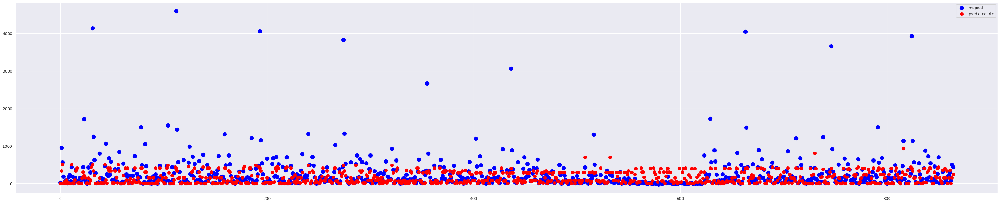

In [ ]:
gaussNB(X_train_1, y_train_1, X_test_1, y_test_1, X_1_2020)
gaussNB(X_train_2, y_train_2, X_test_2, y_test_2, X_2_2020)
gaussNB(X_train_3, y_train_3, X_test_3, y_test_3, X_3_2020)

In [ ]:
from sklearn.tree import DecisionTreeRegressor 
def decisionTree(X_train,Y_train,X_test,Y_test,X_pred, Predict="False"):
  tree = DecisionTreeRegressor (random_state = 0)
  tree.fit(X_train, Y_train)
  train_preds_tree = tree.predict(X_train)
  test_preds_tree = tree.predict(X_test)

  mae_tree_train = mean_absolute_error(Y_train, train_preds_tree)
  mae_tree_test = mean_absolute_error(Y_test, test_preds_tree)
  print('MAE Train: ', mae_tree_train)
  print('MAE Test: ',mae_tree_test)

  mse_tree_train = mean_squared_error(Y_train, train_preds_tree)
  mse_tree_test = mean_squared_error(Y_test, test_preds_tree)
  print('MSE Train: ', mse_tree_train)
  print('MSE Test: ',mse_tree_test)

  rmse_tree_train = mean_squared_error(Y_train, train_preds_tree, squared=False)
  rmse_tree_test = mean_squared_error(Y_test, test_preds_tree, squared=False)
  print('RMSE Train: ', rmse_tree_train)
  print('RMSE Test: ',rmse_tree_test)

  r2_tree_train = r2_score(Y_train, train_preds_tree)
  r2_tree_test = r2_score(Y_test, test_preds_tree)
  print('R2 Train: ', r2_tree_train)
  print('R2 Test: ',r2_tree_test)

  mape_train = mape(Y_train, train_preds_tree)
  mape_test = mape(Y_test, test_preds_tree)
  print('Mape Train: ', mape_train)
  print('Mape Test: ',mape_test)

  explained_variance__train = explained_variance_score(Y_train, train_preds_tree)
  explained_variance__test = explained_variance_score(Y_test, test_preds_tree)
  print('Explanied Variance Score Train: ', explained_variance__train)
  print('Explanied Variance Score Test: ',explained_variance__test)

  CoV = rmse_tree_test/np.mean(Y_test)
  print('CoV Test: ', CoV) 

  if Predict:
    predictions = tree.predict(X_pred)
    df = pd.DataFrame(predictions, columns=['2020_Predictions'])  
    df_2020_01 = df.iloc[0:81,:].values
    df_2020_02 = df.iloc[81:163,:].values
    df_2020_03 = df.iloc[162:244,:].values
    df_2020_04 = df.iloc[244:325,:].values
    df_2020_01 = (pd.DataFrame(df_2020_01)).sum() 
    df_2020_02 = (pd.DataFrame(df_2020_02)).sum() 
    df_2020_03 = (pd.DataFrame(df_2020_03)).sum() 
    df_2020_04 = (pd.DataFrame(df_2020_04)).sum()
    print("2020_01: ", round(df_2020_01, 0))
    print("2020_02: ", round(df_2020_02, 0))
    print("2020_03: ", round(df_2020_03, 0))
    print("2020_04: ", round(df_2020_04, 0)) 

  predVisualization(test_preds_tree,Y_test)

MAE Train:  0.0
MAE Test:  179.29479768786126
MSE Train:  0.0
MSE Test:  110715.29479768786
RMSE Train:  0.0
RMSE Test:  332.7390791561578
R2 Train:  1.0
R2 Test:  0.461922264339121
Mape Train:  0.0
Mape Test:  469.54376372632584
Explanied Variance Score Train:  1.0
Explanied Variance Score Test:  0.4968631870803255
CoV Test:  1.3236175078757617
2020_01:  0    227521.0
dtype: float64
2020_02:  0    215408.0
dtype: float64
2020_03:  0    197936.0
dtype: float64
2020_04:  0    197224.0
dtype: float64


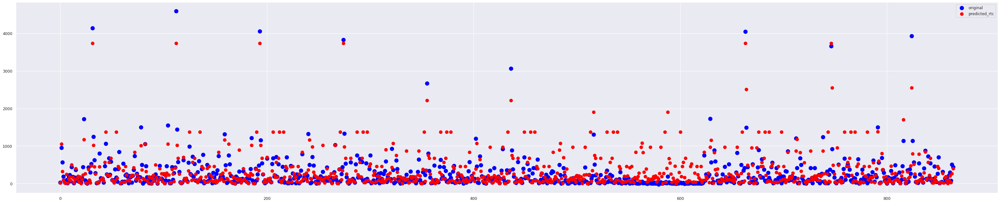

MAE Train:  0.0
MAE Test:  111.90751445086705
MSE Train:  0.0
MSE Test:  43540.055491329476
RMSE Train:  0.0
RMSE Test:  208.66253974139553
R2 Train:  1.0
R2 Test:  0.7883947785883252
Mape Train:  0.0
Mape Test:  274.6349743147975
Explanied Variance Score Train:  1.0
Explanied Variance Score Test:  0.7883993181899371
CoV Test:  0.8300479509048426
2020_01:  0    28187.0
dtype: float64
2020_02:  0    28521.0
dtype: float64
2020_03:  0    28653.0
dtype: float64
2020_04:  0    28286.0
dtype: float64


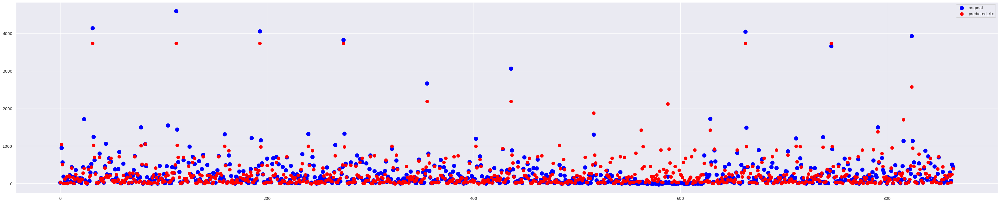

MAE Train:  0.0
MAE Test:  110.80346820809248
MSE Train:  0.0
MSE Test:  42755.594219653176
RMSE Train:  0.0
RMSE Test:  206.77425908379692
R2 Train:  1.0
R2 Test:  0.7922072703090811
Mape Train:  0.0
Mape Test:  271.51672124287853
Explanied Variance Score Train:  1.0
Explanied Variance Score Test:  0.7924049723508871
CoV Test:  0.8225364757137735
2020_01:  0    92731.0
dtype: float64
2020_02:  0    91634.0
dtype: float64
2020_03:  0    87330.0
dtype: float64
2020_04:  0    85200.0
dtype: float64


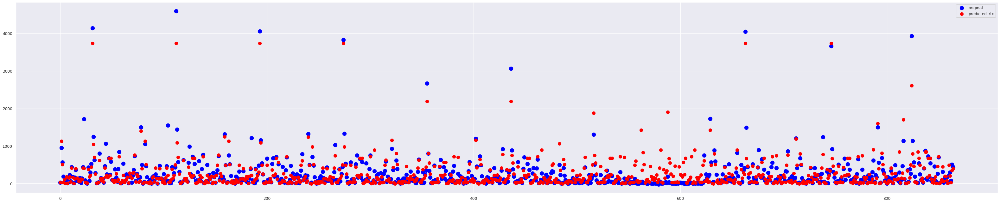

In [ ]:
decisionTree(X_train_1, y_train_1, X_test_1, y_test_1, X_1_2020)
decisionTree(X_train_2, y_train_2, X_test_2, y_test_2, X_2_2020)
decisionTree(X_train_3, y_train_3, X_test_3, y_test_3, X_3_2020)

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
def GbrReg(X_train,Y_train,X_test,Y_test,X_pred, Predict="False"):
  gbr = GradientBoostingRegressor()
  gbr.fit(X_train, Y_train)
  train_preds_tree = gbr.predict(X_train)
  test_preds_tree = gbr.predict(X_test)

  mae_tree_train = mean_absolute_error(Y_train, train_preds_tree)
  mae_tree_test = mean_absolute_error(Y_test, test_preds_tree)
  print('MAE Train: ', mae_tree_train)
  print('MAE Test: ',mae_tree_test)

  mse_tree_train = mean_squared_error(Y_train, train_preds_tree)
  mse_tree_test = mean_squared_error(Y_test, test_preds_tree)
  print('MSE Train: ', mse_tree_train)
  print('MSE Test: ',mse_tree_test)

  rmse_tree_train = mean_squared_error(Y_train, train_preds_tree, squared=False)
  rmse_tree_test = mean_squared_error(Y_test, test_preds_tree, squared=False)
  print('RMSE Train: ', rmse_tree_train)
  print('RMSE Test: ',rmse_tree_test)

  r2_tree_train = r2_score(Y_train, train_preds_tree)
  r2_tree_test = r2_score(Y_test, test_preds_tree)
  print('R2 Train: ', r2_tree_train)
  print('R2 Test: ',r2_tree_test)

  mape_train = mape(Y_train, train_preds_tree)
  mape_test = mape(Y_test, test_preds_tree)
  print('Mape Train: ', mape_train)
  print('Mape Test: ',mape_test)

  explained_variance__train = explained_variance_score(Y_train, train_preds_tree)
  explained_variance__test = explained_variance_score(Y_test, test_preds_tree)
  print('Explanied Variance Score Train: ', explained_variance__train)
  print('Explanied Variance Score Test: ',explained_variance__test)

  CoV = rmse_tree_test/np.mean(Y_test)
  print('CoV Test: ', CoV)

  if Predict:
    predictions = gbr.predict(X_pred)
    df = pd.DataFrame(predictions, columns=['2020_Predictions'])  
    df_2020_01 = df.iloc[0:81,:].values
    df_2020_02 = df.iloc[81:163,:].values
    df_2020_03 = df.iloc[162:244,:].values
    df_2020_04 = df.iloc[244:325,:].values
    df_2020_01 = (pd.DataFrame(df_2020_01)).sum() 
    df_2020_02 = (pd.DataFrame(df_2020_02)).sum() 
    df_2020_03 = (pd.DataFrame(df_2020_03)).sum() 
    df_2020_04 = (pd.DataFrame(df_2020_04)).sum()
    print("2020_01: ", round(df_2020_01, 0))
    print("2020_02: ", round(df_2020_02, 0))
    print("2020_03: ", round(df_2020_03, 0))
    print("2020_04: ", round(df_2020_04, 0)) 

  predVisualization(test_preds_tree,Y_test)

MAE Train:  46.38711566391981
MAE Test:  122.31737073038266
MSE Train:  4764.635460740888
MSE Test:  51700.97948730815
RMSE Train:  69.02633889133111
RMSE Test:  227.37849389796773
R2 Train:  0.9636462676343641
R2 Test:  0.7487325845555958
Mape Train:  74.08974996915376
Mape Test:  384.8702313627671
Explanied Variance Score Train:  0.9636462676343641
Explanied Variance Score Test:  0.7503168209012042
CoV Test:  0.9044989731925283
2020_01:  0    157756.0
dtype: float64
2020_02:  0    154108.0
dtype: float64
2020_03:  0    146116.0
dtype: float64
2020_04:  0    145838.0
dtype: float64


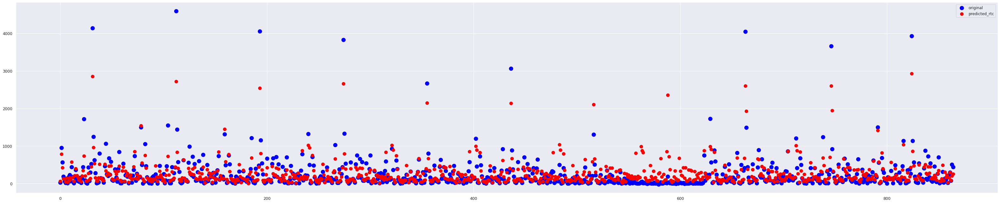

MAE Train:  56.36503283174354
MAE Test:  127.50195141671294
MSE Train:  6808.140762395592
MSE Test:  47544.27479023504
RMSE Train:  82.51145837031116
RMSE Test:  218.04649685384774
R2 Train:  0.9480545092645514
R2 Test:  0.7689342220556274
Mape Train:  86.60831389097338
Mape Test:  435.38616015109915
Explanied Variance Score Train:  0.9480545092645514
Explanied Variance Score Test:  0.7823996417625009
CoV Test:  0.8673768091763048
2020_01:  0    141728.0
dtype: float64
2020_02:  0    135862.0
dtype: float64
2020_03:  0    124426.0
dtype: float64
2020_04:  0    117885.0
dtype: float64


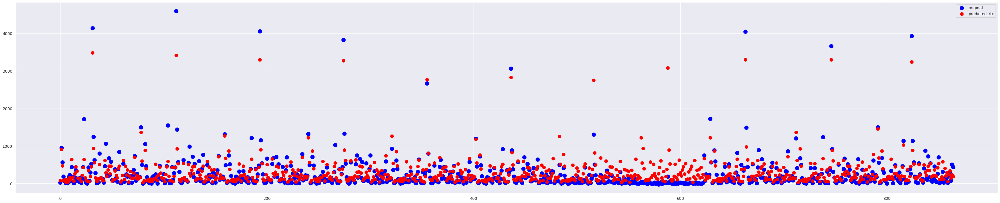

MAE Train:  56.05391194094353
MAE Test:  127.53984205263656
MSE Train:  6770.932110321479
MSE Test:  47843.803497593086
RMSE Train:  82.2856737854256
RMSE Test:  218.73226441838224
R2 Train:  0.9483384078734448
R2 Test:  0.7674785087423481
Mape Train:  86.7658980912297
Mape Test:  432.20445051514247
Explanied Variance Score Train:  0.9483384078734448
Explanied Variance Score Test:  0.7805251424745405
CoV Test:  0.8701047543189466
2020_01:  0    133792.0
dtype: float64
2020_02:  0    130378.0
dtype: float64
2020_03:  0    120881.0
dtype: float64
2020_04:  0    118012.0
dtype: float64


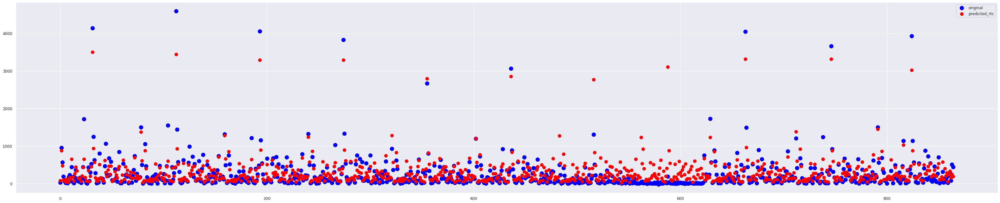

In [ ]:
GbrReg(X_train_1, y_train_1, X_test_1, y_test_1, X_1_2020)
GbrReg(X_train_2, y_train_2, X_test_2, y_test_2, X_2_2020)
GbrReg(X_train_3, y_train_3, X_test_3, y_test_3, X_3_2020)

It is clearly can be seean that most of error caused by outliers. In next chapter the effect of outliers will be examined.

***ELIMINATING OUTLIERS***

Since it is thought that the outliers of the dataset may have a negative effect on the results, the case of removing these values from the dataset was evaluated.

In [ ]:
# Eliminating outliers:
Q1 = ProductX['Quantity'].quantile(0.25)
Q3 = ProductX['Quantity'].quantile(0.75)
IQR = Q3-Q1
lower_bound = 0
upper_bound = Q3 + 1.5*IQR
inconsistent_values = (ProductX['Quantity'] < lower_bound) | (ProductX['Quantity'] > upper_bound)
index = ProductX[inconsistent_values].index
ProductX = ProductX.drop(index)
ProductX

# In this part the dataset restricted between 0 and upper bound of Quantity value.

,Period,Province,Month,Year,Season,BigCity,Region,Borsa,DolarB,DolarS,CPI(Year),CPI(Month),Male,Male_Province,Male_Rural,Trends_Eczacıbaşı,Trends_Prostat,Quantity,Med_Deg
1,2017-01-01,1,1,2017,3,0,6,2.379,3.7468,3.7536,9.22,2.46,307819.0,203955.0,103865.0,0,0,44.0,3.8
2,2017-01-01,2,1,2017,3,0,0,2.379,3.7468,3.7536,9.22,2.46,354456.0,207099.0,147357.0,0,24,236.0,-2.4
3,2017-01-01,10,1,2017,3,0,3,2.379,3.7468,3.7536,9.22,2.46,281105.0,158643.0,122462.0,0,0,126.0,-13.4
4,2017-01-01,3,1,2017,3,0,2,2.379,3.7468,3.7536,9.22,2.46,197601.0,130684.0,66917.0,0,0,70.0,-1.7
5,2017-01-01,4,1,2017,3,0,1,2.379,3.7468,3.7536,9.22,2.46,161792.0,115224.0,46568.0,0,48,214.0,2.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3200,2020-04-01,69,4,2020,1,0,0,4.780,5.9303,5.9303,1.35,12.15,100673.0,100295.0,136286.0,0,0,NaN,12.1
3201,2020-04-01,70,4,2020,1,1,3,4.780,5.9303,5.9303,1.35,12.15,92837.0,93453.0,123674.0,17,31,NaN,8.6
3202,2020-04-01,71,4,2020,1,0,4,4.780,5.9303,5.9303,1.35,12.15,53991.0,54228.0,72283.0,0,0,NaN,11.6
3203,2020-04-01,72,4,2020,1,0,2,4.780,5.9303,5.9303,1.35,12.15,209819.0,210125.0,271936.0,0,53,NaN,7.4


In [ ]:
ProductX = ProductX.reset_index(drop=True)
ProductX

,Period,Province,Month,Year,Season,BigCity,Region,Borsa,DolarB,DolarS,CPI(Year),CPI(Month),Male,Male_Province,Male_Rural,Trends_Eczacıbaşı,Trends_Prostat,Quantity,Med_Deg
0,2017-01-01,1,1,2017,3,0,6,2.379,3.7468,3.7536,9.22,2.46,307819.0,203955.0,103865.0,0,0,44.0,3.8
1,2017-01-01,2,1,2017,3,0,0,2.379,3.7468,3.7536,9.22,2.46,354456.0,207099.0,147357.0,0,24,236.0,-2.4
2,2017-01-01,10,1,2017,3,0,3,2.379,3.7468,3.7536,9.22,2.46,281105.0,158643.0,122462.0,0,0,126.0,-13.4
3,2017-01-01,3,1,2017,3,0,2,2.379,3.7468,3.7536,9.22,2.46,197601.0,130684.0,66917.0,0,0,70.0,-1.7
4,2017-01-01,4,1,2017,3,0,1,2.379,3.7468,3.7536,9.22,2.46,161792.0,115224.0,46568.0,0,48,214.0,2.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2982,2020-04-01,69,4,2020,1,0,0,4.780,5.9303,5.9303,1.35,12.15,100673.0,100295.0,136286.0,0,0,NaN,12.1
2983,2020-04-01,70,4,2020,1,1,3,4.780,5.9303,5.9303,1.35,12.15,92837.0,93453.0,123674.0,17,31,NaN,8.6
2984,2020-04-01,71,4,2020,1,0,4,4.780,5.9303,5.9303,1.35,12.15,53991.0,54228.0,72283.0,0,0,NaN,11.6
2985,2020-04-01,72,4,2020,1,0,2,4.780,5.9303,5.9303,1.35,12.15,209819.0,210125.0,271936.0,0,53,NaN,7.4


In [ ]:
ProductX.tail(326)

,Period,Province,Month,Year,Season,BigCity,Region,Borsa,DolarB,DolarS,CPI(Year),CPI(Month),Male,Male_Province,Male_Rural,Trends_Eczacıbaşı,Trends_Prostat,Quantity,Med_Deg
2661,2019-12-01,72,12,2019,3,0,2,3.651,5.8467,5.8572,11.84,0.74,208841.0,208841.0,208841.0,0,71,504.0,2.1
2662,2019-12-01,73,12,2019,3,0,1,3.651,5.8467,5.8572,11.84,0.74,294494.0,294494.0,294494.0,0,0,441.0,10.3
2663,2020-01-01,0,1,2020,3,1,5,4.113,5.9303,5.9303,1.35,12.15,1117906.0,1117906.0,0.0,4,33,NaN,9.9
2664,2020-01-01,1,1,2020,3,0,6,4.113,5.9303,5.9303,1.35,12.15,217079.0,217215.0,315977.0,0,15,NaN,5.7
2665,2020-01-01,2,1,2020,3,0,0,4.113,5.9303,5.9303,1.35,12.15,216097.0,216150.0,362394.0,40,30,NaN,-0.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2982,2020-04-01,69,4,2020,1,0,0,4.780,5.9303,5.9303,1.35,12.15,100673.0,100295.0,136286.0,0,0,NaN,12.1
2983,2020-04-01,70,4,2020,1,1,3,4.780,5.9303,5.9303,1.35,12.15,92837.0,93453.0,123674.0,17,31,NaN,8.6
2984,2020-04-01,71,4,2020,1,0,4,4.780,5.9303,5.9303,1.35,12.15,53991.0,54228.0,72283.0,0,0,NaN,11.6
2985,2020-04-01,72,4,2020,1,0,2,4.780,5.9303,5.9303,1.35,12.15,209819.0,210125.0,271936.0,0,53,NaN,7.4


In [ ]:
##################--- DataFrames for Train ---##################


# Dataset which excluded the Period, DolarB, Male_Rural variables:
X_1 = ProductX.iloc[:2663, [1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12 ,13, 15, 16, 18]].values
y_1 = ProductX.iloc[:2663, 17].values

# Dataset which excluded the Period, Province, DolarB, Male_Rural variables:
X_2 = ProductX.iloc[:2663, [2, 3, 4, 5, 6, 7, 9, 10, 11 ,13, 15, 16, 18]].values
y_2 = ProductX.iloc[:2663, 17].values

# Dataset which excluded the Period, Province, DolarB, Borsa, Male, Male_Rural variables:
X_3 = ProductX.iloc[:2663, [2, 3, 4, 5, 6, 9, 10, 11 ,13, 15, 16, 18]].values
y_3 = ProductX.iloc[:2663, 17].values

##################--- DataFrames for Test ---##################

# Dataset which excluded the Period, DolarB, Male_Rural variables:
X_1_2020 = ProductX.iloc[2663:, [1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12 ,13, 15, 16, 18]].values
y_1_2020 = ProductX.iloc[2663:, 17].values

# Dataset which excluded the Period, Province, DolarB, Male_Rural variables:
X_2_2020 = ProductX.iloc[:2663, [2, 3, 4, 5, 6, 7, 9, 10, 11 ,13, 15, 16, 18]].values
y_2_2020 = ProductX.iloc[2663:, 17].values

# Dataset which excluded the Period, Province, DolarB, Borsa, Male, Male_Rural variables:
X_3_2020 = ProductX.iloc[2663:, [2, 3, 4, 5, 6, 9, 10, 11 ,13, 15, 16, 18]].values
y_3_2020 = ProductX.iloc[2663:, 17].values

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_1 = scaler.fit_transform(X_1)
X_2 = scaler.fit_transform(X_2)
X_3 = scaler.fit_transform(X_3)

X_1_2020 = scaler.fit_transform(X_1_2020)
X_2_2020 = scaler.fit_transform(X_2_2020)
X_3_2020 = scaler.fit_transform(X_3_2020)

# Splitting dataset:
from sklearn.model_selection import train_test_split

X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(X_1, y_1, test_size=0.3, shuffle=False, random_state = 0)
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X_2, y_2, test_size=0.3, shuffle=False, random_state = 0)
X_train_3, X_test_3, y_train_3, y_test_3 = train_test_split(X_3, y_3, test_size=0.3, shuffle=False, random_state = 0)

MAE Train:  15.617844530313311
MAE Test:  74.5184813766217
MSE Train:  487.98923064868967
MSE Test:  11471.993476406748
RMSE Train:  22.090478280215883
RMSE Test:  107.10739225845595
R2 Train:  0.9782291066573011
R2 Test:  0.5445799124312825
Mape Train:  27.145724511343982
Mape Test:  263.823373115349
Explanied Variance Score Train:  0.9782303937523349
Explanied Variance Score Test:  0.5452171491045643
CoV Test:  0.6727258938976378
2020_01:  0    12546.0
dtype: float32
2020_02:  0    12724.0
dtype: float32
2020_03:  0    12082.0
dtype: float32
2020_04:  0    11303.0
dtype: float32


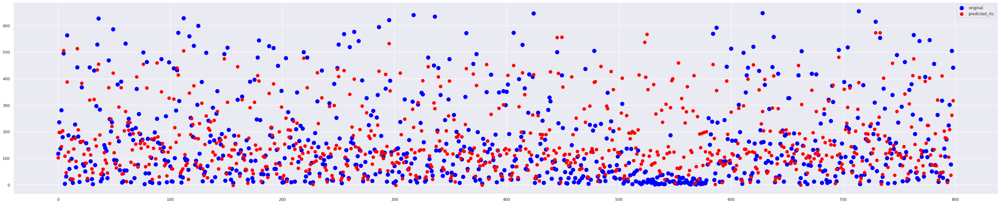

MAE Train:  21.230650351410773
MAE Test:  71.22065706351522
MSE Train:  935.9904643030486
MSE Test:  11650.784697206018
RMSE Train:  30.593961239157125
RMSE Test:  107.93880070301883
R2 Train:  0.9582422166549925
R2 Test:  0.5374821823288045
Mape Train:  44.54103422328431
Mape Test:  245.25259019465602
Explanied Variance Score Train:  0.9582435341207509
Explanied Variance Score Test:  0.540183986994222
CoV Test:  0.6779478489585262
2020_01:  0    13360.0
dtype: float32
2020_02:  0    13506.0
dtype: float32
2020_03:  0    13915.0
dtype: float32
2020_04:  0    12456.0
dtype: float32


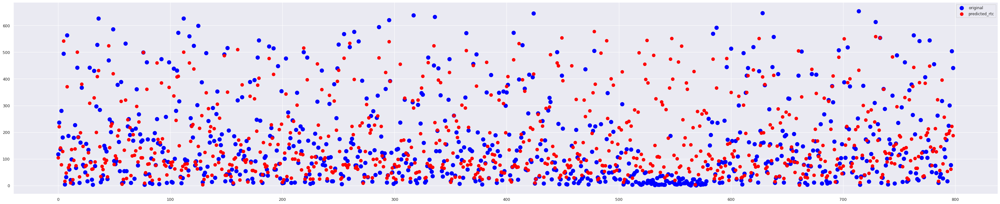

MAE Train:  21.85656090368529
MAE Test:  71.31710844463639
MSE Train:  992.5962264310438
MSE Test:  11483.66577800937
RMSE Train:  31.505495178318398
RMSE Test:  107.16186718235815
R2 Train:  0.9557168371333327
R2 Test:  0.5441165404263273
Mape Train:  44.704949733922334
Mape Test:  249.95153451876746
Explanied Variance Score Train:  0.9557183881151654
Explanied Variance Score Test:  0.5472385223792995
CoV Test:  0.6730680429417364
2020_01:  0    12842.0
dtype: float32
2020_02:  0    12771.0
dtype: float32
2020_03:  0    12568.0
dtype: float32
2020_04:  0    12092.0
dtype: float32


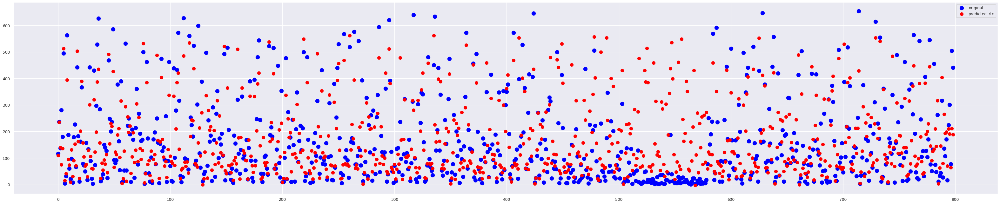

In [ ]:
XGB(X_train_1, y_train_1, X_test_1, y_test_1, X_1_2020)
XGB(X_train_2, y_train_2, X_test_2, y_test_2, X_2_2020)
XGB(X_train_3, y_train_3, X_test_3, y_test_3, X_3_2020)

The analyzes showed that the removal of outliers from the dataset both positively and negatively affected the results. Although the error metrics have decreased as desired, the significant decrease in the 2020 forecasts creates the feeling that the forecasts are wrong. For this reason, the predictions for 2020 were calculated without removing the outliers.

***MOVING AVERAGES***

Since the results obtained in the previous analyzes were not satisfactory, it was necessary to consider of adding new parameters to the dataset. In this section, three additional columns have been added to the main data set in order to better model the upward trend in sales data: Sales data of the previous month, sales data of three months ago, average sales quantity of the last three months.

Since the XGBOOST algorithm performs well in general and can work with missing data, it has been chosen in this section.

In [ ]:
ProductX_2 = ProductX.copy()

ProductX_2 = pd.read_csv('gdrive/My Drive/VitrA/Product_X_ALL_18092021.csv', sep=";")
df_heat = pd.read_excel('gdrive/My Drive/VitrA/20210914C0A8-Aylık Ortalama Sıcaklık (°C).xlsx')

ProductX_2['Quantity'] = ProductX_2['Quantity'].fillna(0)

In [ ]:
ProductX_2 = ProductX_2[df.Quantity != 0]
ProductX_2 = ProductX_2.reset_index(drop=True)

In [ ]:
df_last_2 = pd.merge(ProductX_2, df_heat)
df_last_2.reset_index(inplace=False)
df_last_2

,Period,Province,Month,Year,Season,BigCity,Region,Borsa,DolarB,DolarS,CPI(Year),CPI(Month),Male,Male_Province,Male_Rural,Trends_Eczacıbaşı,Trends_Prostat,Quantity,Last_Month,3_monBef,Ave_3_Mot,Med_Deg
0,201701,Adana,1,2017,winter,1,ME,"2,379","3,7468","3,7536","9,22","2,46",1101973,1101973,0,6,28,910.0,0.0,NaN,NaN,8.7
1,201701,Adıyaman,1,2017,winter,0,SE,"2,379","3,7468","3,7536","9,22","2,46",307819,203955,103865,0,0,44.0,0.0,NaN,NaN,3.8
2,201701,Afyon,1,2017,winter,0,AE,"2,379","3,7468","3,7536","9,22","2,46",354456,207099,147357,0,24,236.0,NaN,NaN,NaN,-2.4
3,201701,Ağrı,1,2017,winter,0,EA,"2,379","3,7468","3,7536","9,22","2,46",281105,158643,122462,0,0,126.0,NaN,NaN,NaN,-13.4
4,201701,Aksaray,1,2017,winter,0,CE,"2,379","3,7468","3,7536","9,22","2,46",197601,130684,66917,0,0,70.0,NaN,NaN,NaN,-1.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3200,202004,Uşak,4,2020,spring,0,AE,"4,78","5,9303","5,9303","1,35","12,15",100673,100295,136286,0,0,0.0,NaN,NaN,NaN,12.1
3201,202004,Van,4,2020,spring,1,EA,"4,78","5,9303","5,9303","1,35","12,15",92837,93453,123674,17,31,0.0,NaN,NaN,NaN,8.6
3202,202004,Yalova,4,2020,spring,0,MA,"4,78","5,9303","5,9303","1,35","12,15",53991,54228,72283,0,0,0.0,NaN,NaN,NaN,11.6
3203,202004,Yozgat,4,2020,spring,0,CE,"4,78","5,9303","5,9303","1,35","12,15",209819,210125,271936,0,53,0.0,NaN,NaN,NaN,7.4


In [ ]:
ProductX_copy = df_last_2.copy()

In [ ]:
ProductX_copy['CPI(Year)']=ProductX_copy['CPI(Year)'].str.replace(',','.')
ProductX_copy['CPI(Month)']=ProductX_copy['CPI(Month)'].str.replace(',','.')
ProductX_copy['Borsa']=ProductX_copy['Borsa'].str.replace(',','.')
ProductX_copy['DolarB']=ProductX_copy['DolarB'].str.replace(',','.')
ProductX_copy['DolarS']=ProductX_copy['DolarS'].str.replace(',','.')

ProductX_copy['CPI(Year)']=ProductX_copy['CPI(Year)'].astype(float)
ProductX_copy['CPI(Month)']=ProductX_copy['CPI(Month)'].astype(float)
ProductX_copy['Period'] = ProductX_copy['Period'].astype(int)
ProductX_copy['Year'] = ProductX_copy['Year'].astype(int)
ProductX_copy['Month'] = ProductX_copy['Month'].astype(int)
ProductX_copy['Borsa'] = ProductX_copy['Borsa'].astype(float)
ProductX_copy['DolarB'] = ProductX_copy['DolarB'].astype(float)
ProductX_copy['DolarS'] = ProductX_copy['DolarS'].astype(float)
ProductX_copy['Male'] = ProductX_copy['Male'].astype(float)
ProductX_copy['Male_Province'] = ProductX_copy['Male_Province'].astype(float)
ProductX_copy['Male_Rural'] = ProductX_copy['Male_Rural'].astype(float)

In [ ]:
ProductX_copy['Province'] = labelencoder.fit_transform(ProductX_copy['Province'].values)
ProductX_copy['Season'] = labelencoder.fit_transform(ProductX_copy['Season'].values)
ProductX_copy['Region'] = labelencoder.fit_transform(ProductX_copy['Region'].values)

In [ ]:
ProductX_2.head(245)

,Period,Province,Month,Year,Season,BigCity,Region,Borsa,DolarB,DolarS,CPI(Year),CPI(Month),Male,Male_Province,Male_Rural,Trends_Eczacıbaşı,Trends_Prostat,Quantity,Last_Month,3_monBef,Ave_3_Mot
0,201701,Adana,1,2017,winter,1,ME,"2,379","3,7468","3,7536","9,22","2,46",1101973,1101973,0,6,28,910.0,0.0,NaN,NaN
1,201701,Adıyaman,1,2017,winter,0,SE,"2,379","3,7468","3,7536","9,22","2,46",307819,203955,103865,0,0,44.0,0.0,NaN,NaN
2,201701,Afyon,1,2017,winter,0,AE,"2,379","3,7468","3,7536","9,22","2,46",354456,207099,147357,0,24,236.0,NaN,NaN,NaN
3,201701,Ağrı,1,2017,winter,0,EA,"2,379","3,7468","3,7536","9,22","2,46",281105,158643,122462,0,0,126.0,NaN,NaN,NaN
4,201701,Aksaray,1,2017,winter,0,CE,"2,379","3,7468","3,7536","9,22","2,46",197601,130684,66917,0,0,70.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
240,201704,Adana,4,2017,spring,1,ME,"3,104","3,6495","3,6561","11,87","1,31",1103873,1103873,0,8,29,764.0,895.0,910.0,907.0
241,201704,Adıyaman,4,2017,spring,0,SE,"3,104","3,6495","3,6561","11,87","1,31",308292,205019,103272,0,0,42.0,80.0,44.0,53.0
242,201704,Afyon,4,2017,spring,0,BS,"3,104","3,6495","3,6561","11,87","1,31",354451,207499,146952,20,0,228.0,231.0,236.0,218.0
243,201704,Ağrı,4,2017,spring,0,EA,"3,104","3,6495","3,6561","11,87","1,31",280252,158386,121867,0,85,126.0,113.0,126.0,121.0


In [ ]:
ProductX_copy.tail(325)

,Period,Province,Month,Year,Season,BigCity,Region,Borsa,DolarB,DolarS,CPI(Year),CPI(Month),Male,Male_Province,Male_Rural,Trends_Eczacıbaşı,Trends_Prostat,Quantity,Last_Month,3_monBef,Ave_3_Mot,Med_Deg
2880,201912,73,12,2019,3,0,1,3.651,5.8467,5.8572,11.84,0.74,294494.0,294494.0,294494.0,0,0,441.0,310.0,17.0,218.0,10.3
2881,202001,0,1,2020,3,1,5,4.113,5.9303,5.9303,1.35,12.15,1117906.0,1117906.0,0.0,4,33,0.0,614.0,754.0,742.0,9.9
2882,202001,1,1,2020,3,0,6,4.113,5.9303,5.9303,1.35,12.15,217079.0,217215.0,315977.0,0,15,0.0,52.0,77.0,70.0,5.7
2883,202001,2,1,2020,3,0,0,4.113,5.9303,5.9303,1.35,12.15,216097.0,216150.0,362394.0,40,30,0.0,231.0,251.0,206.0,-0.6
2884,202001,10,1,2020,3,0,3,4.113,5.9303,5.9303,1.35,12.15,157066.0,157280.0,277674.0,0,0,0.0,194.0,151.0,149.0,-11.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3200,202004,69,4,2020,1,0,0,4.780,5.9303,5.9303,1.35,12.15,100673.0,100295.0,136286.0,0,0,0.0,NaN,NaN,NaN,12.1
3201,202004,70,4,2020,1,1,3,4.780,5.9303,5.9303,1.35,12.15,92837.0,93453.0,123674.0,17,31,0.0,NaN,NaN,NaN,8.6
3202,202004,71,4,2020,1,0,4,4.780,5.9303,5.9303,1.35,12.15,53991.0,54228.0,72283.0,0,0,0.0,NaN,NaN,NaN,11.6
3203,202004,72,4,2020,1,0,2,4.780,5.9303,5.9303,1.35,12.15,209819.0,210125.0,271936.0,0,53,0.0,NaN,NaN,NaN,7.4


In [ ]:
##################--- DataFrames for Train ---##################


# Dataset which excluded the Period, DolarB, Male_Rural variables:
X_1 = ProductX_copy.iloc[240:2881, [1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12 ,13, 15, 16, 18, 19, 20, 21]].values
y_1 = ProductX_copy.iloc[240:2881, 17].values

# Dataset which excluded the Period, Province, DolarB, Male_Rural variables:
X_2 = ProductX_copy.iloc[240:2881, [2, 3, 4, 5, 6, 7, 9, 10, 11 ,13, 15, 16, 18, 19, 20, 21]].values
y_2 = ProductX_copy.iloc[240:2881, 17].values

# Dataset which excluded the Period, Province, DolarB, Borsa, Male, Male_Rural variables:
X_3 = ProductX_copy.iloc[240:2881, [2, 3, 4, 5, 6, 9, 10, 11 ,13, 15, 16, 18, 19, 20, 21]].values
y_3 = ProductX_copy.iloc[240:2881, 17].values

##################--- DataFrames for Test ---##################

# Dataset which excluded the Period, DolarB, Male_Rural variables:
X_1_2020 = ProductX_copy.iloc[2881:, [1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12 ,13, 15, 16, 18, 19, 20, 21]].values
y_1_2020 = ProductX_copy.iloc[2881:, 17].values

# Dataset which excluded the Period, Province, DolarB, Male_Rural variables:
X_2_2020 = ProductX_copy.iloc[:2881, [2, 3, 4, 5, 6, 7, 9, 10, 11 ,13, 15, 16, 18, 19, 20, 21]].values
y_2_2020 = ProductX_copy.iloc[2881:, 17].values

# Dataset which excluded the Period, Province, DolarB, Borsa, Male, Male_Rural variables:
X_3_2020 = ProductX_copy.iloc[2881:, [2, 3, 4, 5, 6, 9, 10, 11 ,13, 15, 16, 18, 19, 20, 21]].values
y_3_2020 = ProductX_copy.iloc[2881:, 17].values

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_1 = scaler.fit_transform(X_1)
X_2 = scaler.fit_transform(X_2)
X_3 = scaler.fit_transform(X_3)

X_1_2020 = scaler.fit_transform(X_1_2020)
X_2_2020 = scaler.fit_transform(X_2_2020)
X_3_2020 = scaler.fit_transform(X_3_2020)

# Splitting dataset:
from sklearn.model_selection import train_test_split

X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(X_1, y_1, test_size=0.3, shuffle=False, random_state = 0)
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X_2, y_2, test_size=0.3, shuffle=False, random_state = 0)
X_train_3, X_test_3, y_train_3, y_test_3 = train_test_split(X_3, y_3, test_size=0.3, shuffle=False, random_state = 0)

In [ ]:
XGB(X_train_1, y_train_1, X_test_1, y_test_1, X_1_2020)
XGB(X_train_2, y_train_2, X_test_2, y_test_2, X_2_2020)
XGB(X_train_3, y_train_3, X_test_3, y_test_3, X_3_2020)

MAE Train:  22.453458148163634
MAE Test:  103.52282076014245
MSE Train:  1095.0890688172792
MSE Test:  45564.83770138527
RMSE Train:  33.09213001330194
RMSE Test:  213.45921788806703
R2 Train:  0.9920042453981872
R2 Test:  0.7678423742229383
Mape Train:  28.891036659713354
Mape Test:  226.87934821894697
Explanied Variance Score Train:  0.9920858362174696
Explanied Variance Score Test:  0.7723243650750626
CoV Test:  0.8712710828288484
2020_01:  0    19024.0
dtype: float32
2020_02:  0    13162.0
dtype: float32
2020_03:  0    12899.0
dtype: float32
2020_04:  0    1500.0
dtype: float32
MAE Train:  22.54667205469949
MAE Test:  103.83876518764231
MSE Train:  1101.5851959812765
MSE Test:  46373.10245282933
RMSE Train:  33.190137028660736
RMSE Test:  215.3441488706608
R2 Train:  0.9919568141525064
R2 Test:  0.763724180563953
Mape Train:  28.75123266785142
Mape Test:  222.87671348832453
Explanied Variance Score Train:  0.992039338711741
Explanied Variance Score Test:  0.7681502861724404
CoV Tes

Since the estimates obtained from these analyzes are quite low compared to previous years, it can been seen that the added columns have a negative effect on the model. Therefore, all estimations were made using the main data set made in the first section.

***TIME SERIES***

Since sales data changes depending on time, it is thought that the time series method can be used besides machine learning models.

In [ ]:
from dateutil.parser import parse 
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

In [ ]:
!pip install pmdarima

     |████████████████████████████████| 1.5 MB 8.1 MB/s 
     |████████████████████████████████| 9.5 MB 21.3 MB/s 
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2


In [ ]:
#ARIMA
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
import pmdarima as pm
from pmdarima.model_selection import train_test_split

from fbprophet import Prophet

from pandas import to_datetime

import itertools
import warnings

import datetime
from datetime import datetime
warnings.filterwarnings('ignore')

In [ ]:
df_ts = pd.read_csv('gdrive/My Drive/VitrA/TimeSeriesX.csv', sep=";")
df_ts

,Date,Quantity
0,2017-01-01,19375
1,2017-02-01,18863
2,2017-03-01,19959
3,2017-04-01,17891
4,2017-05-01,19651
5,2017-06-01,15839
6,2017-07-01,16534
7,2017-08-01,15378
8,2017-09-01,16552
9,2017-10-01,19671


In [ ]:
df_ts['Date'] = pd.to_datetime(df_ts['Date'])
df_ts

,Date,Quantity
0,2017-01-01,19375
1,2017-02-01,18863
2,2017-03-01,19959
3,2017-04-01,17891
4,2017-05-01,19651
5,2017-06-01,15839
6,2017-07-01,16534
7,2017-08-01,15378
8,2017-09-01,16552
9,2017-10-01,19671


In [ ]:
df_ts.dtypes

Date        datetime64[ns]
Quantity             int64
dtype: object

In [ ]:
# Settin "Date" as index of DataFrame:

df_ts.set_index('Date',inplace=True)
df_ts

,Quantity
Date,
2017-01-01,19375
2017-02-01,18863
2017-03-01,19959
2017-04-01,17891
2017-05-01,19651
2017-06-01,15839
2017-07-01,16534
2017-08-01,15378
2017-09-01,16552


In [ ]:
# Check point:

df_ts.to_csv('gdrive/My Drive/VitrA/ProductX_TS.csv')

Exploring data and it's trends:

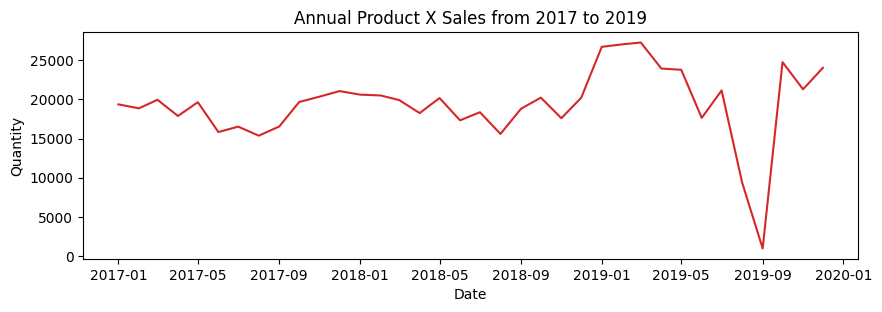

In [ ]:
# Time series data source: fpp pacakge in R.
import matplotlib.pyplot as plt

# Draw Plot
def plot_df(df, x, y, title="", xlabel='Date', ylabel='Quantity', dpi=100):
    plt.figure(figsize=(10,3), dpi=dpi)
    plt.plot(x, y, color='tab:red')
    plt.gca().set(title=title, xlabel=xlabel, ylabel=ylabel)
    plt.show()

plot_df(df_ts, x=df_ts.index, y=df_ts.Quantity, title='Annual Product X Sales from 2017 to 2019')    

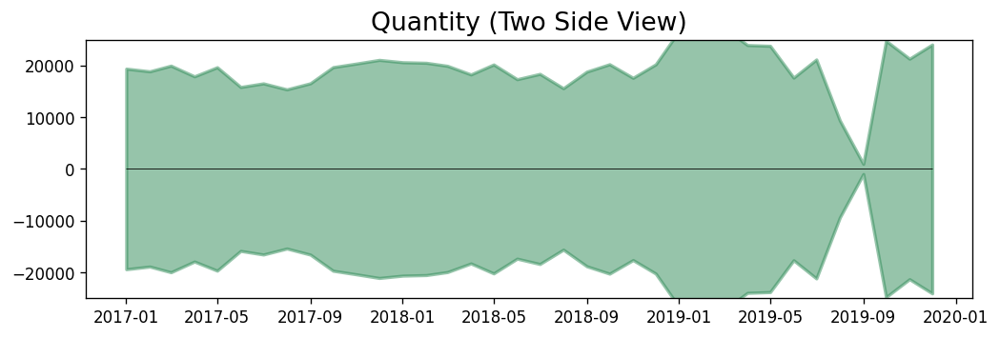

In [ ]:
# Import data

df_a = pd.read_csv('gdrive/My Drive/VitrA/ProductX_TS.csv', parse_dates=['Date'])

x = df_a['Date'].values
y1 = df_a['Quantity'].values

# Plot
fig, ax = plt.subplots(1, 1, figsize=(10,3), dpi= 120)
plt.fill_between(x, y1=y1, y2=-y1, alpha=0.5, linewidth=2, color='seagreen')
plt.ylim(-25000, 25000)
plt.title('Quantity (Two Side View)', fontsize=16)
plt.hlines(y=0, xmin=np.min(df_a.Date), xmax=np.max(df_a.Date), linewidth=.5)
plt.show()

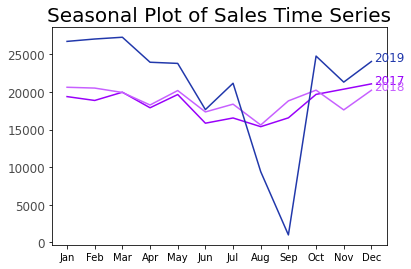

<Figure size 1440x720 with 0 Axes>

In [ ]:
# Prepare data
df_a['year'] = [d.year for d in df_a.Date]
df_a['month'] = [d.strftime('%b') for d in df_a.Date]
years = df_a['year'].unique()

# Prep Colors
np.random.seed(100)
mycolors = np.random.choice(list(mpl.colors.XKCD_COLORS.keys()), len(years), replace=False)

# Draw Plot

for i, y in enumerate(years):
    if i >= 0:        
        plt.plot('month', 'Quantity', data=df_a.loc[df_a['year']==y, :], color=mycolors[i], label=y)
        plt.text(df_a.loc[df_a.year==y, :].shape[0]-.9, df_a.loc[df_a.year==y, 'Quantity'][-1:].values[0], y, fontsize=12, color=mycolors[i])

# Decoration
#plt.gca().set(xlim=(-0.3, 11), ylim=(2, 30), ylabel='$Drug Sales$', xlabel='$Month$')
plt.yticks(fontsize=12, alpha=.7)
plt.title("Seasonal Plot of Sales Time Series", fontsize=20)
plt.figure(figsize=(20,10))
plt.show()

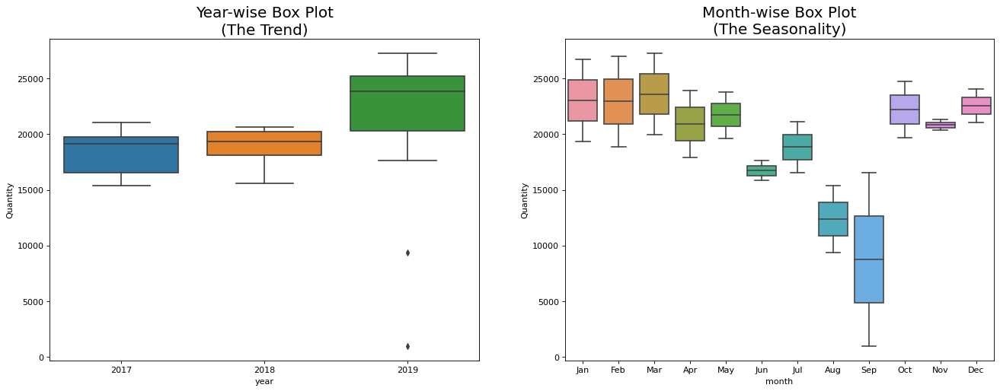

In [ ]:
# Draw Plot
fig, axes = plt.subplots(1, 2, figsize=(20,7), dpi= 80)
sns.boxplot(x='year', y='Quantity', data=df_a, ax=axes[0])
sns.boxplot(x='month', y='Quantity', data=df_a.loc[df_a.year.isin([2017, 2019]), :]) #?

# Set Title
axes[0].set_title('Year-wise Box Plot\n(The Trend)', fontsize=18); 
axes[1].set_title('Month-wise Box Plot\n(The Seasonality)', fontsize=18)
plt.show()

Checking the data if it is stationary or not:

In [ ]:
from statsmodels.tsa.stattools import adfuller, kpss

# ADF Test
result = adfuller(df_a['Quantity'].values, autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

# KPSS Test
result = kpss(df_a['Quantity'].values, regression='c')
print('\nKPSS Statistic: %f' % result[0])
print('p-value: %f' % result[1])
for key, value in result[3].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

ADF Statistic: -0.8191238886678783
p-value: 0.8134399278426852
Critial Values:
   1%, -3.7238633119999998
Critial Values:
   5%, -2.98648896
Critial Values:
   10%, -2.6328004

KPSS Statistic: 0.192635
p-value: 0.100000
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


Since the p values is greater than 0.05 the series is not stationary.

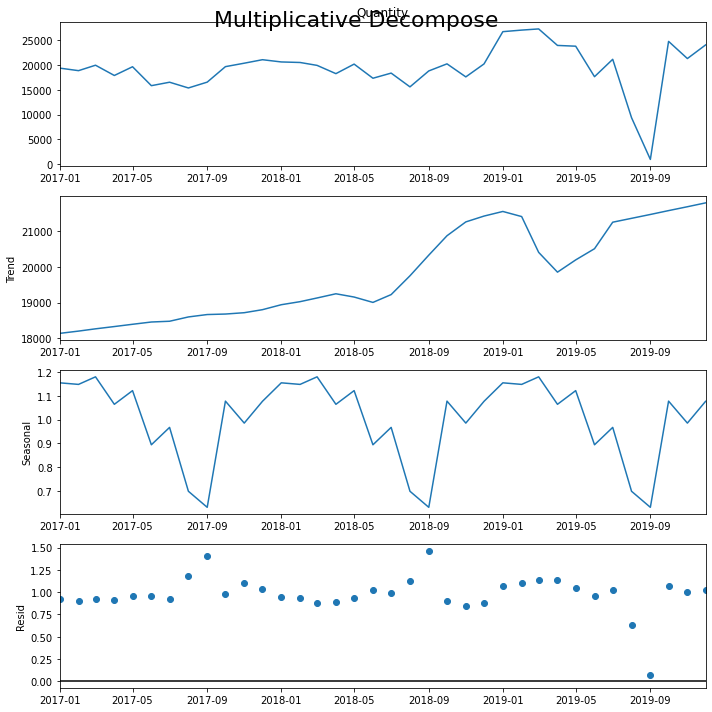

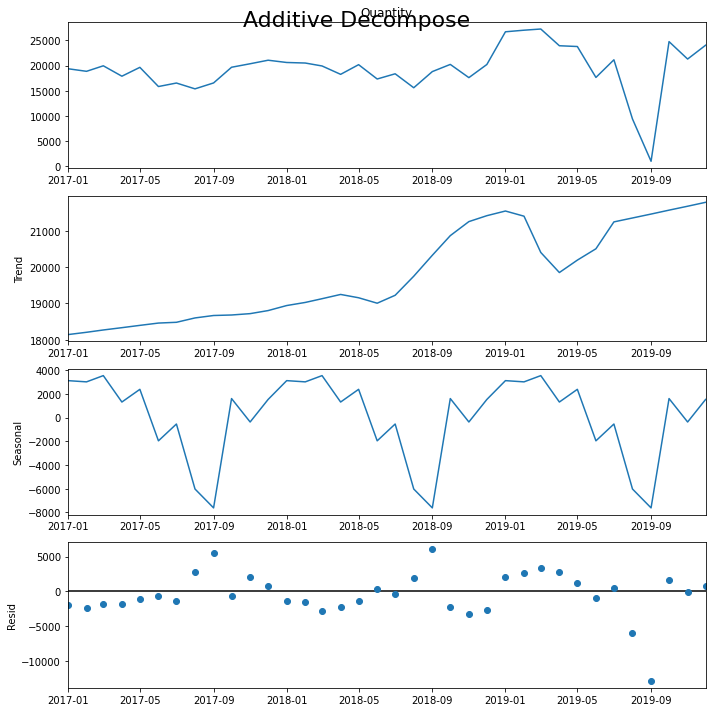

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse

df_a = pd.read_csv('gdrive/My Drive/VitrA/ProductX_TS.csv', parse_dates=['Date'], index_col='Date')

# Multiplicative Decomposition 
result_mul = seasonal_decompose(df_a['Quantity'], model='multiplicative', extrapolate_trend='freq')

# Additive Decomposition
result_add = seasonal_decompose(df_a['Quantity'], model='additive', extrapolate_trend='freq')

# Plot
plt.rcParams.update({'figure.figsize': (10,10)})
result_mul.plot().suptitle('Multiplicative Decompose', fontsize=22)
result_add.plot().suptitle('Additive Decompose', fontsize=22)
plt.show()

In [ ]:
# Extract the Components ----
# Actual Values = Product of (Seasonal * Trend * Resid)
df_reconstructed = pd.concat([result_mul.seasonal, result_mul.trend, result_mul.resid, result_mul.observed], axis=1)
df_reconstructed.columns = ['seas', 'trend', 'resid', 'actual_values']
df_reconstructed.head()

,seas,trend,resid,actual_values
Date,,,,
2017-01-01,1.154504,18141.321970,0.925076,19375.0
2017-02-01,1.147908,18204.928030,0.902640,18863.0
2017-03-01,1.179699,18268.534091,0.926112,19959.0
2017-04-01,1.064270,18332.140152,0.917000,17891.0
2017-05-01,1.121730,18395.746212,0.952311,19651.0


In [ ]:
df_reconstructed = pd.concat([result_add.seasonal, result_add.trend, result_add.resid, result_add.observed], axis=1)
df_reconstructed.columns = ['seas', 'trend', 'resid', 'actual_values']
df_reconstructed.head()

,seas,trend,resid,actual_values
Date,,,,
2017-01-01,3117.476698,18141.321970,-1883.798668,19375.0
2017-02-01,3013.983011,18204.928030,-2355.911042,18863.0
2017-03-01,3541.155991,18268.534091,-1850.690082,19959.0
2017-04-01,1313.453971,18332.140152,-1754.594122,17891.0
2017-05-01,2384.210284,18395.746212,-1128.956496,19651.0


In [ ]:
from statsmodels.tsa.stattools import adfuller, kpss

# ADF Test
result = adfuller(df_a['Quantity'].values, autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

# KPSS Test
result = kpss(df_a['Quantity'].values, regression='c')
print('\nKPSS Statistic: %f' % result[0])
print('p-value: %f' % result[1])
for key, value in result[3].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

ADF Statistic: -0.8191238886678783
p-value: 0.8134399278426852
Critial Values:
   1%, -3.7238633119999998
Critial Values:
   5%, -2.98648896
Critial Values:
   10%, -2.6328004

KPSS Statistic: 0.192635
p-value: 0.100000
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


In [ ]:
X_train = df_a[0:25]
X_valid = df_a[24:36]

print('X_train Shape', X_train.shape)
print('X_Valid Shape', X_valid.shape)

X_train Shape (25, 1)
X_Valid Shape (12, 1)


Text(0.5, 1.0, 'Quantities detrended by subtracting the least squares fit')

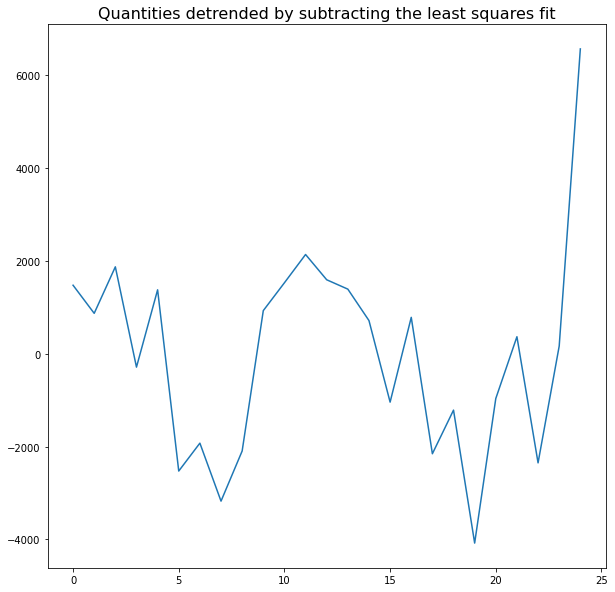

In [ ]:
# Using scipy: Subtract the line of best fit
from scipy import signal
detrended = signal.detrend(X_train.Quantity.values)
plt.plot(detrended)
plt.title('Quantities detrended by subtracting the least squares fit', fontsize=16)

Trying to transform the series to stationary with log:

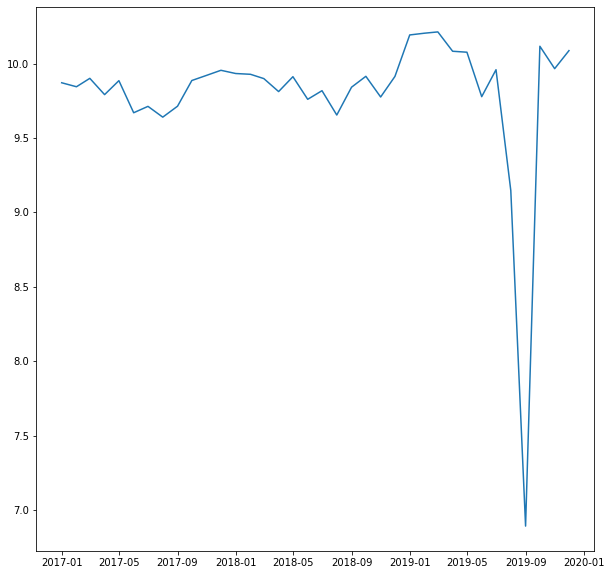

In [ ]:
from numpy import log
from matplotlib import pyplot
logTrans = log(df_a)
pyplot.plot(logTrans)

In [ ]:
from statsmodels.tsa.stattools import adfuller, kpss

# ADF Test
result = adfuller(logTrans['Quantity'].values, autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

# KPSS Test
result = kpss(logTrans['Quantity'].values, regression='c')
print('\nKPSS Statistic: %f' % result[0])
print('p-value: %f' % result[1])
for key, value in result[3].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

ADF Statistic: -2.12835782322565
p-value: 0.23326569472631403
Critial Values:
   1%, -3.7238633119999998
Critial Values:
   5%, -2.98648896
Critial Values:
   10%, -2.6328004

KPSS Statistic: 0.201758
p-value: 0.100000
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


The p-value is still greater than 0.05. So differencing must be applied:

In [ ]:
X_train_st = df_a[0:25]
X_valid_st = df_a[24:36]

print('X_train Shape', X_train.shape)
print('X_Valid Shape', X_valid.shape)

X_train Shape (25, 1)
X_Valid Shape (12, 1)


In [ ]:
X_train_st = X_train_st.diff()
X_train_st.dropna(inplace=True)
X_train_st = X_train_st.diff()
X_train_st.dropna(inplace=True)

In [ ]:
df_stationary = df_a.diff().dropna()
df_stationary

,Quantity
Date,
2017-02-01,-512.0
2017-03-01,1096.0
2017-04-01,-2068.0
2017-05-01,1760.0
2017-06-01,-3812.0
2017-07-01,695.0
2017-08-01,-1156.0
2017-09-01,1174.0
2017-10-01,3119.0


In [ ]:
from statsmodels.tsa.stattools import adfuller, kpss

# ADF Test
result = adfuller(df_stationary['Quantity'].values, autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

# KPSS Test
result = kpss(df_stationary['Quantity'].values, regression='c')
print('\nKPSS Statistic: %f' % result[0])
print('p-value: %f' % result[1])
for key, value in result[3].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

ADF Statistic: -3.1141235258739495
p-value: 0.02552548702462708
Critial Values:
   1%, -3.7377092158564813
Critial Values:
   5%, -2.9922162731481485
Critial Values:
   10%, -2.635746736111111

KPSS Statistic: 0.188153
p-value: 0.100000
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


The p-value is lower than 0.05.

In [ ]:
X_train_st = df_stationary[0:25]
X_valid_st = df_stationary[24:36]

Text(0.5, 1.0, 'Quantities detrended by subtracting the least squares fit')

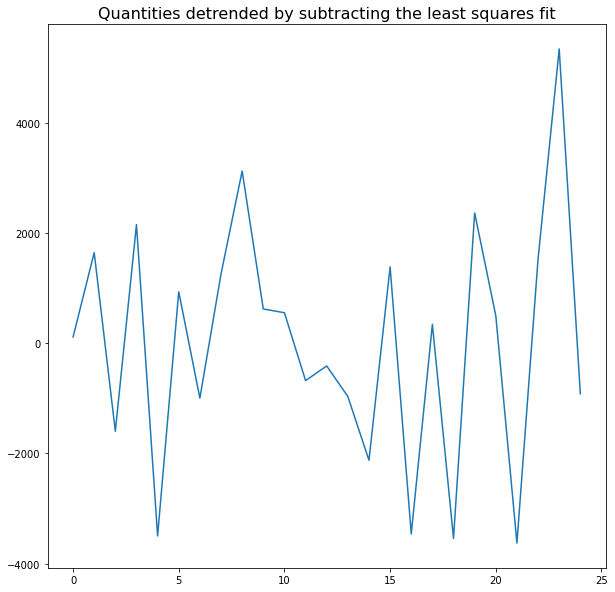

In [ ]:
# Using scipy: Subtract the line of best fit
from scipy import signal
detrended = signal.detrend(X_train_st.Quantity.values)
plt.plot(detrended)
plt.title('Quantities detrended by subtracting the least squares fit', fontsize=16)

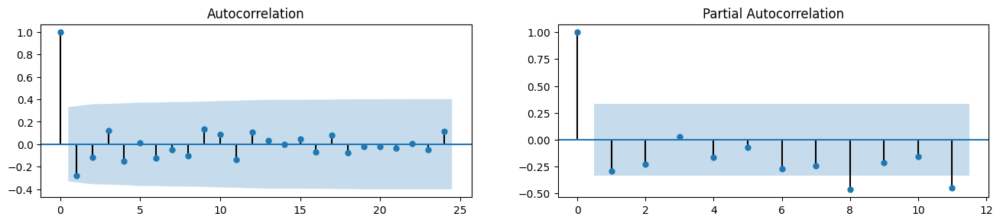

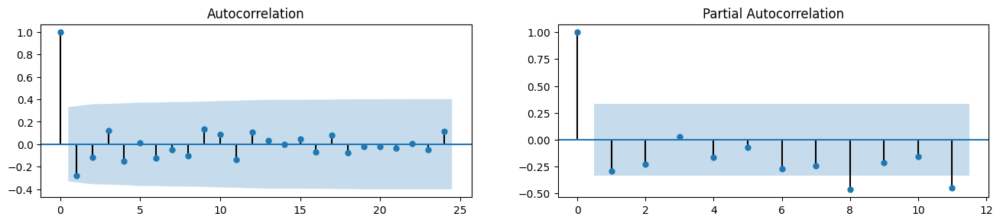

In [ ]:
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf


# Calculate ACF and PACF upto 50 lags
# acf_50 = acf(df.value, nlags=50)
# pacf_50 = pacf(df.value, nlags=50)

# Draw Plot
fig, axes = plt.subplots(1,2,figsize=(16,3), dpi= 100)
plot_acf(df_stationary.Quantity.tolist(), lags=24, ax=axes[0])
plot_pacf(df_stationary.Quantity.tolist(),lags=11, ax=axes[1])

In [ ]:
# Setting the Index for 6 years
index_7_years = pd.date_range(X_train_st.index[-1], freq='MS', periods = 12) 

index_7_years

DatetimeIndex(['2019-02-01', '2019-03-01', '2019-04-01', '2019-05-01',
               '2019-06-01', '2019-07-01', '2019-08-01', '2019-09-01',
               '2019-10-01', '2019-11-01', '2019-12-01', '2020-01-01'],
              dtype='datetime64[ns]', freq='MS')

In [ ]:
import itertools
p=d=q=range(0,11)
pdq = list(itertools.product(p,d,q))

for param in pdq:
    try:
        model_arima = ARIMA(X_train_st,order=param)
        model_arima_fit = model_arima.fit()
        print(param,model_arima_fit.aic)
    except:
        continue

(0, 0, 0) 460.9988338555662
(0, 0, 1) 462.20961322077153
(0, 0, 2) 464.08445870679327
(0, 0, 3) 465.8591723851739
(0, 0, 4) 467.5897132199592
(0, 0, 5) 465.94642473018223
(0, 0, 6) 468.3470306334232
(0, 0, 7) nan
(0, 0, 8) 469.68765555874495
(0, 0, 9) nan
(0, 0, 10) nan
(0, 1, 0) 464.39254086262326
(0, 1, 1) 447.3968445881063
(0, 1, 2) 448.2365958920172
(0, 1, 3) nan
(0, 1, 4) 451.6249033292676
(0, 1, 5) nan
(0, 1, 6) nan
(0, 2, 0) 471.9403057231138
(0, 2, 1) 451.3596574557841
(0, 2, 2) 438.30749769442485
(0, 2, 3) 438.627882465867
(0, 2, 4) 440.49892385145205
(0, 2, 5) 447.8477827572809
(0, 2, 6) nan
(0, 2, 7) 449.26622651948907
(0, 2, 8) nan
(0, 2, 9) 449.2129589384483
(1, 0, 0) 462.13870113251244
(1, 0, 3) 467.78594553675725
(1, 0, 4) 468.4482263626261
(1, 0, 5) 467.5197875520138
(1, 1, 0) 453.75486018009013
(1, 1, 1) 448.11660231058636
(1, 1, 2) 452.1195420091425
(1, 1, 3) 453.5535064659458
(1, 1, 4) 454.01298776955235
(1, 2, 0) 456.8859550289187
(1, 2, 1) 441.9962885116065
(1, 2, 

In [ ]:
from sklearn.metrics import mean_squared_error

# Running ARIMA with random numbers
model_arima = ARIMA(X_train_st, order=(0,2,2)) 
model_arima_fit = model_arima.fit(disp=-1)

# Saving ARIMA predictions
fcast1 = model_arima_fit.forecast(12)[0]

# Passing the same index as the others
fcast1 = pd.Series(fcast1, index=index_7_years)
fcast1 = fcast1.rename("Arima") 
print(fcast1)

# Ploting the predictions
#fig, ax = plt.subplots(figsize=(35,12))
#chart = sns.lineplot(x='Date', y='Quantity', data = X_train)
#chart.set_title('AU')
#fcast1.plot(ax=ax, color='red', marker="o", legend=True)
#X_valid.plot(ax=ax, color='blue', marker="o", legend=True)
print(fcast1.values)
print('The MSE of ARIMA is:', mean_squared_error(X_valid['Quantity'].values, fcast1.values, squared=False))

2019-02-01     2678.866544
2019-03-01     3443.120588
2019-04-01     4223.636922
2019-05-01     5020.415544
2019-06-01     5833.456455
2019-07-01     6662.759656
2019-08-01     7508.325145
2019-09-01     8370.152923
2019-10-01     9248.242990
2019-11-01    10142.595346
2019-12-01    11053.209991
2020-01-01    11980.086924
Freq: MS, Name: Arima, dtype: float64
[ 2678.86654367  3443.12058819  4223.63692165  5020.41554403
  5833.45645533  6662.75965556  7508.32514472  8370.1529228
  9248.24298981 10142.59534574 11053.2099906  11980.08692438]
The MSE of ARIMA is: 16294.93825066021


In [ ]:
X_valid_st

,Quantity
Date,
2019-02-01,316.0
2019-03-01,235.0
2019-04-01,-3324.0
2019-05-01,-154.0
2019-06-01,-6143.0
2019-07-01,3504.0
2019-08-01,-11761.0
2019-09-01,-8405.0
2019-10-01,23777.0


In [ ]:
X_valid_st['Quantity'].values

array([   316.,    235.,  -3324.,   -154.,  -6143.,   3504., -11761.,
        -8405.,  23777.,  -3461.,   2744.])

In [ ]:
# Setting the Index for 6 years
index_4_years = pd.date_range(df_a.index[-1], freq='MS', periods = 5) 

index_4_years

DatetimeIndex(['2019-12-01', '2020-01-01', '2020-02-01', '2020-03-01',
               '2020-04-01'],
              dtype='datetime64[ns]', freq='MS')

In [ ]:
# Running ARIMA with random numbers
model_arima = ARIMA(X_train_st, order=(0,2,2)) # start 2-0-0 and move to the best
model_arima_fit = model_arima.fit(disp=-1)

# Saving ARIMA predictions
fcast1 = model_arima_fit.forecast(5)[0]

# Passing the same index as the others
fcast1 = pd.Series(fcast1, index=index_4_years)
fcast1 = fcast1.rename("Arima") 
print(fcast1)

2019-12-01    2678.866544
2020-01-01    3443.120588
2020-02-01    4223.636922
2020-03-01    5020.415544
2020-04-01    5833.456455
Freq: MS, Name: Arima, dtype: float64


In [ ]:
# Running auto ARIMA 
auto_arima_model = pm.auto_arima(df_a, seasonal=False, m=5)

# Read more about setting m
# https://alkaline-ml.com/pmdarima/tips_and_tricks.html

# make your forecasts
fcast2 = auto_arima_model.predict(5) 
fcast2 = pd.Series(fcast2, index=index_4_years)
fcast2 = fcast2.rename("Auto Arima")
print(fcast2)

2019-12-01    21158.915482
2020-01-01    20071.964040
2020-02-01    19662.598539
2020-03-01    19508.424113
2020-04-01    19450.359246
Freq: MS, Name: Auto Arima, dtype: float64


The 2020 predictions with Auto ARIMA are similar to the ones with machine learning algorithms. So these are selected as the final results for time series model.

In [ ]:
df_base = pd.concat([df_a,df_a.shift(1)],axis=1)

In [ ]:
df_base.dropna(inplace=True)

In [ ]:
df_base.columns = ['Quantity','Shifted']
df_base

,Quantity,Shifted
Date,,
2017-02-01,18863,19375.0
2017-03-01,19959,18863.0
2017-04-01,17891,19959.0
2017-05-01,19651,17891.0
2017-06-01,15839,19651.0
2017-07-01,16534,15839.0
2017-08-01,15378,16534.0
2017-09-01,16552,15378.0
2017-10-01,19671,16552.0


Summations of Quantity and Shifted values are much more greater than the ones previos models and the actual 2017-2019 sales. So this part of the model is neglected.

In [ ]:
df_base['Value'] = df_base['Quantity']+df_base['Shifted']
df_base

,Quantity,Shifted,Value
Date,,,
2017-02-01,18863,19375.0,-512.0
2017-03-01,19959,18863.0,1096.0
2017-04-01,17891,19959.0,-2068.0
2017-05-01,19651,17891.0,1760.0
2017-06-01,15839,19651.0,-3812.0
2017-07-01,16534,15839.0,695.0
2017-08-01,15378,16534.0,-1156.0
2017-09-01,16552,15378.0,1174.0
2017-10-01,19671,16552.0,3119.0


In [ ]:
df_base.drop(['Quantity','Shifted'],axis=1,inplace=True)
df_base

,Value
Date,
2017-02-01,-512.0
2017-03-01,1096.0
2017-04-01,-2068.0
2017-05-01,1760.0
2017-06-01,-3812.0
2017-07-01,695.0
2017-08-01,-1156.0
2017-09-01,1174.0
2017-10-01,3119.0


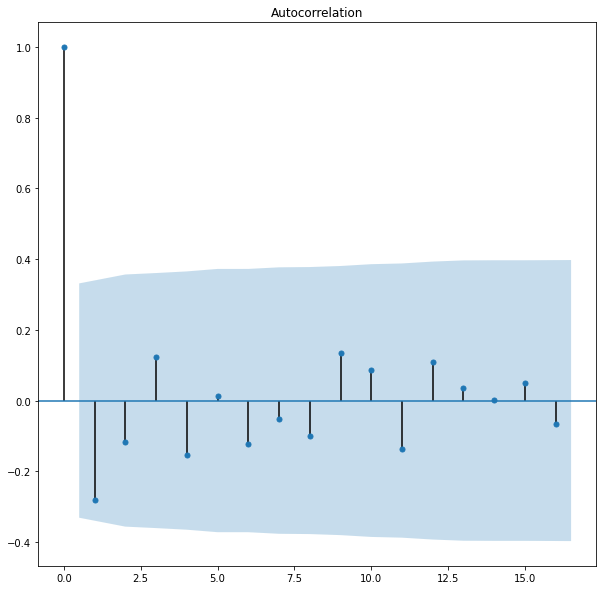

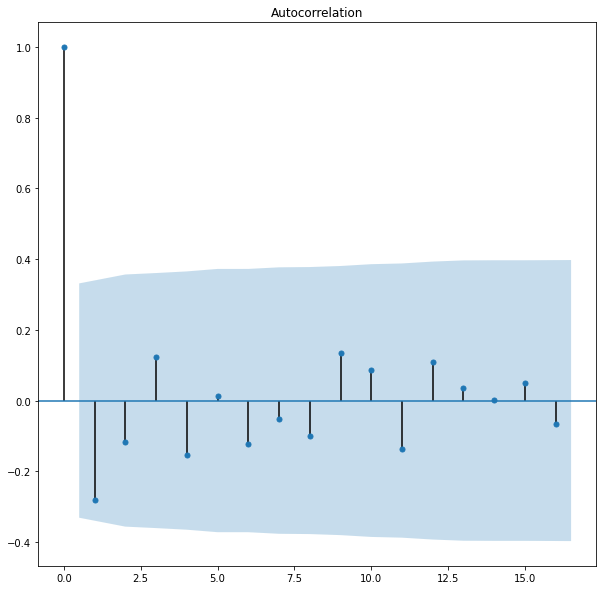

In [ ]:
plot_acf(df_base)

# **KERAS**

Since the desired results could not be obtained from machine learning algorithms and time series methods, the analyzes were also tested with KERAS. However there was no improvement in the results compared to other models.

In [ ]:
# Building model:

from keras import models
from keras import layers
def build_model():

  model = models.Sequential()
  model.add(layers.Dense(50, activation='relu',
                         input_shape=(X_train_1.shape[1],)))
  model.add(layers.Dense(50, activation='relu'))
  model.add(layers.Dense(50, activation='relu'))
  model.add(layers.Dense(1))
  model.compile(optimizer='Adam', loss='mse', metrics=['mae'])
  return model

In [ ]:
# K-Fold cross validation:

import numpy as np
k = 3
num_val_samples = len(X_train_1) // k
num_epochs = 100
all_scores = []
for i in range(k):
  print('processing fold #', i)
  # Prepare the validation data: data from partition # k
  val_data = X_train_1[i * num_val_samples: (i + 1) * num_val_samples]
  val_targets = y_train_1[i * num_val_samples: (i + 1) * num_val_samples]
  # Prepare the training data: data from all other partitions
  partial_train_data = np.concatenate(
      [X_train_1[:i * num_val_samples],
       X_train_1[(i + 1) * num_val_samples:]],
       axis=0)
  partial_train_targets = np.concatenate(
      [y_train_1[:i * num_val_samples],
       y_train_1[(i + 1) * num_val_samples:]],
       axis=0)
  # Build the Keras model (already compiled)
  model = build_model()
  # Train the model (in silent mode, verbose=0)
  model.fit(partial_train_data, partial_train_targets,
            epochs=num_epochs, batch_size=1, verbose=0)
  # Evaluate the model on the validation data
  val_mse, val_mae = model.evaluate(val_data, val_targets, verbose=0)
  all_scores.append(val_mae)

processing fold # 0
processing fold # 1
processing fold # 2


In [ ]:
print(all_scores)
np.mean(all_scores)

[93.53020477294922, 93.29318237304688, 135.75538635253906]


107.52625783284505

In [ ]:
num_epochs = 500
all_mae_histories = []
for i in range(k):
  print('processing fold #', i)
  # Prepare the validation data: data from partition # k
  val_data = X_train_1[i * num_val_samples: (i + 1) * num_val_samples]
  val_targets = y_train_1[i * num_val_samples: (i + 1) * num_val_samples]
  # Prepare the training data: data from all other partitions
  partial_train_data = np.concatenate(
      [X_train_1[:i * num_val_samples],
       X_train_1[(i + 1) * num_val_samples:]],
       axis=0)
  partial_train_targets = np.concatenate(
      [y_train_1[:i * num_val_samples],
       y_train_1[(i + 1) * num_val_samples:]],
       axis=0)
  # Build the Keras model (already compiled)
  model = build_model()
  # Train the model (in silent mode, verbose=0)
  history = model.fit(partial_train_data, partial_train_targets,
                      validation_data=(val_data, val_targets),
                      epochs=num_epochs, batch_size=1, verbose=0)
  mae_history = history.history['val_mae']
  all_mae_histories.append(mae_history)

processing fold # 0
processing fold # 1
processing fold # 2


In [ ]:
# Averaging K-fold validation scores

average_mae_history = [np.mean([x[i] for x in all_mae_histories]) for i in range(num_epochs)]

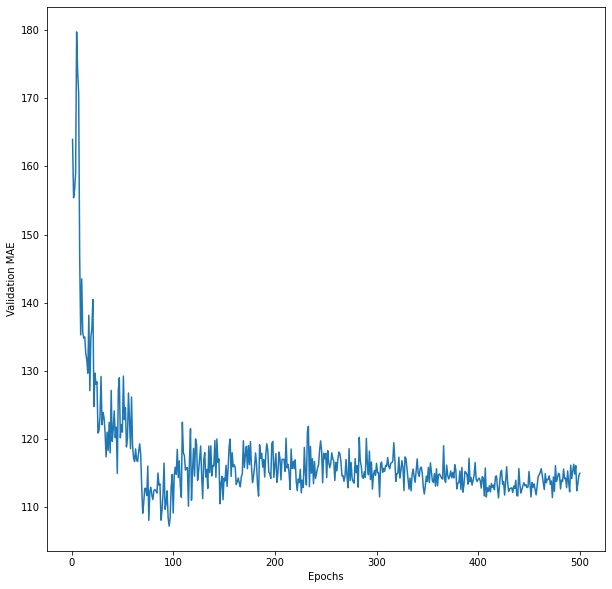

In [ ]:
# Plotting validation scores

import matplotlib.pyplot as plt
plt.plot(range(1, len(average_mae_history) + 1), average_mae_history)
plt.xlabel('Epochs')
plt.ylabel('Validation MAE')
plt.show()

It can be seen that on 75-th100th epoch Mean Absolute Error of validation stops to improve. So the model will be build with that information:

In [ ]:
# Get a fresh, compiled model.
model = build_model()
# Train it on the entirety of the data.
model.fit(X_train_1, y_train_1,
          epochs=100, batch_size=32, verbose=0)
test_mse_score, test_mae_score = model.evaluate(X_test_1, y_test_1)

19/19 [==============================] - 0s 1ms/step - loss: 88396.5312 - mae: 144.3741


Since there was no promising improvement in the results despite long operation time compared to other methods, neural networks with KERAS were not further examined and not reported in the main presentation.